# Import libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import MinMaxScaler
import os
import matplotlib.dates as mdates
import seaborn as sns
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tsa.stattools import grangercausalitytests

import warnings
warnings.filterwarnings("ignore")

In [2]:
# Define start and end dates for the weekly data
start_date = pd.to_datetime('09/01/2011')  # Adjusted for weekly data
end_date = pd.to_datetime('24/12/2023')    # Adjusted for weekly data

file_path="C:/Users/maxim/Desktop/S8/Projet/Excel/"
btc=pd.read_excel(file_path + "weekly/btc.xlsx")
all_data=[]
all_data.append(btc)

# Filter btc data for the specified weekly date range
btc_range = btc[(btc['Date'] >= start_date) & (btc['Date'] <= end_date)]
btc = btc_range.reset_index(drop=True)  # Reset index without inplace=True
all_data[0] = btc.copy()  # Assign a copy of btc to all_data[0]

# Reading all of our features by accessing to their excel ticker

In [3]:
all_data_ticker=['AMAZON','APPLE','DowJones','google','Nasdaq','natural gas','S&P','TESLA','VIX','wti','USYC2Y10',
                 'FDTR','CL1 COMB Comdty','IUTPELC','NG1 COMB Comdty','CESIUSD','SOX','federal_rate_target','brent',
                 'Cac40','ftse','GOLD','EURR002W','TED SPREAD EUR','GETB1','DEYC2Y10','BDIY','CO1 COMB Comdty',
                 'CESIEUR','TSEMIL','NKY','BOJDPBAL','TED SPREAD JPN','JPYC2Y10','CESIJPY','eurodollar','gbpusd',
                 'renminbiusd','yenusd','CESICNY','TED SPREAD US','GJGB3M','GCNY3M','active_address_count',
                 'addr_cnt_bal_sup_10K','addr_cnt_bal_sup_100K','avg-block-size','hashrate','mean_difficulty',
                 'miner-revenue-native-unit','miner-revenue-USD','mvrv','nvt','tx_count_second','tx-fees-btc',
                 'tx-fees-usd','val_in_addr_w_bal_sup_10K','val_in_addr_w_bal_sup_100K']

all_data_name=['Amazon','Apple','DowJones','Google','Nasdaq','Natural Gas','S&P','Tesla','Vix','WTI','Yield Curve US',
               'FED Policy Rates','WTI Crude Future','USD Electricity Price Index','Natural Gas Future',
               'CITI US Economic Surprise Index','PHLX Semiconductor Sector Index (Chg)','USFederal Rate Target','Brent',
               'Cac40','FTSE','GOLD','ECB Policy Rates','TED Spread Europe','Tx Gov. Allemand 3 mois','Yield Curve Germany',
               'Baltic Dry','Brent Crude Future','CITI European Economic Surprise Index','Stoxx Europe TM Semiconductor Index (Chg)',
               'Nikkei','BOJ Policy Rates','TED Spread Japan','Yield Curve Japan','CITI Japan Economic Surprise Index','Euro/Dollar',
               'Gbp/Dollar','Renminbi/Dollar','Yen/Dollar','CITI Chinese Economic Surprise Index','TED Spread US',
               'Generic Japan 3 Month Government Bond','China Government Bond Generic Bid Yield 3 month','Active Addresses',
               'addr_cnt_bal_sup_10K','addr_cnt_bal_sup_100K','avg-block-size','hashrate','mean_difficulty',
               'miner-revenue-native-unit','miner-revenue-USD','mvrv','nvt','tx_count_second','tx-fees-btc',
               'tx-fees-usd','val_in_addr_w_bal_sup_10K','val_in_addr_w_bal_sup_100K']

for ticker in all_data_ticker:
    all_data.append(pd.read_excel(file_path+"weekly/"+ticker+".xlsx"))

# Preprocessing data

In [4]:
# Keeping only the date and 'raw datas' --> mostly prices 
keep_columns=['Date','Dernier Prix']

# Iterate through all_data and keep only the specified columns
for element in all_data:
    element = element[keep_columns]

# Iterate through all_data and preprocess each element
for i, element in enumerate(all_data):
    element = element[keep_columns].copy()  # Copy the selected columns
    element['Date'] = pd.to_datetime(element['Date'])  # Convert 'Date' column to datetime
    # Drop rows with 'Date' values earlier than start_date
    element.drop(element[element['Date'] < start_date].index, inplace=True)
    all_data[i] = element  # Update all_data with preprocessed element

# Find common dates among all datasets
common_dates_all = set(btc['Date'])
lenmax = len(btc)

# Preprocess each dataset to keep only common dates
for i, element in enumerate(all_data):
    common_dates_all = common_dates_all.intersection(set(element['Date']))
    element = element[element['Date'].isin(common_dates_all)].copy()
    all_data[i] = element
    common_dates_all = set(btc['Date'])  # Reset common_dates_all to original btc dates

# Create DataFrame with all unique dates from btc dataset
all_dates = pd.DataFrame({'Date': pd.to_datetime(btc['Date'])})

# Merge all_dates with dates from other datasets (take into account that all our weekly datasets are indexed with the same dates)
for dataset in all_data[1:]:
    all_dates = pd.merge(all_dates, dataset[['Date']], on='Date', how='left')

# Fill missing values in datasets based on all_dates
all_datasets_filled = []
all_datasets_filled.append(btc)  # Append original btc dataset
for dataset in all_data[1:]:
    dataset_filled = pd.merge(all_dates, dataset, on='Date', how='left')  # Merge with all_dates
    dataset_filled = dataset_filled.fillna(method='ffill')  # Fill missing values with forward fill
    all_datasets_filled.append(dataset_filled)  # Append filled dataset to all_datasets_filled
    
# Path to the Excel file containing the merged data
excel_path="C:/Users/maxim/Desktop/S8/Projet/Excel/Merged_Datas_weekly.xlsx"

# List of tickers corresponding to each dataset
all_data_ticker=['btc','AMAZON','APPLE','DowJones','google','Nasdaq','natural gas','S&P','TESLA','VIX','wti','USYC2Y10',
                 'FDTR','CL1 COMB Comdty','IUTPELC','NG1 COMB Comdty','CESIUSD','SOX','federal_rate_target','brent',
                 'Cac40','ftse','GOLD','EURR002W','TED SPREAD EUR','GETB1','DEYC2Y10','BDIY','CO1 COMB Comdty',
                 'CESIEUR','TSEMIL','NKY','BOJDPBAL','TED SPREAD JPN','JPYC2Y10','CESIJPY','eurodollar','gbpusd',
                 'renminbiusd','yenusd','CESICNY','TED SPREAD US','GJGB3M','GCNY3M','active_address_count',
                 'addr_cnt_bal_sup_10K','addr_cnt_bal_sup_100K','avg-block-size','hashrate','mean_difficulty',
                 'miner-revenue-native-unit','miner-revenue-USD','mvrv','nvt','tx_count_second','tx-fees-btc',
                 'tx-fees-usd','val_in_addr_w_bal_sup_10K','val_in_addr_w_bal_sup_100K']

# Check if the number of tickers matches the number of DataFrames
if len(all_data_ticker) != len(all_datasets_filled):
    raise ValueError("Number of tickers and number of DataFrames do not match.")

# Assign unique names to columns based on tickers
for i, (df, ticker) in enumerate(zip(all_datasets_filled, all_data_ticker)):
    df.columns = [f"{ticker}_{col}" if col != "Date" else "Date" for col in df.columns]

# Concatenate DataFrames horizontally
merged_df = pd.concat(all_datasets_filled, axis=1)
merged_df=pd.DataFrame(merged_df)

# Extracting columns containing dates and data
data_columns = merged_df.iloc[0:, 1::2]  # Selecting every features columns
dates_columns = merged_df.iloc[0:, 0] # Selecting one date columns

# Creating a DataFrame with only dates and data columns
dataset_prices = pd.concat([dates_columns, data_columns], axis=1)
dataset_prices = pd.DataFrame(dataset_prices)

# Ensure 'Date' column is in datetime format
dataset_prices['Date'] = pd.to_datetime(dataset_prices['Date'])

# Sort DataFrame by the 'Date' column in ascending order
dataset_prices = dataset_prices.sort_values(by='Date')

# Resetting index after sorting
dataset_prices = dataset_prices.reset_index(drop=True)

# Filling missing values by propagating last valid observation forward
dataset_prices = dataset_prices.ffill(axis=1)

# Setting 'Date' column as index
dataset_prices['Date'] = pd.to_datetime(dataset_prices['Date'])
dataset_prices.set_index('Date', inplace=True)

# Features Engineering

In [5]:
def calculate_returns(df):
    
    # Ensure the DataFrame has a DateTimeIndex
    if not isinstance(df.index, pd.DatetimeIndex):
        raise ValueError("DataFrame index must be a DateTimeIndex for time series data.")

    # Convert columns to numeric (excluding the 'Date' column)
    numeric_cols = df.columns.difference(['Date'])
    df[numeric_cols] = df[numeric_cols].apply(pd.to_numeric, errors='coerce')

    # Exclude the first row and calculate daily returns for each column
    returns_df = pd.DataFrame(index=df.index)  # Create an empty DataFrame with the same index
    for col in numeric_cols:
        # Calculate returns: (current value / previous value) - 1
        returns_df[col + '_returns'] = (df[col] / df[col].shift(1) - 1).replace([np.inf, -np.inf, np.nan], 0)

    return returns_df


# VOLATILITY (Standard Deviation of a rolling specified window)

def calculate_volatility(df, window):
 
    # Convert columns to numeric (excluding the 'Date' column)
    numeric_cols = df.columns.difference(['Date'])
    df[numeric_cols] = df[numeric_cols].apply(pd.to_numeric, errors='coerce')

    # Exclude the first row and calculate volatility for each column using rolling window
    volatility_df = pd.DataFrame(index=df.index)  # Create an empty DataFrame with the same index
    for col in numeric_cols:
        # Calculate volatility using rolling standard deviation
        volatility_df[col + '_volatility'] = df[col].rolling(window=window).std()    

    # Replace infinite values with NaN and fill NaN with 0
    volatility_df.replace([np.inf, -np.inf], np.nan, inplace=True)
    volatility_df.fillna(0, inplace=True)

    return volatility_df

# Normalized returns (returns / volatility) in order to introduce the volatilities' information to our further analysis

def calculate_z_score(returns_df, volatility_df, prices_df):
    
    # Convert columns to numeric (excluding the 'Date' column)
    numeric_cols = prices_df.columns.difference(['Date'])
    prices_df[numeric_cols] = prices_df[numeric_cols].apply(pd.to_numeric, errors='coerce')
    
    # Calculate z-scores for each column
    z_score_df = pd.DataFrame(index=prices_df.index)  # Create an empty DataFrame with the same index
    for col in numeric_cols:
        # Calculate z-score: returns / volatility
        z_score_df[col + '_z_score'] = returns_df[col + '_returns'] / volatility_df[col + '_volatility']
    
    # Replace infinite values with NaN and fill NaN with 0
    z_score_df.replace([np.inf, -np.inf], np.nan, inplace=True)
    z_score_df.fillna(0, inplace=True)

    return z_score_df

In [6]:
# Dataset containing returns
dataset_returns = calculate_returns(dataset_prices)

# Dataset containing rolling monthly volatility
dataset_volatility=calculate_volatility(dataset_prices, 4) # window of 4 weeks chosen

# Dataset containing normalized returns (divided by their volatility)
dataset_z_score = calculate_z_score(dataset_returns, dataset_volatility, dataset_prices)



# DataFrame with Prices, Returns and Volatilities (non-stationary)
dataset_prices_returns=pd.concat([dataset_prices, dataset_returns], axis=1)
dataset_prices_returns_volatility=pd.concat([dataset_prices_returns, dataset_volatility], axis=1)
dataset_prices_returns_volatility=pd.DataFrame(dataset_prices_returns_volatility)

# DataFrame with Returns and Normalized returns (stationary)
dataset_returns_zscores=pd.concat([dataset_returns, dataset_z_score], axis=1)
dataset_returns_zscores=pd.DataFrame(dataset_returns_zscores)


print(dataset_returns_zscores.head())


            AMAZON_Dernier Prix_returns  APPLE_Dernier Prix_returns  \
Date                                                                  
2011-09-04                     0.000000                    0.000000   
2011-09-11                     0.024336                   -0.006906   
2011-09-18                     0.040540                    0.021361   
2011-09-25                     0.025749                    0.049305   
2011-10-02                    -0.027079                   -0.035231   

            BDIY_Dernier Prix_returns  BOJDPBAL_Dernier Prix_returns  \
Date                                                                   
2011-09-04                   0.000000                            0.0   
2011-09-11                   0.080085                            0.0   
2011-09-18                   0.061254                            0.0   
2011-09-25                  -0.026631                            0.0   
2011-10-02                   0.045019                            0.0  

# Stationary analysis

In [7]:
# ADF Tests

# Plotting our datasets

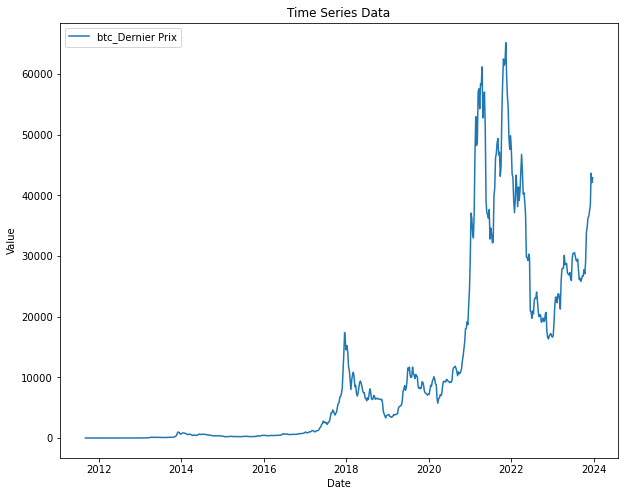

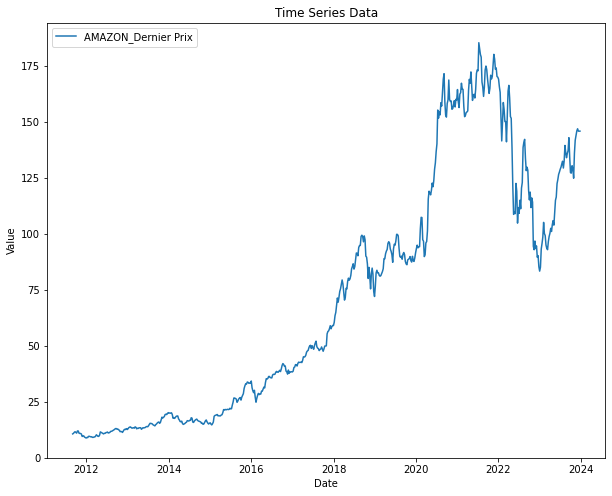

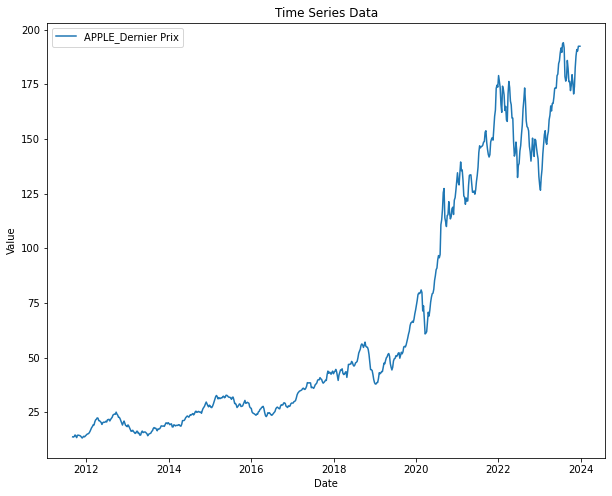

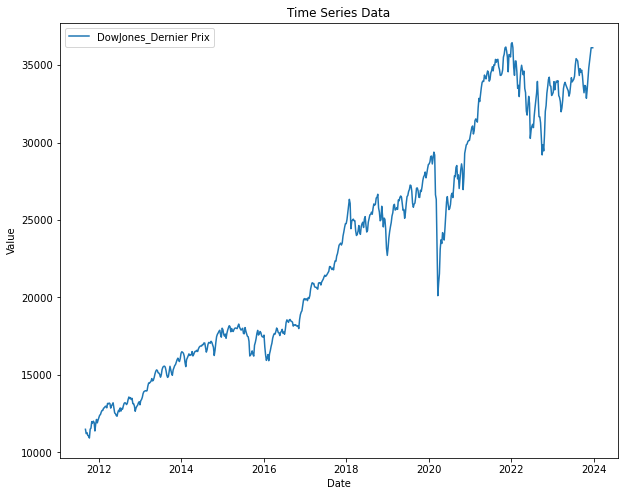

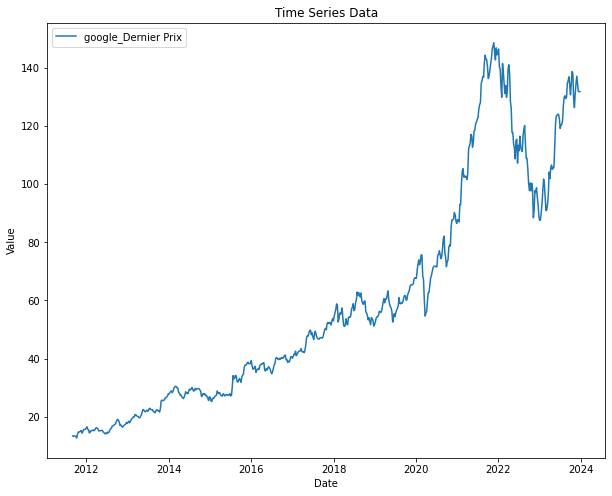

...

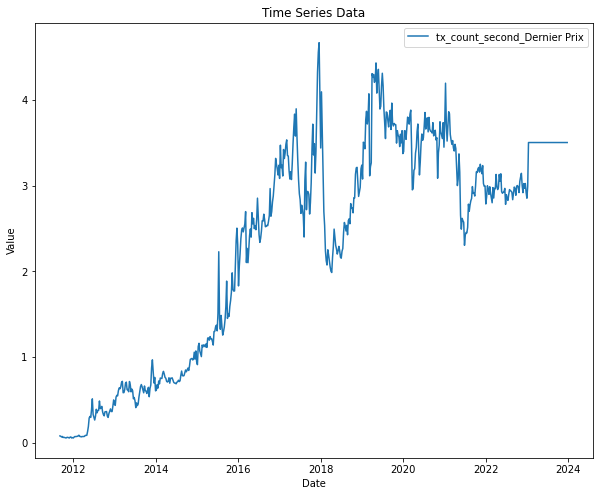

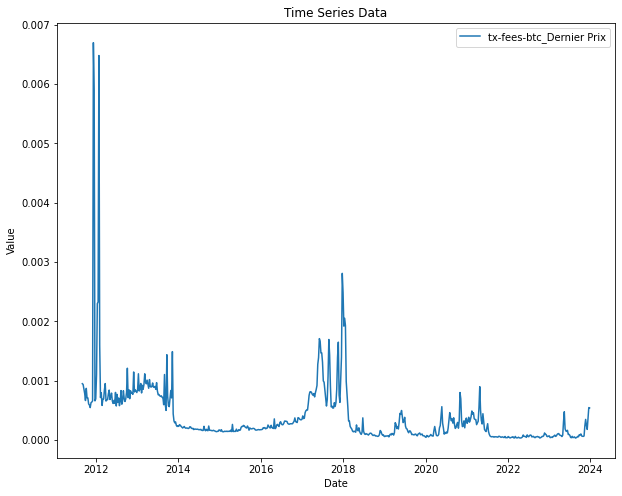

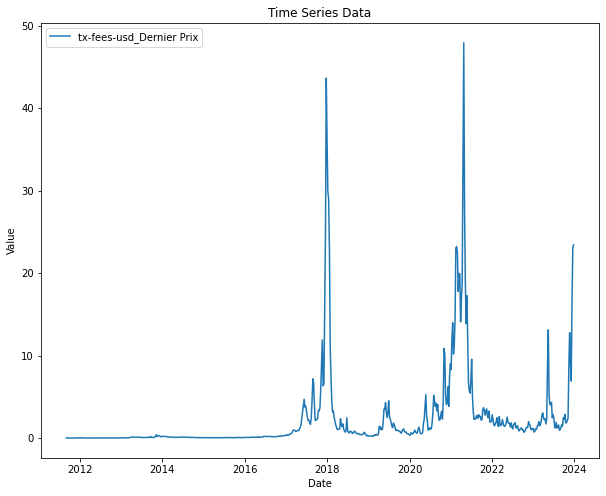

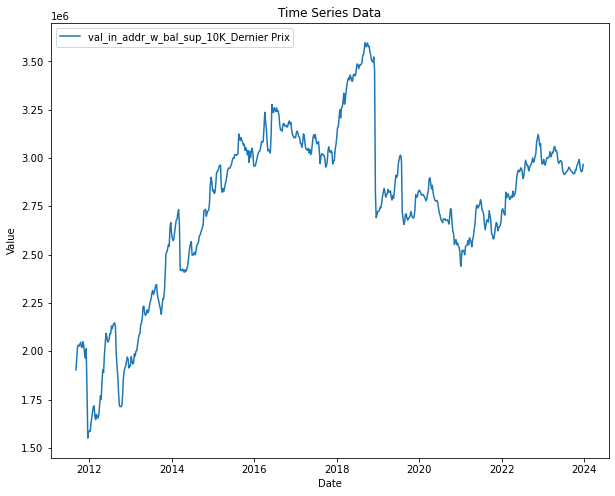

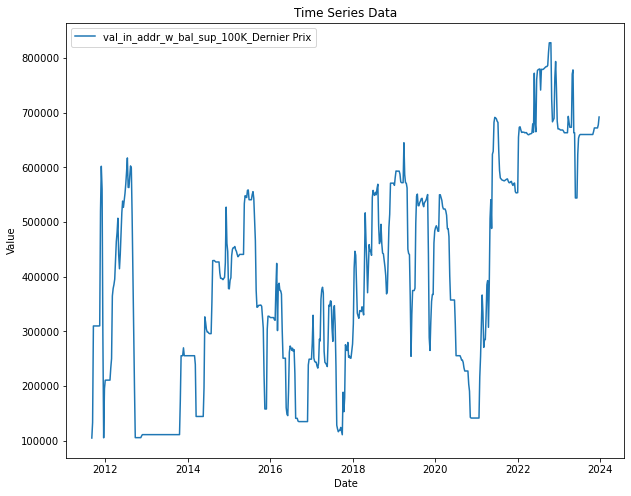

In [8]:
def plot_dataset(df):
    """
    Plot each column of a DataFrame on the same graph.

    Parameters:
    - df: pandas DataFrame with time series data.

    Returns:
    - None (plots the data).
    """
    # Ensure the DataFrame has a DateTimeIndex
    if not isinstance(df.index, pd.DatetimeIndex):
        raise ValueError("DataFrame index must be a DateTimeIndex for time series data.")

    #scaler=MinMaxScaler()
    #df_scaled=pd.DataFrame(scaler.fit_transform(df), columns=df.columns)
    

    for col in df.columns:
        plt.figure(figsize=(10,8))

        plt.plot(df.index, df[col], label=col)
        
        #plt.axvline(x=df.index[492], color='r', label='Halving 1')
        #plt.axvline(x=df.index[1432], color='purple', label='Halving 2')
        #plt.axvline(x=df.index[2411], color='green', label='Halving 3')

        # Set labels and title
        plt.xlabel('Date')
        plt.ylabel('Value')
        plt.title('Time Series Data')

        # Add legend
        plt.legend()

        # Show the plot
        plt.show()  
        
plot_dataset(dataset_prices)
        
    # Dataset choice:
    
# dataset_prices
# dataset_returns
# dataset_volatility
# dataset_z_score
# dataset_prices_returns_volatility
# dataset_returns_zscores

# Correlation matrix between our features

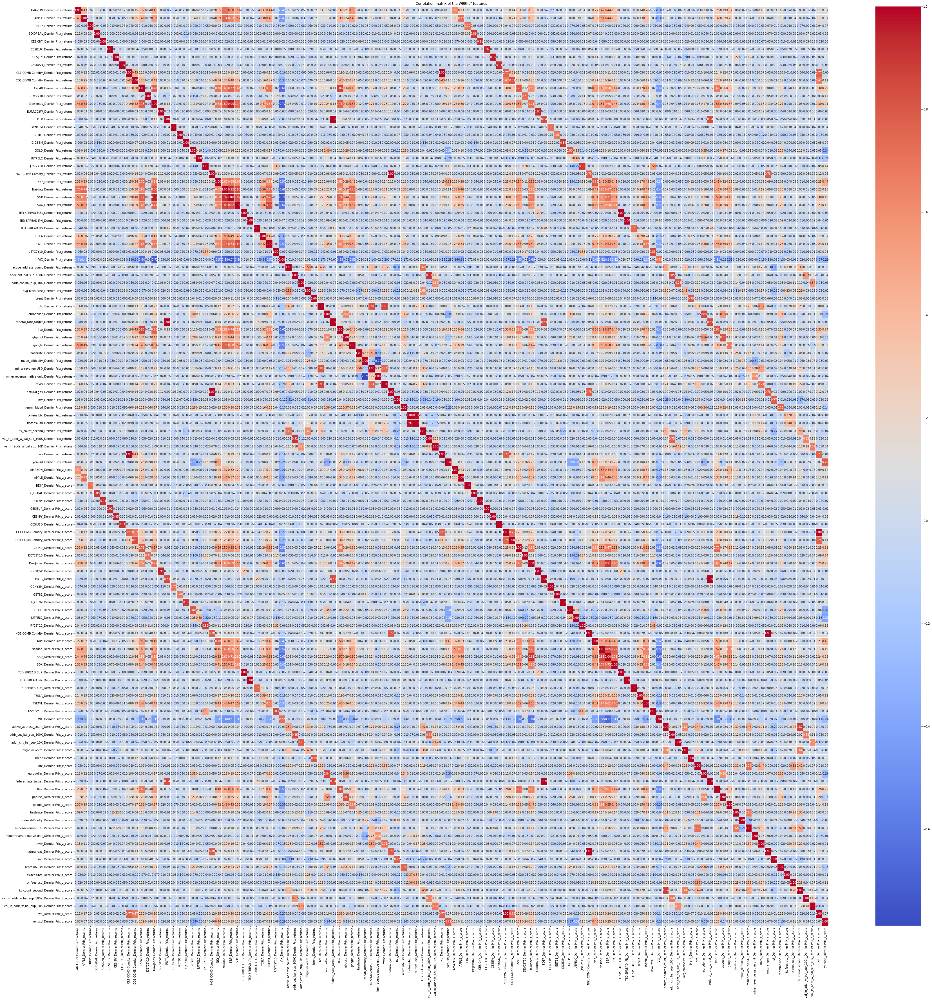

In [9]:
        # Dataset choice:
    
# dataset_prices
# dataset_returns
# dataset_volatility
# dataset_z_score
# dataset_prices_returns_volatility
# dataset_returns_zscores

correlation_matrix = dataset_returns_zscores.corr()

# Heatmap of the correlation matrix
plt.figure(figsize=(60, 60))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=.5)
plt.title('Correlation matrix of the WEEKLY features')
plt.show()

# Features and Label selection

In [10]:

# As we are working with stationary datas only, I will use the dataset : dataset_returns_zscores
# Which contains both returns and normalized returns                                

# Droping the two labels containing the BTC returns
features1 = dataset_returns_zscores.drop("btc_Dernier Prix_z_score", axis=1)
features = features1.drop("btc_Dernier Prix_returns", axis=1)

# Keeking the bitcoin returns, feature that we want to predict
labels = dataset_returns_zscores["btc_Dernier Prix_returns"]


# If never you prefer to perform the Random Forest predictions on the Bitcoin price, uncomment the following section:
"""
features1=dataset_prices_returns_volatility.drop("btc_Dernier Prix", axis=1)
features2 = features1.drop("btc_Dernier Prix_returns", axis=1)
features=features2.drop("btc_Dernier Prix_volatility", axis=1)

labels=dataset_prices_returns_volatility["btc_Dernier Prix"]
"""

'\nfeatures1=dataset_prices_returns_volatility.drop("btc_Dernier Prix", axis=1)\nfeatures2 = features1.drop("btc_Dernier Prix_returns", axis=1)\nfeatures=features2.drop("btc_Dernier Prix_volatility", axis=1)\n\nlabels=dataset_prices_returns_volatility["btc_Dernier Prix"]\n'

# Random Forest

                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.4018
1  miner-revenue-USD_Dernier Prix_returns      0.3554
2               mvrv_Dernier Prix_z_score      0.0449
3            CESICNY_Dernier Prix_z_score      0.0172
4             GJGB3M_Dernier Prix_returns      0.0103
5     avg-block-size_Dernier Prix_returns      0.0078
6             GCNY3M_Dernier Prix_z_score      0.0072
7    mean_difficulty_Dernier Prix_returns      0.0063
8              GETB1_Dernier Prix_returns      0.0062
9             yenusd_Dernier Prix_returns      0.0053





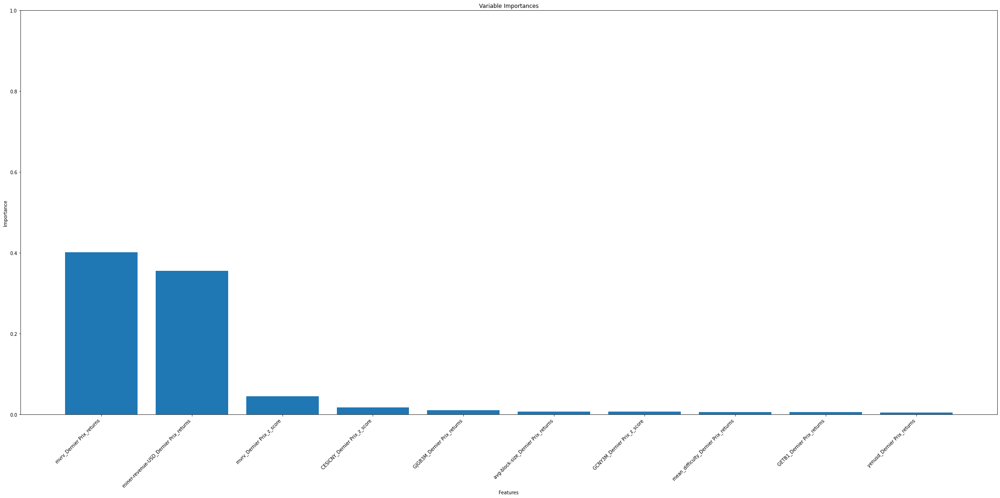

                                  Feature       p_value lag
0               mvrv_Dernier Prix_returns  1.641743e-07   2
1  miner-revenue-USD_Dernier Prix_returns  2.398396e-03   1
2               mvrv_Dernier Prix_z_score  1.246040e-01   1
3            CESICNY_Dernier Prix_z_score  3.392333e-01   2
4             GJGB3M_Dernier Prix_returns  5.785150e-01   1
5     avg-block-size_Dernier Prix_returns  8.783544e-01   1
6             GCNY3M_Dernier Prix_z_score  5.200395e-01   4
7    mean_difficulty_Dernier Prix_returns  5.176589e-02   3
8              GETB1_Dernier Prix_returns  7.291707e-01   1
9             yenusd_Dernier Prix_returns  1.735871e-01   5
                                     Feature  Importance
0     miner-revenue-USD_Dernier Prix_returns      0.3697
1                  mvrv_Dernier Prix_returns      0.3398
2                  mvrv_Dernier Prix_z_score      0.0934
3                GJGB3M_Dernier Prix_returns      0.0143
4               CESICNY_Dernier Prix_z_score      0.012

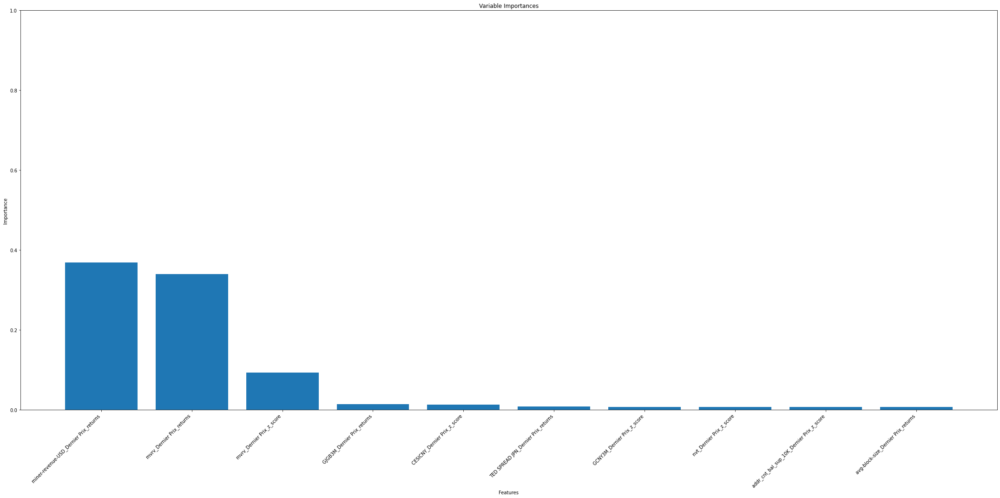

                                     Feature       p_value lag
0     miner-revenue-USD_Dernier Prix_returns  2.103113e-03   1
1                  mvrv_Dernier Prix_returns  6.139693e-08   5
2                  mvrv_Dernier Prix_z_score  9.839497e-02   1
3                GJGB3M_Dernier Prix_returns  6.841448e-01   1
4               CESICNY_Dernier Prix_z_score  2.111679e-01   2
5        TED SPREAD JPN_Dernier Prix_returns  4.311608e-01   1
6                GCNY3M_Dernier Prix_z_score  6.670314e-01   1
7                   nvt_Dernier Prix_z_score  2.074219e-01   3
8  addr_cnt_bal_sup_10K_Dernier Prix_z_score  1.115150e-02   3
9        avg-block-size_Dernier Prix_returns  7.863830e-01   1
                                  Feature  Importance
0  miner-revenue-USD_Dernier Prix_returns      0.3479
1               mvrv_Dernier Prix_returns      0.3460
2               mvrv_Dernier Prix_z_score      0.1095
3             GCNY3M_Dernier Prix_z_score      0.0188
4     TED SPREAD JPN_Dernier Prix_z_s

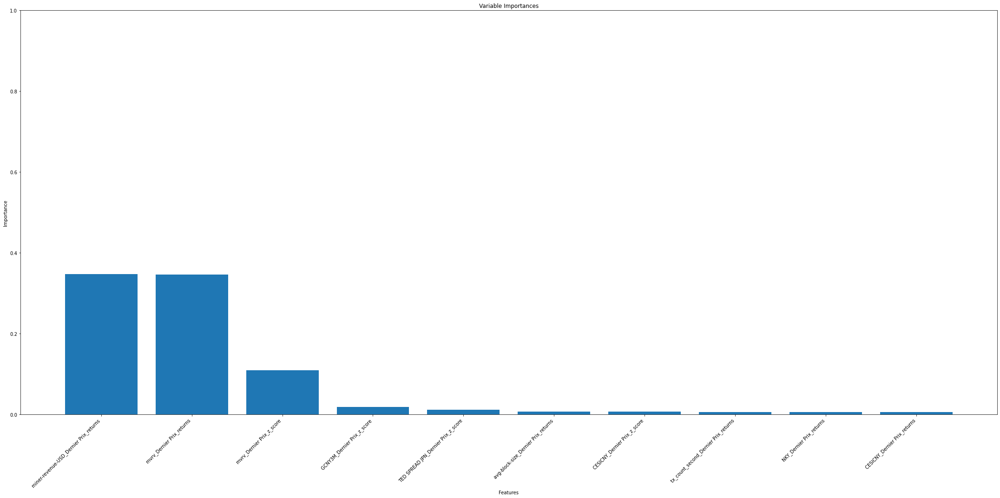

                                  Feature       p_value lag
0  miner-revenue-USD_Dernier Prix_returns  6.999411e-04   1
1               mvrv_Dernier Prix_returns  4.674248e-08   4
2               mvrv_Dernier Prix_z_score  1.749510e-01   1
3             GCNY3M_Dernier Prix_z_score  7.794571e-01   5
4     TED SPREAD JPN_Dernier Prix_z_score  5.026715e-01   1
5     avg-block-size_Dernier Prix_returns  8.441048e-01   1
6            CESICNY_Dernier Prix_z_score  3.238481e-01   2
7    tx_count_second_Dernier Prix_returns  8.593268e-01   3
8                NKY_Dernier Prix_returns  4.008465e-01   3
9            CESICNY_Dernier Prix_returns  5.793442e-01   2
                                  Feature  Importance
0  miner-revenue-USD_Dernier Prix_returns      0.4247
1               mvrv_Dernier Prix_returns      0.2925
2               mvrv_Dernier Prix_z_score      0.0908
3            CESICNY_Dernier Prix_z_score      0.0159
4             GCNY3M_Dernier Prix_z_score      0.0099
5             ye

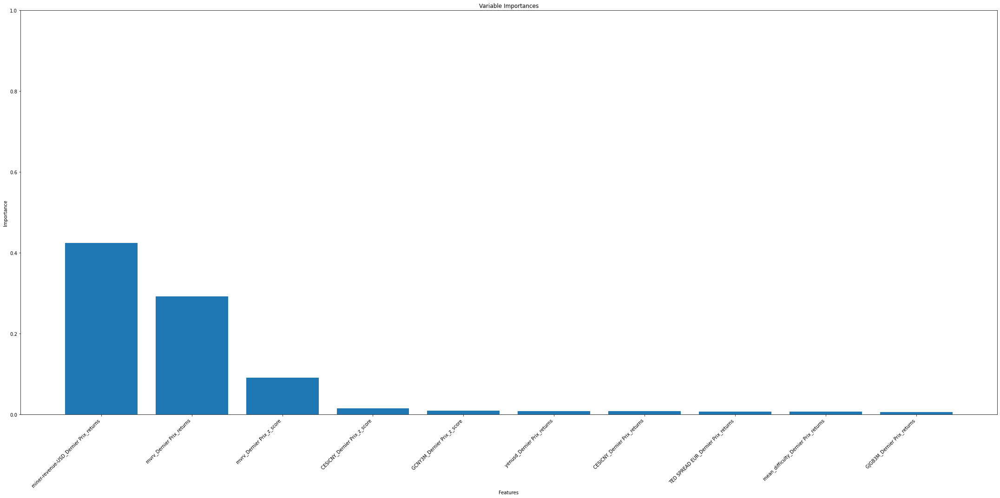

                                  Feature       p_value lag
0  miner-revenue-USD_Dernier Prix_returns  1.471117e-03   1
1               mvrv_Dernier Prix_returns  1.993071e-09   2
2               mvrv_Dernier Prix_z_score  1.099225e-01   1
3            CESICNY_Dernier Prix_z_score  3.162870e-01   2
4             GCNY3M_Dernier Prix_z_score  6.340315e-01   5
5             yenusd_Dernier Prix_returns  1.480216e-02   5
6            CESICNY_Dernier Prix_returns  5.712414e-01   1
7     TED SPREAD EUR_Dernier Prix_returns  1.000000e+00   1
8    mean_difficulty_Dernier Prix_returns  1.696786e-01   3
9             GJGB3M_Dernier Prix_returns  7.602166e-01   2
                                     Feature  Importance
0     miner-revenue-USD_Dernier Prix_returns      0.4125
1                  mvrv_Dernier Prix_returns      0.3073
2                  mvrv_Dernier Prix_z_score      0.1016
3                GCNY3M_Dernier Prix_z_score      0.0131
4                   nvt_Dernier Prix_z_score      0.011

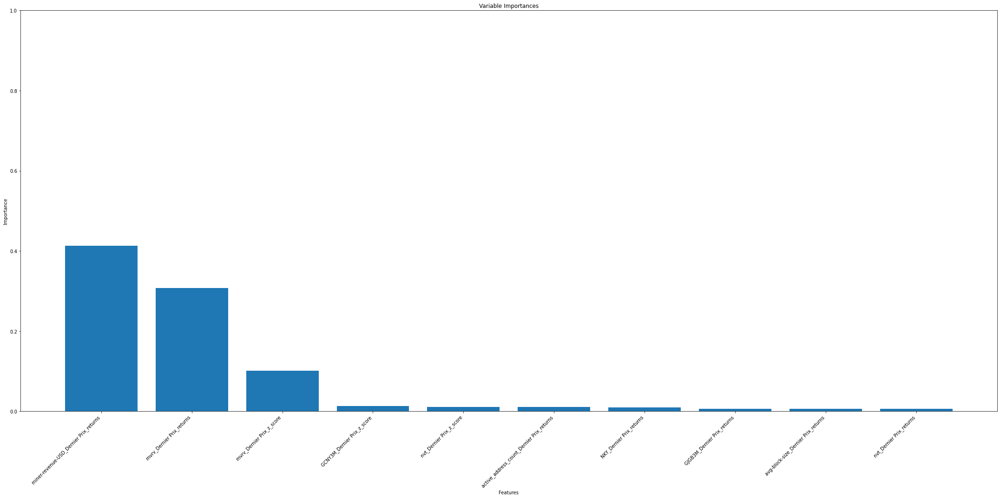

                                     Feature       p_value lag
0     miner-revenue-USD_Dernier Prix_returns  5.304441e-03   1
1                  mvrv_Dernier Prix_returns  1.298692e-09   2
2                  mvrv_Dernier Prix_z_score  1.457904e-01   1
3                GCNY3M_Dernier Prix_z_score  6.983716e-01   2
4                   nvt_Dernier Prix_z_score  5.965837e-02   4
5  active_address_count_Dernier Prix_returns  2.796523e-02   2
6                   NKY_Dernier Prix_returns  2.362394e-01   3
7                GJGB3M_Dernier Prix_returns  7.617241e-01   2
8        avg-block-size_Dernier Prix_returns  7.644630e-01   1
9                   nvt_Dernier Prix_returns  1.211380e-01   4
                                  Feature  Importance
0  miner-revenue-USD_Dernier Prix_returns      0.3813
1               mvrv_Dernier Prix_returns      0.3301
2               mvrv_Dernier Prix_z_score      0.1080
3    mean_difficulty_Dernier Prix_returns      0.0076
4            CESIEUR_Dernier Prix_ret

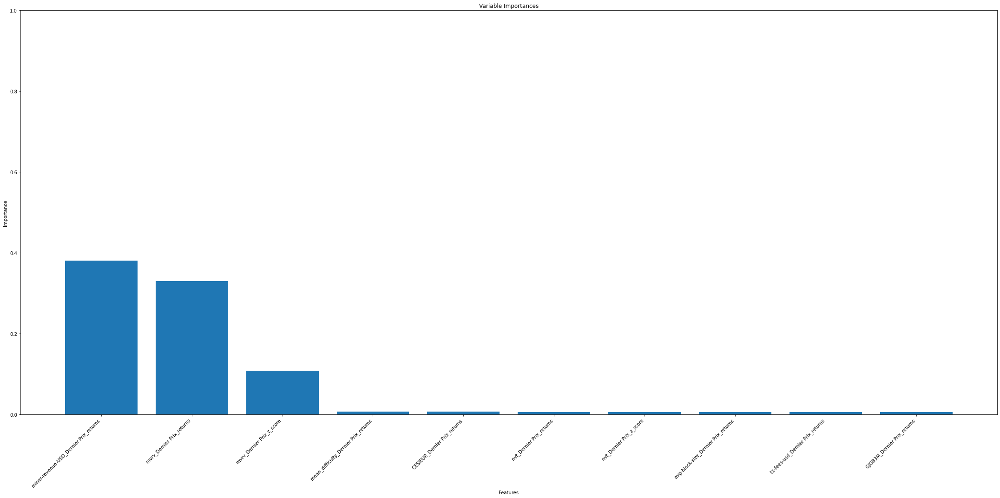

                                  Feature       p_value lag
0  miner-revenue-USD_Dernier Prix_returns  2.919494e-03   1
1               mvrv_Dernier Prix_returns  7.753878e-09   2
2               mvrv_Dernier Prix_z_score  1.137890e-01   1
3    mean_difficulty_Dernier Prix_returns  1.169706e-01   3
4            CESIEUR_Dernier Prix_returns  2.996022e-01   3
5                nvt_Dernier Prix_returns  1.152981e-01   2
6                nvt_Dernier Prix_z_score  1.059705e-01   4
7     avg-block-size_Dernier Prix_returns  7.800402e-01   1
8        tx-fees-usd_Dernier Prix_returns  1.878249e-04   2
9             GJGB3M_Dernier Prix_returns  7.722342e-01   2
                                     Feature  Importance
0     miner-revenue-USD_Dernier Prix_returns      0.3718
1                  mvrv_Dernier Prix_returns      0.3284
2                  mvrv_Dernier Prix_z_score      0.0963
3               CESIEUR_Dernier Prix_returns      0.0155
4                GCNY3M_Dernier Prix_z_score      0.011

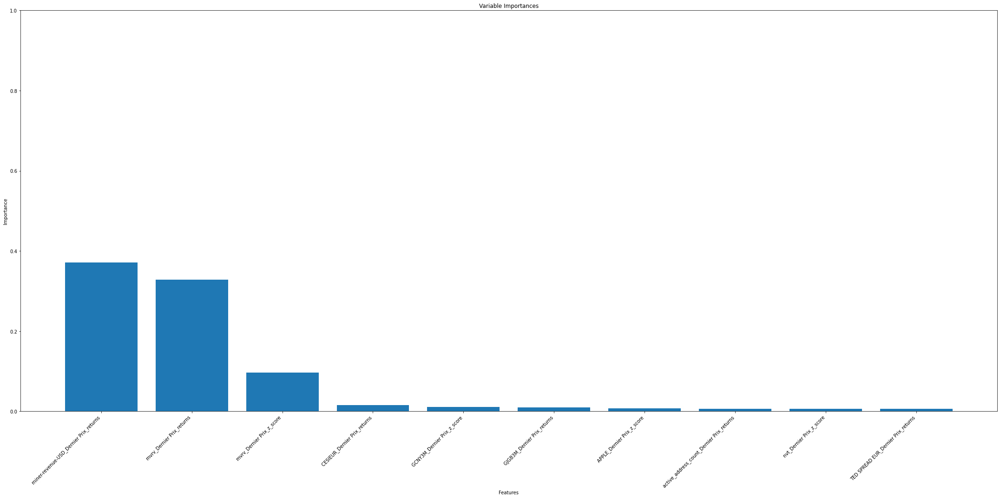

                                     Feature       p_value lag
0     miner-revenue-USD_Dernier Prix_returns  2.934339e-03   1
1                  mvrv_Dernier Prix_returns  2.082753e-09   2
2                  mvrv_Dernier Prix_z_score  8.995283e-02   1
3               CESIEUR_Dernier Prix_returns  3.136218e-01   3
4                GCNY3M_Dernier Prix_z_score  5.382124e-01   5
5                GJGB3M_Dernier Prix_returns  6.263169e-01   1
6                 APPLE_Dernier Prix_z_score  5.442013e-01   1
7  active_address_count_Dernier Prix_returns  2.723926e-02   3
8                   nvt_Dernier Prix_z_score  5.062352e-02   4
9        TED SPREAD EUR_Dernier Prix_returns  1.000000e+00   1
                                     Feature  Importance
0     miner-revenue-USD_Dernier Prix_returns      0.3908
1                  mvrv_Dernier Prix_returns      0.3468
2                  mvrv_Dernier Prix_z_score      0.0704
3                GCNY3M_Dernier Prix_z_score      0.0184
4               CESIEU

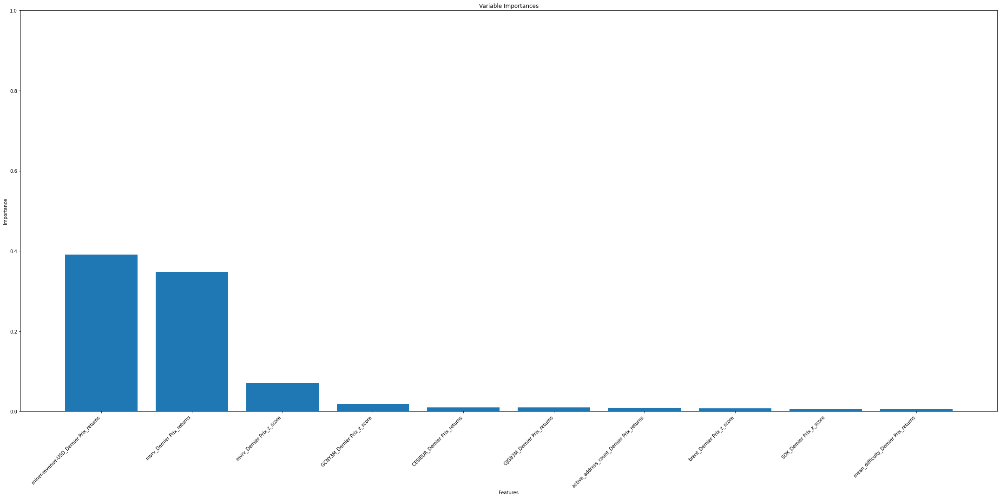

                                     Feature       p_value lag
0     miner-revenue-USD_Dernier Prix_returns  2.808468e-03   1
1                  mvrv_Dernier Prix_returns  2.022742e-09   2
2                  mvrv_Dernier Prix_z_score  1.060527e-01   1
3                GCNY3M_Dernier Prix_z_score  4.243587e-01   1
4               CESIEUR_Dernier Prix_returns  3.019758e-01   3
5                GJGB3M_Dernier Prix_returns  6.472913e-01   1
6  active_address_count_Dernier Prix_returns  2.431969e-02   3
7                 brent_Dernier Prix_z_score  1.900501e-01   1
8                   SOX_Dernier Prix_z_score  3.160226e-01   1
9       mean_difficulty_Dernier Prix_returns  8.365136e-02   3
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.4044
1     miner-revenue-USD_Dernier Prix_returns      0.3000
2                  mvrv_Dernier Prix_z_score      0.0925
3                GCNY3M_Dernier Prix_z_score      0.0135
4                GJGB3

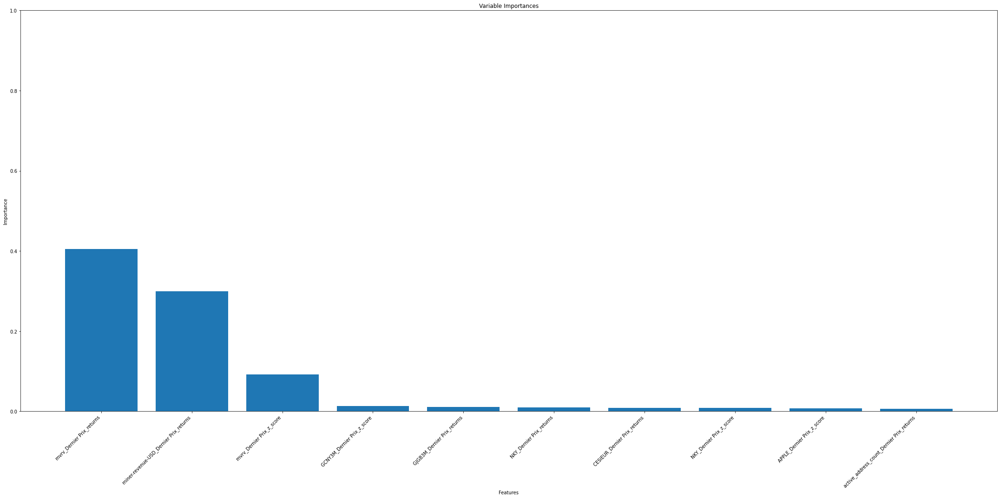

                                     Feature       p_value lag
0                  mvrv_Dernier Prix_returns  2.257748e-09   2
1     miner-revenue-USD_Dernier Prix_returns  2.155284e-03   1
2                  mvrv_Dernier Prix_z_score  9.046575e-02   1
3                GCNY3M_Dernier Prix_z_score  4.648345e-01   1
4                GJGB3M_Dernier Prix_returns  7.143071e-01   1
5                   NKY_Dernier Prix_returns  1.816387e-01   1
6               CESIEUR_Dernier Prix_returns  2.940542e-01   3
7                   NKY_Dernier Prix_z_score  1.936616e-01   1
8                 APPLE_Dernier Prix_z_score  4.553663e-01   1
9  active_address_count_Dernier Prix_returns  3.530797e-02   3
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.3697
1     miner-revenue-USD_Dernier Prix_returns      0.3619
2                  mvrv_Dernier Prix_z_score      0.0851
3                GCNY3M_Dernier Prix_z_score      0.0166
4                GJGB3

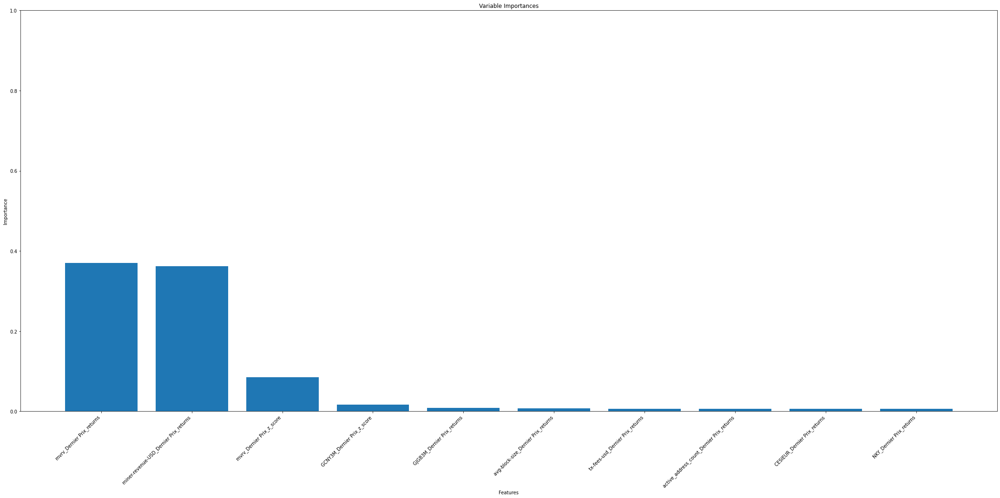

                                     Feature       p_value lag
0                  mvrv_Dernier Prix_returns  2.510277e-09   2
1     miner-revenue-USD_Dernier Prix_returns  3.014334e-03   1
2                  mvrv_Dernier Prix_z_score  6.974203e-02   1
3                GCNY3M_Dernier Prix_z_score  5.112808e-01   1
4                GJGB3M_Dernier Prix_returns  7.090449e-01   1
5        avg-block-size_Dernier Prix_returns  4.480109e-01   3
6           tx-fees-usd_Dernier Prix_returns  4.802151e-04   2
7  active_address_count_Dernier Prix_returns  1.189563e-02   3
8               CESIEUR_Dernier Prix_returns  3.037065e-01   3
9                   NKY_Dernier Prix_returns  1.470363e-01   3
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.3561
1     miner-revenue-USD_Dernier Prix_returns      0.3449
2                  mvrv_Dernier Prix_z_score      0.0901
3                GCNY3M_Dernier Prix_z_score      0.0179
4  active_address_coun

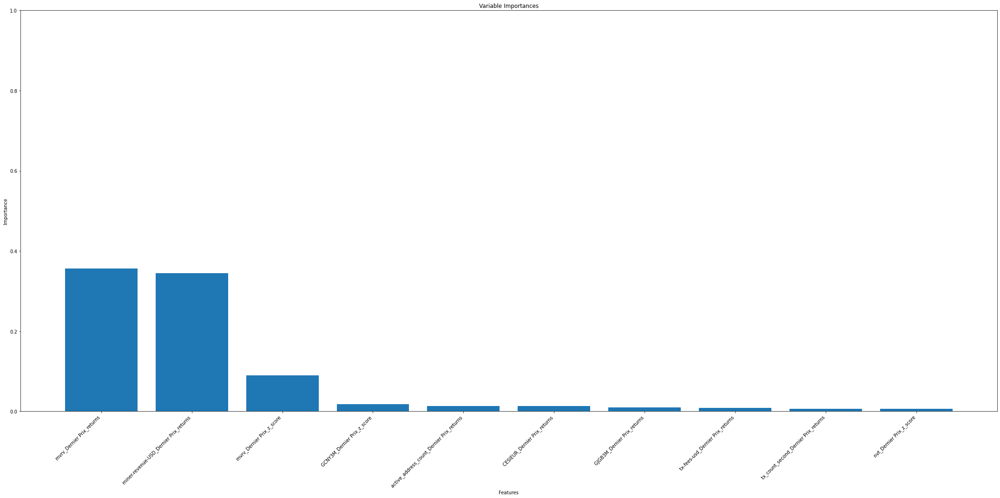

                                     Feature       p_value lag
0                  mvrv_Dernier Prix_returns  3.114458e-09   2
1     miner-revenue-USD_Dernier Prix_returns  2.153435e-03   1
2                  mvrv_Dernier Prix_z_score  8.251721e-02   1
3                GCNY3M_Dernier Prix_z_score  5.264073e-01   1
4  active_address_count_Dernier Prix_returns  5.829142e-03   4
5               CESIEUR_Dernier Prix_returns  3.004413e-01   3
6                GJGB3M_Dernier Prix_returns  7.260100e-01   1
7           tx-fees-usd_Dernier Prix_returns  3.678348e-04   2
8       tx_count_second_Dernier Prix_returns  2.553238e-01   3
9                   nvt_Dernier Prix_z_score  6.737306e-02   4
                                     Feature  Importance
0     miner-revenue-USD_Dernier Prix_returns      0.4125
1                  mvrv_Dernier Prix_returns      0.2931
2                  mvrv_Dernier Prix_z_score      0.0982
3                GCNY3M_Dernier Prix_z_score      0.0118
4  active_address_coun

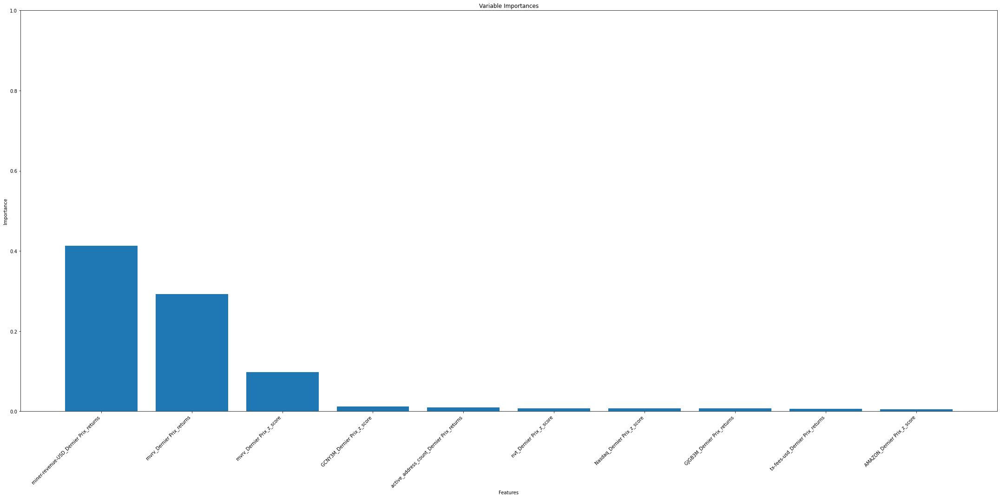

                                     Feature       p_value lag
0     miner-revenue-USD_Dernier Prix_returns  1.768434e-03   1
1                  mvrv_Dernier Prix_returns  2.633231e-09   2
2                  mvrv_Dernier Prix_z_score  7.247318e-02   1
3                GCNY3M_Dernier Prix_z_score  4.360508e-01   1
4  active_address_count_Dernier Prix_returns  5.452644e-03   4
5                   nvt_Dernier Prix_z_score  4.627760e-02   4
6                Nasdaq_Dernier Prix_z_score  1.594702e-01   1
7                GJGB3M_Dernier Prix_returns  7.228601e-01   1
8           tx-fees-usd_Dernier Prix_returns  4.233343e-04   2
9                AMAZON_Dernier Prix_z_score  5.076268e-01   1
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.3944
1     miner-revenue-USD_Dernier Prix_returns      0.3048
2                  mvrv_Dernier Prix_z_score      0.1003
3               CESIEUR_Dernier Prix_returns      0.0138
4                Nasda

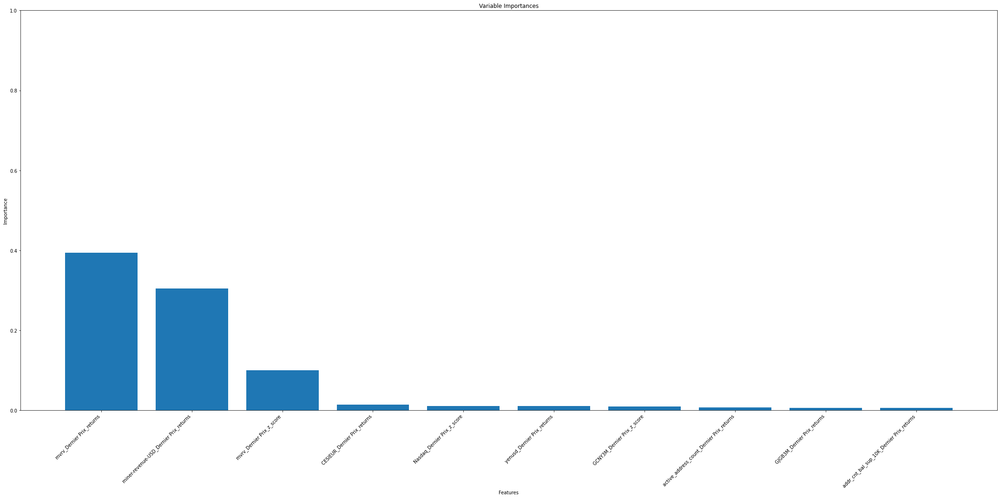

                                     Feature       p_value lag
0                  mvrv_Dernier Prix_returns  3.122966e-09   2
1     miner-revenue-USD_Dernier Prix_returns  1.340268e-03   1
2                  mvrv_Dernier Prix_z_score  1.187097e-01   1
3               CESIEUR_Dernier Prix_returns  2.903459e-01   3
4                Nasdaq_Dernier Prix_z_score  1.463470e-01   1
5                yenusd_Dernier Prix_returns  1.549841e-01   1
6                GCNY3M_Dernier Prix_z_score  5.310360e-01   1
7  active_address_count_Dernier Prix_returns  6.496627e-03   3
8                GJGB3M_Dernier Prix_returns  7.222220e-01   1
9  addr_cnt_bal_sup_10K_Dernier Prix_returns  2.904624e-01   3
                                     Feature  Importance
0     miner-revenue-USD_Dernier Prix_returns      0.4117
1                  mvrv_Dernier Prix_returns      0.2828
2                  mvrv_Dernier Prix_z_score      0.0904
3  active_address_count_Dernier Prix_returns      0.0090
4           tx-fees-us

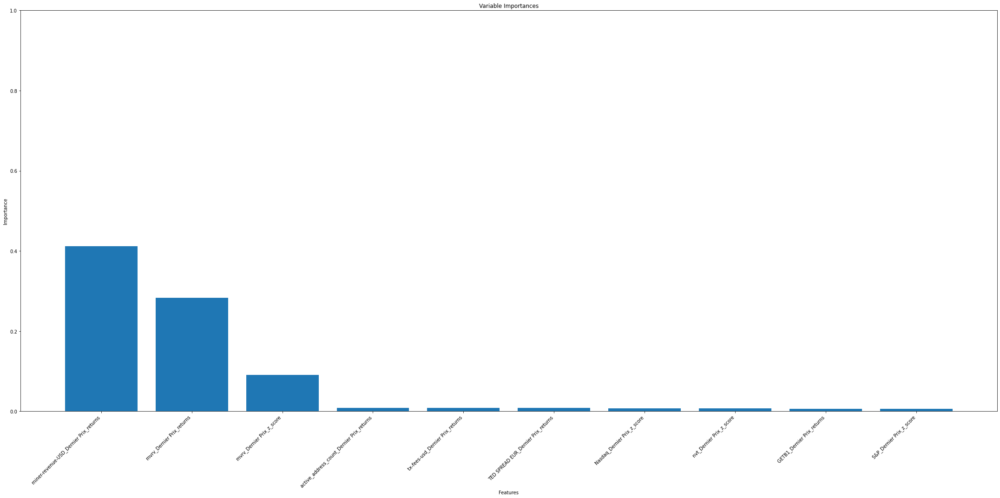

                                     Feature       p_value lag
0     miner-revenue-USD_Dernier Prix_returns  1.607779e-03   1
1                  mvrv_Dernier Prix_returns  5.874385e-09   2
2                  mvrv_Dernier Prix_z_score  1.018323e-01   1
3  active_address_count_Dernier Prix_returns  2.781589e-03   3
4           tx-fees-usd_Dernier Prix_returns  2.290994e-04   2
5        TED SPREAD EUR_Dernier Prix_returns  1.000000e+00   1
6                Nasdaq_Dernier Prix_z_score  2.565802e-01   1
7                   nvt_Dernier Prix_z_score  4.615845e-02   4
8                 GETB1_Dernier Prix_returns  7.276398e-01   1
9                   S&P_Dernier Prix_z_score  4.977980e-01   1
                                     Feature  Importance
0     miner-revenue-USD_Dernier Prix_returns      0.3956
1                  mvrv_Dernier Prix_returns      0.3317
2                  mvrv_Dernier Prix_z_score      0.0692
3        avg-block-size_Dernier Prix_z_score      0.0112
4               CESICN

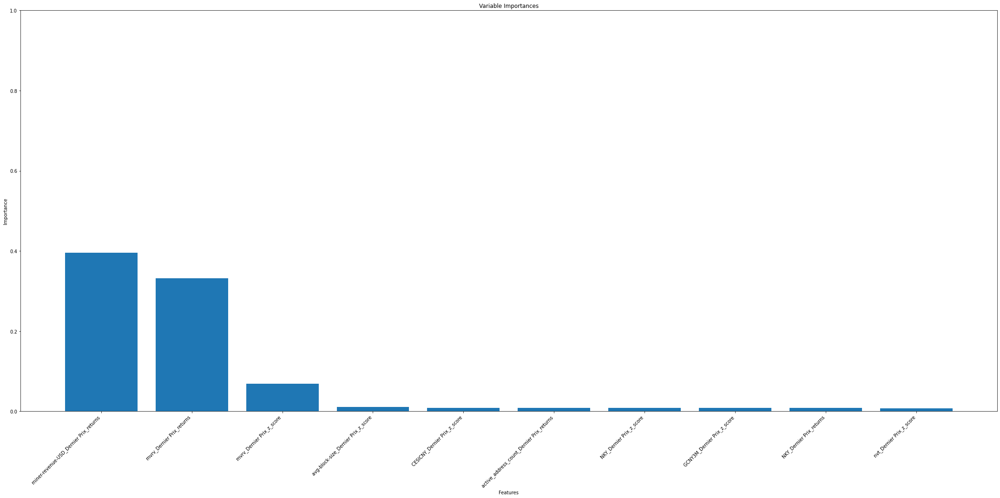

                                     Feature       p_value lag
0     miner-revenue-USD_Dernier Prix_returns  6.268160e-03   1
1                  mvrv_Dernier Prix_returns  4.250826e-09   2
2                  mvrv_Dernier Prix_z_score  9.866979e-02   1
3        avg-block-size_Dernier Prix_z_score  7.293878e-01   4
4               CESICNY_Dernier Prix_z_score  4.215759e-01   2
5  active_address_count_Dernier Prix_returns  5.001287e-03   3
6                   NKY_Dernier Prix_z_score  1.285918e-01   4
7                GCNY3M_Dernier Prix_z_score  5.245592e-01   1
8                   NKY_Dernier Prix_returns  1.363572e-01   3
9                   nvt_Dernier Prix_z_score  2.614150e-02   4
                                     Feature  Importance
0     miner-revenue-USD_Dernier Prix_returns      0.3985
1                  mvrv_Dernier Prix_returns      0.3424
2                  mvrv_Dernier Prix_z_score      0.0635
3  active_address_count_Dernier Prix_returns      0.0106
4                GJGB3

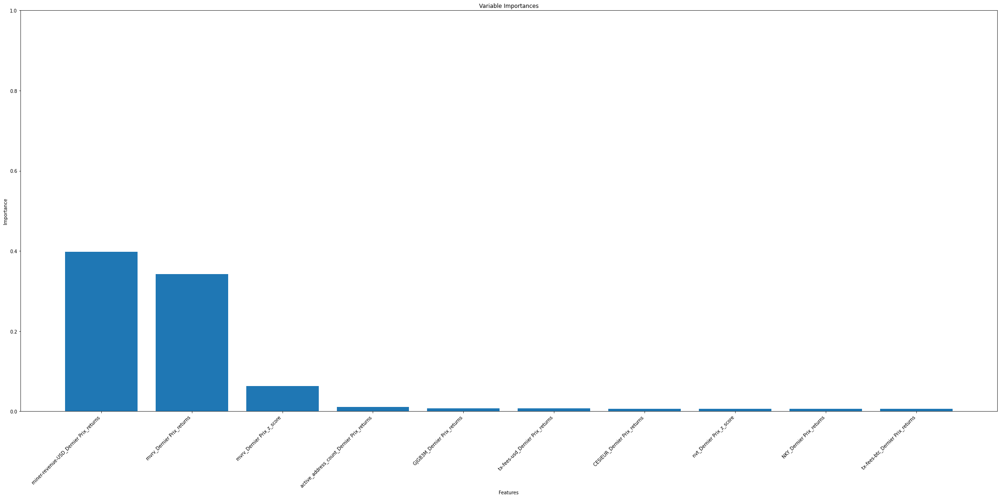

                                     Feature       p_value lag
0     miner-revenue-USD_Dernier Prix_returns  5.115549e-03   1
1                  mvrv_Dernier Prix_returns  1.679379e-08   2
2                  mvrv_Dernier Prix_z_score  1.170856e-01   1
3  active_address_count_Dernier Prix_returns  5.250042e-03   3
4                GJGB3M_Dernier Prix_returns  6.015227e-01   3
5           tx-fees-usd_Dernier Prix_returns  1.296350e-04   2
6               CESIEUR_Dernier Prix_returns  2.867434e-01   3
7                   nvt_Dernier Prix_z_score  1.664690e-02   4
8                   NKY_Dernier Prix_returns  2.076510e-01   3
9           tx-fees-btc_Dernier Prix_returns  2.838787e-01   1
                                     Feature  Importance
0     miner-revenue-USD_Dernier Prix_returns      0.3963
1                  mvrv_Dernier Prix_returns      0.3157
2                  mvrv_Dernier Prix_z_score      0.0834
3  active_address_count_Dernier Prix_returns      0.0230
4           tx-fees-us

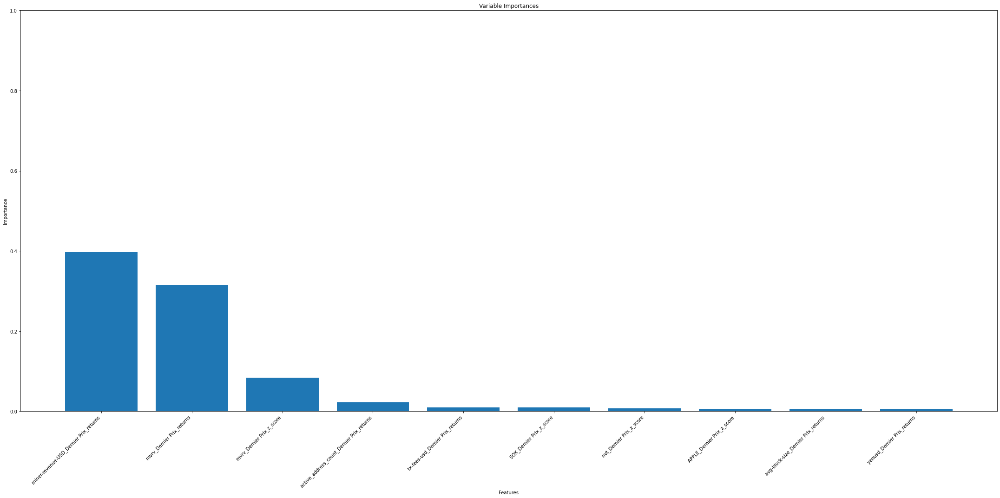

                                     Feature       p_value lag
0     miner-revenue-USD_Dernier Prix_returns  6.728898e-03   1
1                  mvrv_Dernier Prix_returns  5.171971e-09   2
2                  mvrv_Dernier Prix_z_score  1.116196e-01   1
3  active_address_count_Dernier Prix_returns  6.347796e-03   3
4           tx-fees-usd_Dernier Prix_returns  1.278196e-04   2
5                   SOX_Dernier Prix_z_score  3.682910e-01   3
6                   nvt_Dernier Prix_z_score  1.003669e-02   4
7                 APPLE_Dernier Prix_z_score  5.151060e-01   2
8        avg-block-size_Dernier Prix_returns  2.348705e-01   3
9                yenusd_Dernier Prix_returns  2.911087e-01   1
                                          Feature  Importance
0                       mvrv_Dernier Prix_returns      0.3626
1          miner-revenue-USD_Dernier Prix_returns      0.3622
2                       mvrv_Dernier Prix_z_score      0.0787
3       active_address_count_Dernier Prix_returns      0.01

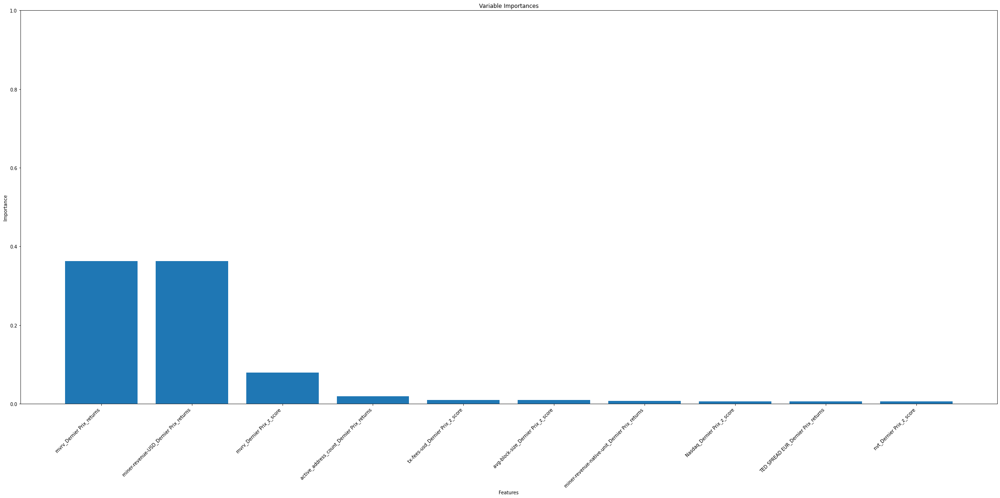

                                          Feature       p_value lag
0                       mvrv_Dernier Prix_returns  8.224522e-09   2
1          miner-revenue-USD_Dernier Prix_returns  1.286273e-03   1
2                       mvrv_Dernier Prix_z_score  9.533547e-02   1
3       active_address_count_Dernier Prix_returns  7.638654e-03   3
4                tx-fees-usd_Dernier Prix_z_score  4.983299e-01   2
5             avg-block-size_Dernier Prix_z_score  5.351257e-01   2
6  miner-revenue-native-unit_Dernier Prix_returns  3.361907e-01   4
7                     Nasdaq_Dernier Prix_z_score  3.078326e-01   1
8             TED SPREAD EUR_Dernier Prix_returns  1.000000e+00   1
9                        nvt_Dernier Prix_z_score  1.359790e-02   4
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.3698
1  miner-revenue-USD_Dernier Prix_returns      0.3493
2               mvrv_Dernier Prix_z_score      0.0727
3        tx-fees-usd_Dernier Prix_re

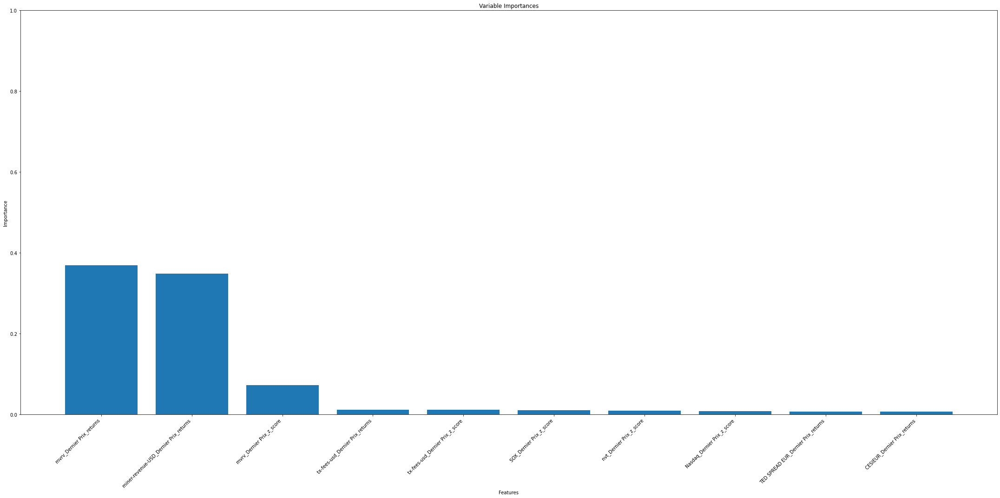

                                  Feature       p_value lag
0               mvrv_Dernier Prix_returns  7.931071e-09   2
1  miner-revenue-USD_Dernier Prix_returns  1.086106e-03   1
2               mvrv_Dernier Prix_z_score  1.030663e-01   1
3        tx-fees-usd_Dernier Prix_returns  1.376209e-04   2
4        tx-fees-usd_Dernier Prix_z_score  1.817018e-01   1
5                SOX_Dernier Prix_z_score  3.502878e-01   5
6                nvt_Dernier Prix_z_score  1.378613e-02   4
7             Nasdaq_Dernier Prix_z_score  2.928862e-01   5
8     TED SPREAD EUR_Dernier Prix_returns  1.000000e+00   1
9            CESIEUR_Dernier Prix_returns  2.787580e-01   3
                                     Feature  Importance
0     miner-revenue-USD_Dernier Prix_returns      0.4143
1                  mvrv_Dernier Prix_returns      0.3201
2                  mvrv_Dernier Prix_z_score      0.0711
3        avg-block-size_Dernier Prix_z_score      0.0100
4           tx-fees-usd_Dernier Prix_returns      0.009

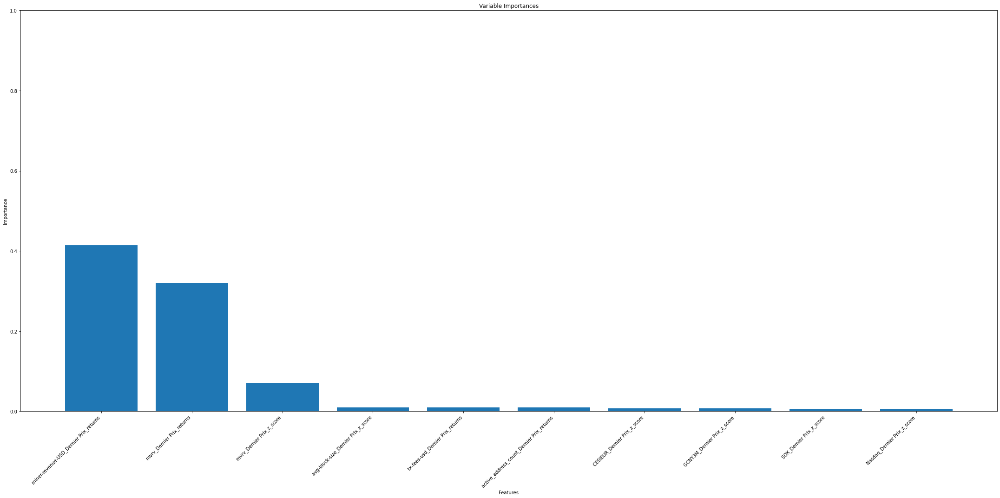

                                     Feature       p_value lag
0     miner-revenue-USD_Dernier Prix_returns  9.745611e-04   1
1                  mvrv_Dernier Prix_returns  8.777712e-09   2
2                  mvrv_Dernier Prix_z_score  9.385170e-02   1
3        avg-block-size_Dernier Prix_z_score  4.887449e-01   2
4           tx-fees-usd_Dernier Prix_returns  2.786871e-04   2
5  active_address_count_Dernier Prix_returns  7.652734e-03   3
6               CESIEUR_Dernier Prix_z_score  4.711378e-01   1
7                GCNY3M_Dernier Prix_z_score  4.763581e-01   1
8                   SOX_Dernier Prix_z_score  3.578469e-01   3
9                Nasdaq_Dernier Prix_z_score  2.720090e-01   3
                                     Feature  Importance
0     miner-revenue-USD_Dernier Prix_returns      0.4447
1                  mvrv_Dernier Prix_returns      0.3153
2                  mvrv_Dernier Prix_z_score      0.0601
3  active_address_count_Dernier Prix_returns      0.0193
4        TED SPREAD EU

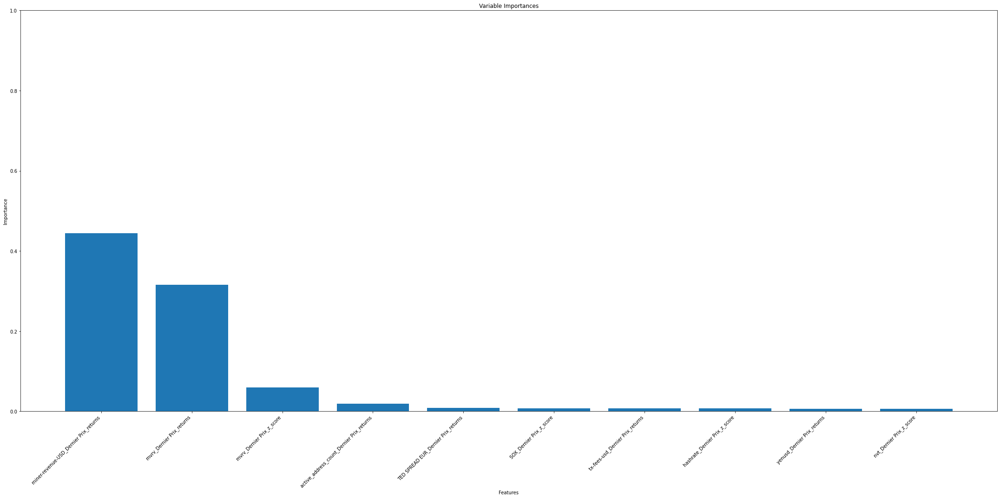

                                     Feature       p_value lag
0     miner-revenue-USD_Dernier Prix_returns  9.633329e-04   1
1                  mvrv_Dernier Prix_returns  9.679307e-10   4
2                  mvrv_Dernier Prix_z_score  8.086078e-02   1
3  active_address_count_Dernier Prix_returns  1.639996e-02   1
4        TED SPREAD EUR_Dernier Prix_returns  1.000000e+00   1
5                   SOX_Dernier Prix_z_score  6.010906e-01   3
6           tx-fees-usd_Dernier Prix_returns  4.942163e-04   2
7              hashrate_Dernier Prix_z_score  2.807849e-09   3
8                yenusd_Dernier Prix_returns  4.124801e-01   2
9                   nvt_Dernier Prix_z_score  6.402691e-03   5
                                     Feature  Importance
0     miner-revenue-USD_Dernier Prix_returns      0.4422
1                  mvrv_Dernier Prix_returns      0.3233
2                  mvrv_Dernier Prix_z_score      0.0639
3                 TESLA_Dernier Prix_returns      0.0139
4                yenus

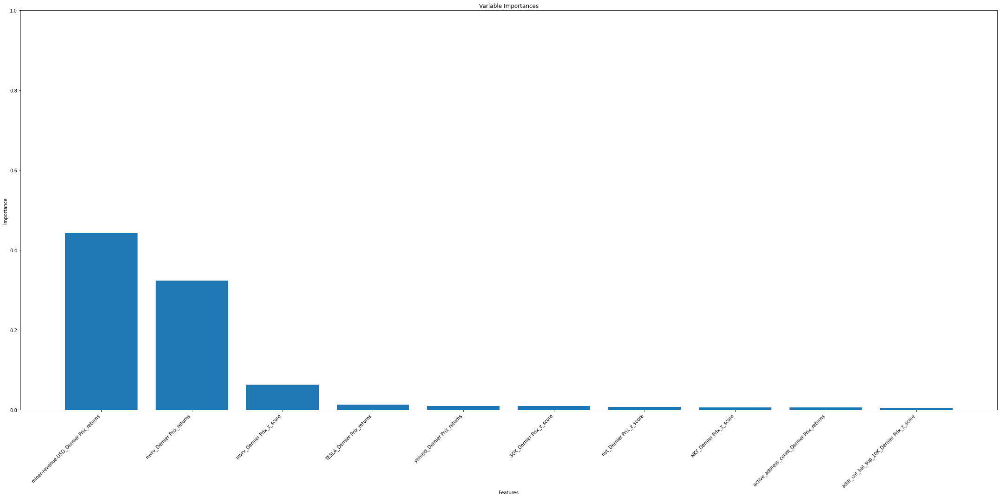

                                     Feature   p_value lag
0     miner-revenue-USD_Dernier Prix_returns  0.000053   2
1                  mvrv_Dernier Prix_returns  0.000001   2
2                  mvrv_Dernier Prix_z_score  0.071261   1
3                 TESLA_Dernier Prix_returns  0.053924   5
4                yenusd_Dernier Prix_returns  0.387396   2
5                   SOX_Dernier Prix_z_score  0.710851   3
6                   nvt_Dernier Prix_z_score  0.097523   4
7                   NKY_Dernier Prix_z_score  0.082068   5
8  active_address_count_Dernier Prix_returns  0.038704   3
9  addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.347937   5
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.4310
1     miner-revenue-USD_Dernier Prix_returns      0.3207
2                  mvrv_Dernier Prix_z_score      0.0706
3               CESIEUR_Dernier Prix_returns      0.0134
4        avg-block-size_Dernier Prix_returns      0.0125
5  active

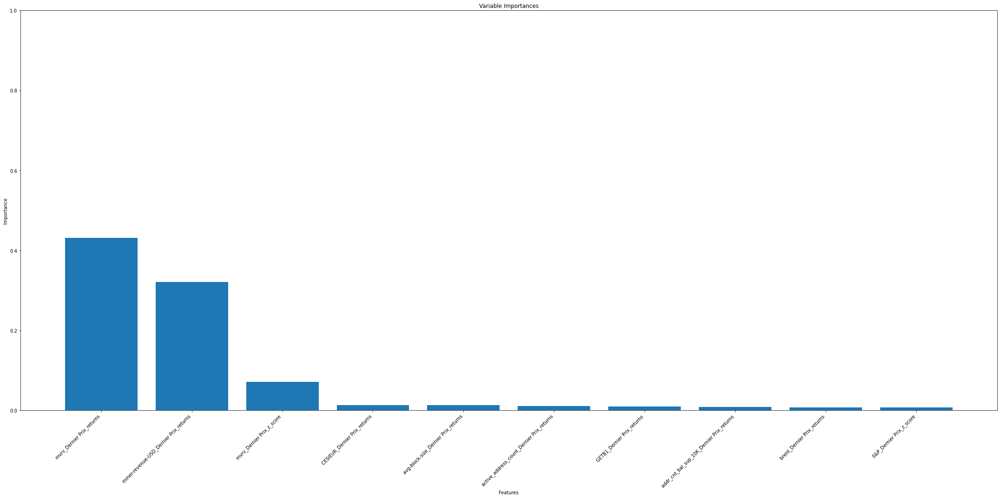

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.000050   5
1     miner-revenue-USD_Dernier Prix_returns  0.000008   1
2                  mvrv_Dernier Prix_z_score  0.073367   1
3               CESIEUR_Dernier Prix_returns  0.171841   3
4        avg-block-size_Dernier Prix_returns  0.140141   4
5  active_address_count_Dernier Prix_returns  0.026413   1
6                 GETB1_Dernier Prix_returns  0.520399   1
7  addr_cnt_bal_sup_10K_Dernier Prix_returns  0.414813   3
8                 brent_Dernier Prix_returns  0.000218   1
9                   S&P_Dernier Prix_z_score  0.313572   2
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.4612
1  miner-revenue-USD_Dernier Prix_returns      0.3338
2               mvrv_Dernier Prix_z_score      0.0381
3              GETB1_Dernier Prix_z_score      0.0147
4              APPLE_Dernier Prix_z_score      0.0125
5              GETB1_Dernie

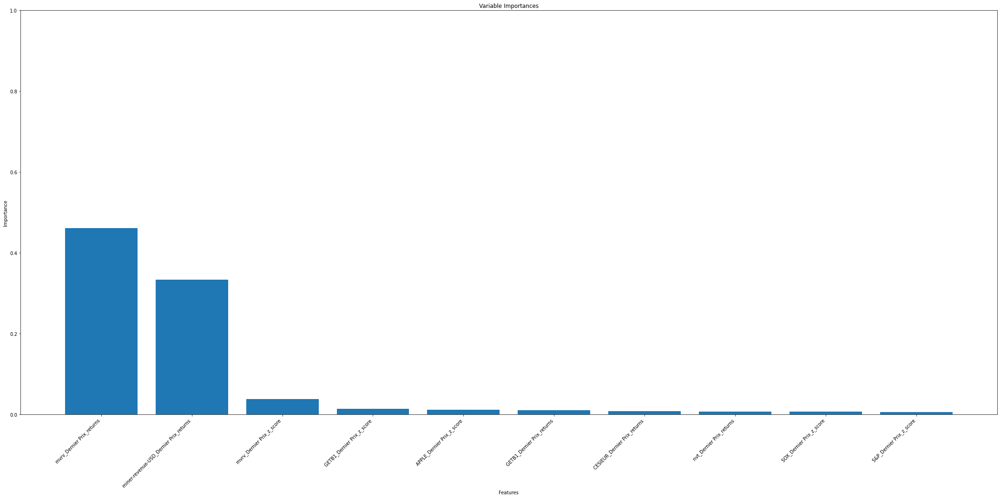

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.000238   5
1  miner-revenue-USD_Dernier Prix_returns  0.000027   1
2               mvrv_Dernier Prix_z_score  0.084637   1
3              GETB1_Dernier Prix_z_score  0.015268   2
4              APPLE_Dernier Prix_z_score  0.290359   1
5              GETB1_Dernier Prix_returns  0.648545   1
6            CESIEUR_Dernier Prix_returns  0.198945   3
7                nvt_Dernier Prix_returns  0.110555   2
8                SOX_Dernier Prix_z_score  0.514662   1
9                S&P_Dernier Prix_z_score  0.441894   2
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.5208
1  miner-revenue-USD_Dernier Prix_returns      0.2834
2              GETB1_Dernier Prix_z_score      0.0189
3              APPLE_Dernier Prix_z_score      0.0155
4               mvrv_Dernier Prix_z_score      0.0148
5              GETB1_Dernier Prix_returns      0.0088
6     

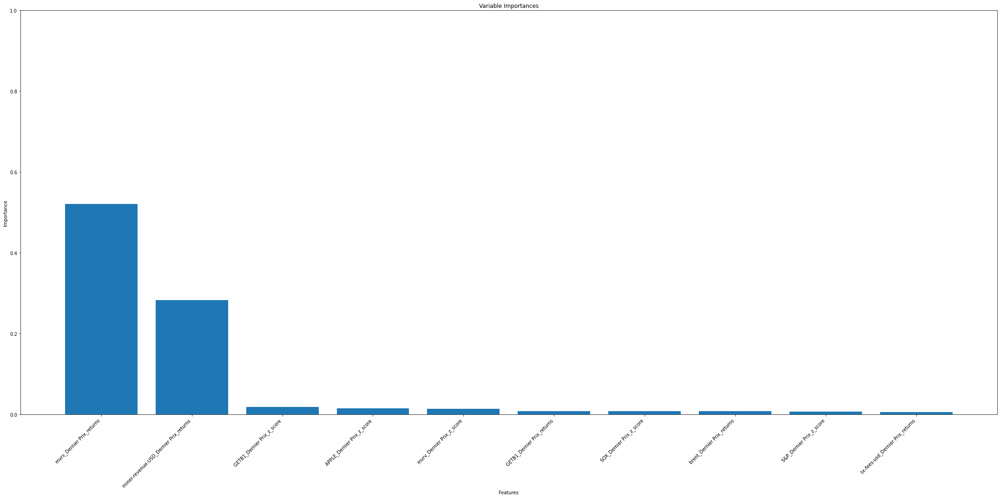

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.000076   5
1  miner-revenue-USD_Dernier Prix_returns  0.000015   2
2              GETB1_Dernier Prix_z_score  0.016993   2
3              APPLE_Dernier Prix_z_score  0.427825   1
4               mvrv_Dernier Prix_z_score  0.069605   1
5              GETB1_Dernier Prix_returns  0.679637   3
6                SOX_Dernier Prix_z_score  0.354203   1
7              brent_Dernier Prix_returns  0.000229   1
8                S&P_Dernier Prix_z_score  0.281769   2
9        tx-fees-usd_Dernier Prix_returns  0.000702   2
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.4867
1  miner-revenue-USD_Dernier Prix_returns      0.3333
2              GETB1_Dernier Prix_returns      0.0118
3              GETB1_Dernier Prix_z_score      0.0112
4               mvrv_Dernier Prix_z_score      0.0100
5            CESIEUR_Dernier Prix_returns      0.0087
6     

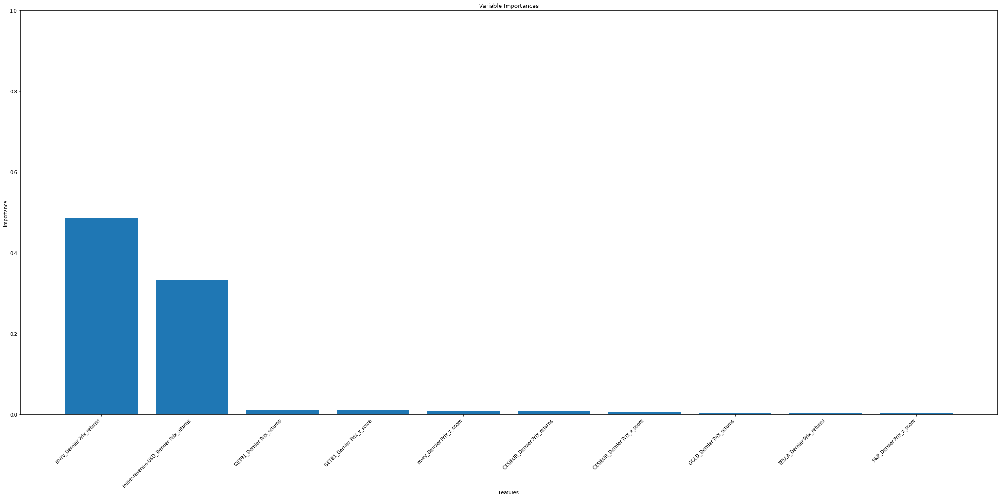

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.000072   5
1  miner-revenue-USD_Dernier Prix_returns  0.000011   1
2              GETB1_Dernier Prix_returns  0.695094   3
3              GETB1_Dernier Prix_z_score  0.020826   2
4               mvrv_Dernier Prix_z_score  0.099672   1
5            CESIEUR_Dernier Prix_returns  0.670871   1
6            CESIEUR_Dernier Prix_z_score  0.489958   1
7               GOLD_Dernier Prix_returns  0.179038   1
8              TESLA_Dernier Prix_returns  0.664269   1
9                S&P_Dernier Prix_z_score  0.394303   2
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.4008
1     miner-revenue-USD_Dernier Prix_returns      0.3970
2                  mvrv_Dernier Prix_z_score      0.0313
3                 brent_Dernier Prix_returns      0.0249
4  active_address_count_Dernier Prix_returns      0.0109
5                 GETB1_Dernier Prix_retur

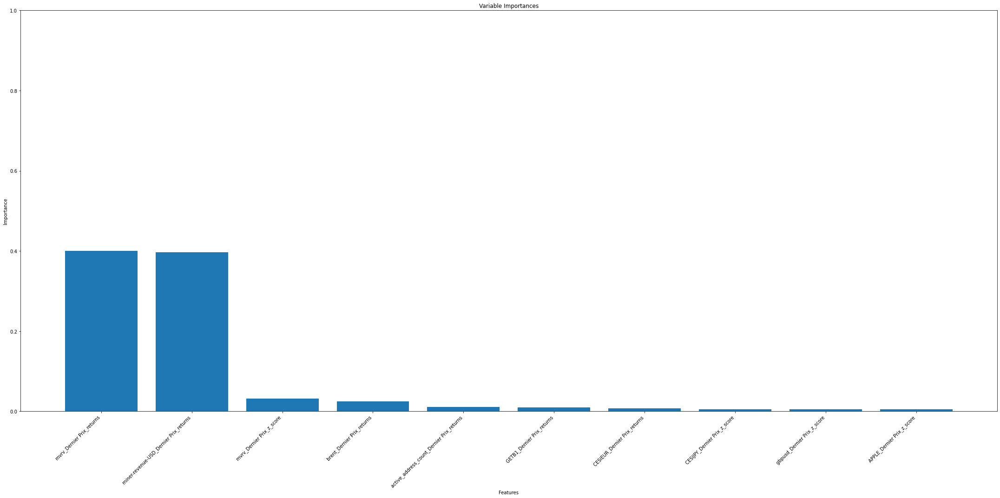

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.000008   5
1     miner-revenue-USD_Dernier Prix_returns  0.000061   1
2                  mvrv_Dernier Prix_z_score  0.081909   1
3                 brent_Dernier Prix_returns  0.000489   1
4  active_address_count_Dernier Prix_returns  0.032423   1
5                 GETB1_Dernier Prix_returns  0.671266   3
6               CESIEUR_Dernier Prix_returns  0.679894   1
7               CESIJPY_Dernier Prix_z_score  0.224815   2
8                gbpusd_Dernier Prix_z_score  0.673033   2
9                 APPLE_Dernier Prix_z_score  0.429221   1
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.4567
1     miner-revenue-USD_Dernier Prix_returns      0.3763
2                 GETB1_Dernier Prix_z_score      0.0173
3  active_address_count_Dernier Prix_returns      0.0131
4               CESIEUR_Dernier Prix_z_score      0.0077
5        

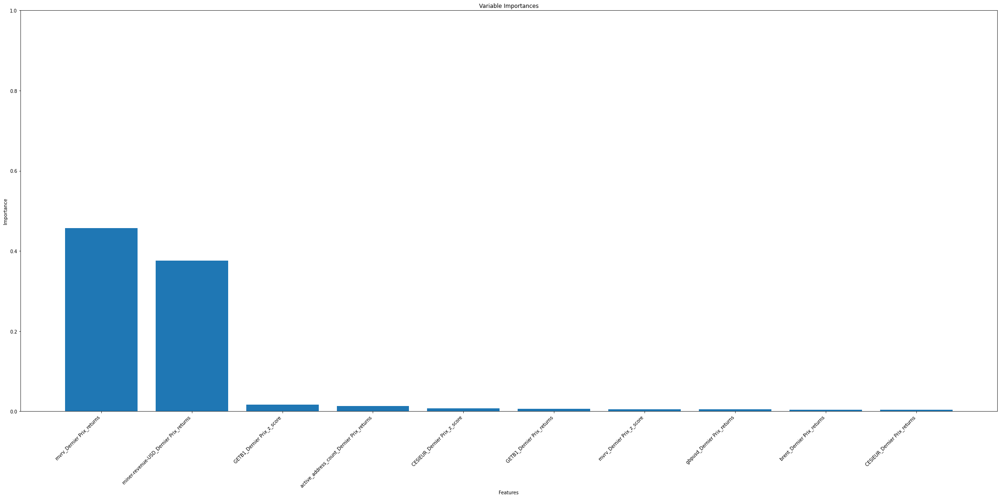

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.000006   5
1     miner-revenue-USD_Dernier Prix_returns  0.000347   2
2                 GETB1_Dernier Prix_z_score  0.000721   2
3  active_address_count_Dernier Prix_returns  0.020756   1
4               CESIEUR_Dernier Prix_z_score  0.493711   1
5                 GETB1_Dernier Prix_returns  0.650401   1
6                  mvrv_Dernier Prix_z_score  0.067743   1
7                gbpusd_Dernier Prix_returns  0.363498   2
8                 brent_Dernier Prix_returns  0.000498   1
9               CESIEUR_Dernier Prix_returns  0.671224   1
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.4890
1  miner-revenue-USD_Dernier Prix_returns      0.3493
2    tx_count_second_Dernier Prix_z_score      0.0091
3              brent_Dernier Prix_returns      0.0078
4               mvrv_Dernier Prix_z_score      0.0074
5            CESIEUR_Dernie

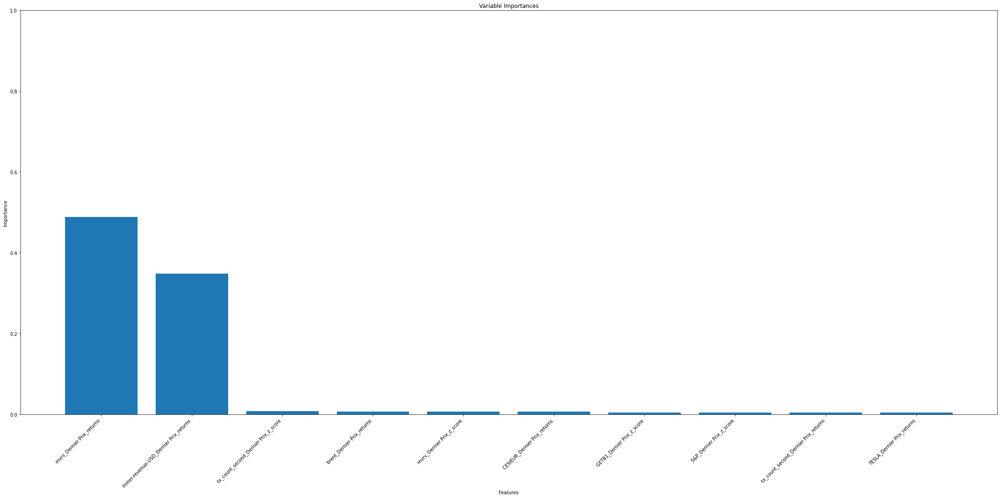

                                  Feature       p_value lag
0               mvrv_Dernier Prix_returns  9.964520e-07   5
1  miner-revenue-USD_Dernier Prix_returns  3.133095e-05   2
2    tx_count_second_Dernier Prix_z_score  1.675596e-01   5
3              brent_Dernier Prix_returns  3.242623e-04   1
4               mvrv_Dernier Prix_z_score  8.486805e-02   1
5            CESIEUR_Dernier Prix_returns  6.826587e-01   1
6              GETB1_Dernier Prix_z_score  6.395430e-03   1
7                S&P_Dernier Prix_z_score  7.124049e-01   2
8    tx_count_second_Dernier Prix_returns  1.267466e-02   3
9              TESLA_Dernier Prix_returns  7.402760e-01   5
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.4800
1     miner-revenue-USD_Dernier Prix_returns      0.3064
2                  mvrv_Dernier Prix_z_score      0.0549
3                 GETB1_Dernier Prix_returns      0.0206
4  active_address_count_Dernier Prix_z_score      0.012

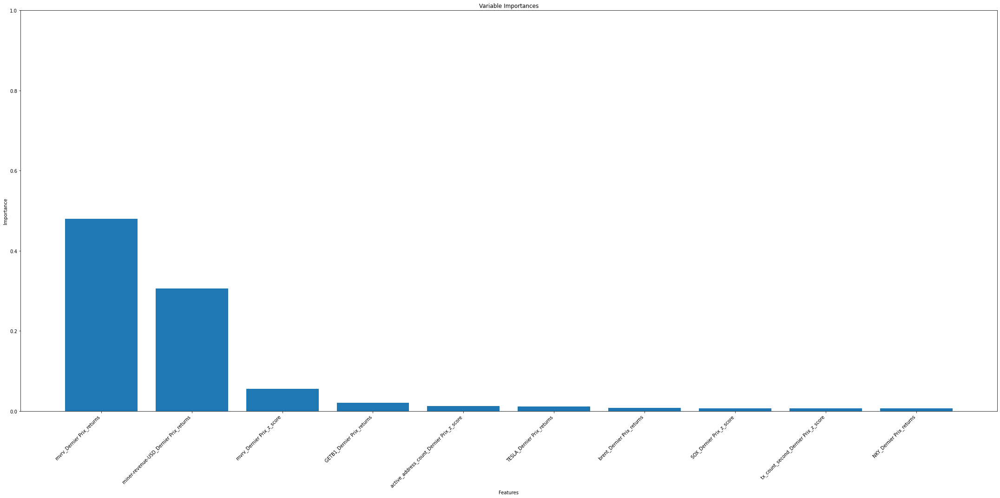

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.000006   4
1     miner-revenue-USD_Dernier Prix_returns  0.000201   1
2                  mvrv_Dernier Prix_z_score  0.039118   1
3                 GETB1_Dernier Prix_returns  0.544036   4
4  active_address_count_Dernier Prix_z_score  0.084037   5
5                 TESLA_Dernier Prix_returns  0.279098   1
6                 brent_Dernier Prix_returns  0.002314   1
7                   SOX_Dernier Prix_z_score  0.300261   1
8       tx_count_second_Dernier Prix_z_score  0.044432   5
9                   NKY_Dernier Prix_returns  0.531509   5
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.8662
1                  mvrv_Dernier Prix_z_score      0.0372
2     miner-revenue-USD_Dernier Prix_returns      0.0103
3               CESIEUR_Dernier Prix_z_score      0.0050
4                AMAZON_Dernier Prix_z_score      0.0041
5        

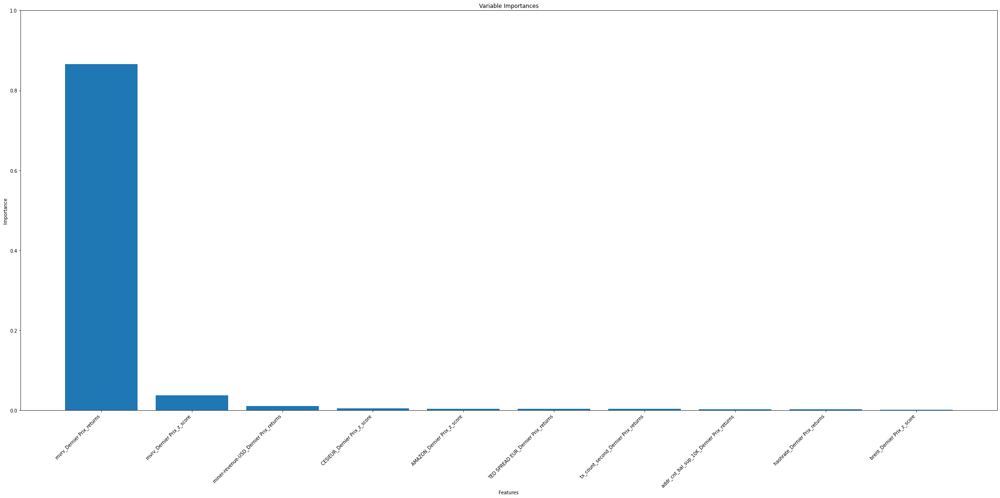

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.001426   3
1                  mvrv_Dernier Prix_z_score  0.012655   1
2     miner-revenue-USD_Dernier Prix_returns  0.006788   2
3               CESIEUR_Dernier Prix_z_score  0.421826   1
4                AMAZON_Dernier Prix_z_score  0.316841   4
5        TED SPREAD EUR_Dernier Prix_returns  1.000000   1
6       tx_count_second_Dernier Prix_returns  0.170446   5
7  addr_cnt_bal_sup_10K_Dernier Prix_returns  0.549664   1
8              hashrate_Dernier Prix_returns  0.163548   5
9                 brent_Dernier Prix_z_score  0.093900   1
                                Feature  Importance
0             mvrv_Dernier Prix_returns      0.9176
1             mvrv_Dernier Prix_z_score      0.0155
2          CESIJPY_Dernier Prix_returns      0.0021
3   avg-block-size_Dernier Prix_z_score      0.0018
4           GCNY3M_Dernier Prix_returns      0.0017
5  tx_count_second_Dernier Prix_z_score

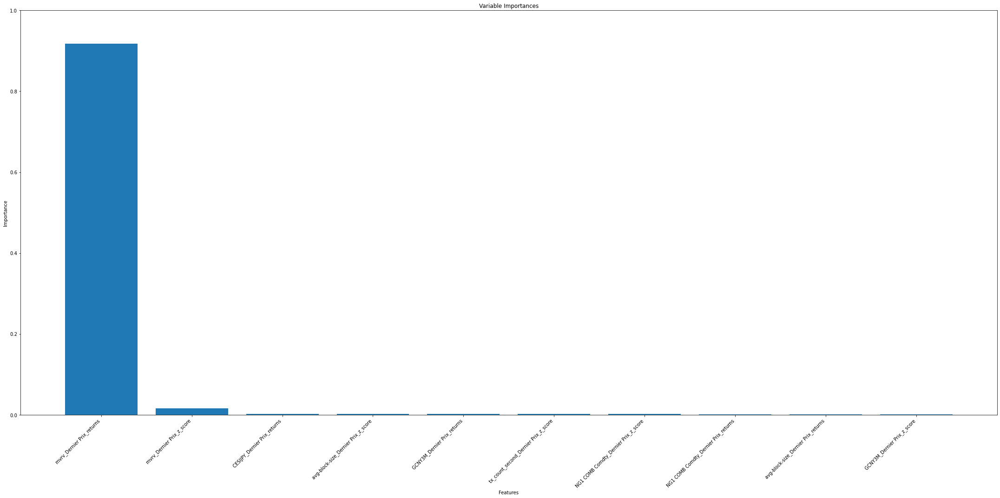

                                Feature   p_value lag
0             mvrv_Dernier Prix_returns  0.003351   3
1             mvrv_Dernier Prix_z_score  0.008842   1
2          CESIJPY_Dernier Prix_returns  0.107704   5
3   avg-block-size_Dernier Prix_z_score  0.000308   4
4           GCNY3M_Dernier Prix_returns  0.020924   5
5  tx_count_second_Dernier Prix_z_score  0.071238   4
6  NG1 COMB Comdty_Dernier Prix_z_score  0.546098   3
7  NG1 COMB Comdty_Dernier Prix_returns  0.384127   3
8   avg-block-size_Dernier Prix_returns  0.030764   4
9           GCNY3M_Dernier Prix_z_score  0.222574   5
                                          Feature  Importance
0                       mvrv_Dernier Prix_returns      0.9308
1                       mvrv_Dernier Prix_z_score      0.0043
2                     GCNY3M_Dernier Prix_z_score      0.0027
3  val_in_addr_w_bal_sup_10K_Dernier Prix_returns      0.0024
4                tx-fees-usd_Dernier Prix_returns      0.0023
5          miner-revenue-USD_Derni

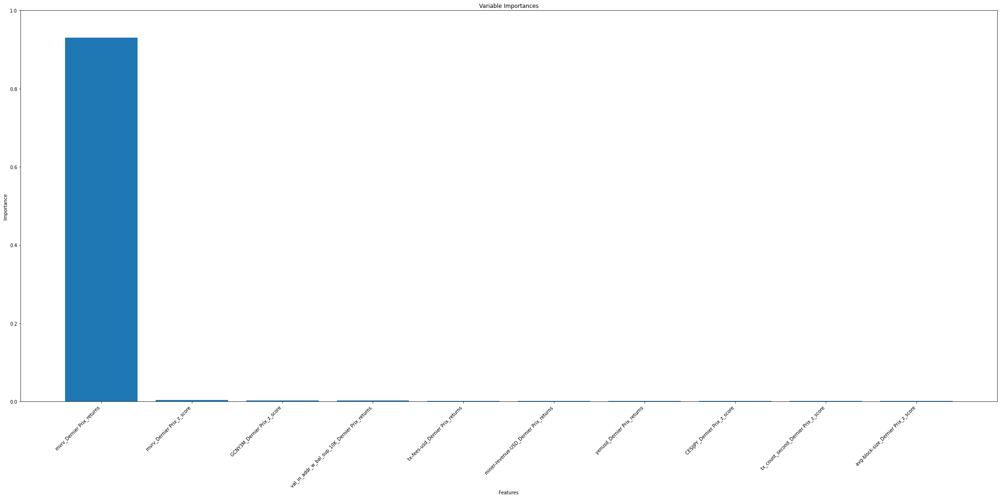

                                          Feature       p_value lag
0                       mvrv_Dernier Prix_returns  3.056139e-02   3
1                       mvrv_Dernier Prix_z_score  2.067262e-02   1
2                     GCNY3M_Dernier Prix_z_score  2.582199e-01   1
3  val_in_addr_w_bal_sup_10K_Dernier Prix_returns  5.105633e-02   2
4                tx-fees-usd_Dernier Prix_returns  1.692000e-07   2
5          miner-revenue-USD_Dernier Prix_returns  1.205017e-03   1
6                     yenusd_Dernier Prix_returns  9.023468e-01   5
7                    CESIJPY_Dernier Prix_z_score  5.777753e-02   5
8            tx_count_second_Dernier Prix_z_score  1.203070e-01   2
9             avg-block-size_Dernier Prix_z_score  1.951332e-03   2
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.9075
1               mvrv_Dernier Prix_z_score      0.0167
2             GCNY3M_Dernier Prix_z_score      0.0044
3        tx-fees-usd_Dernier Prix_re

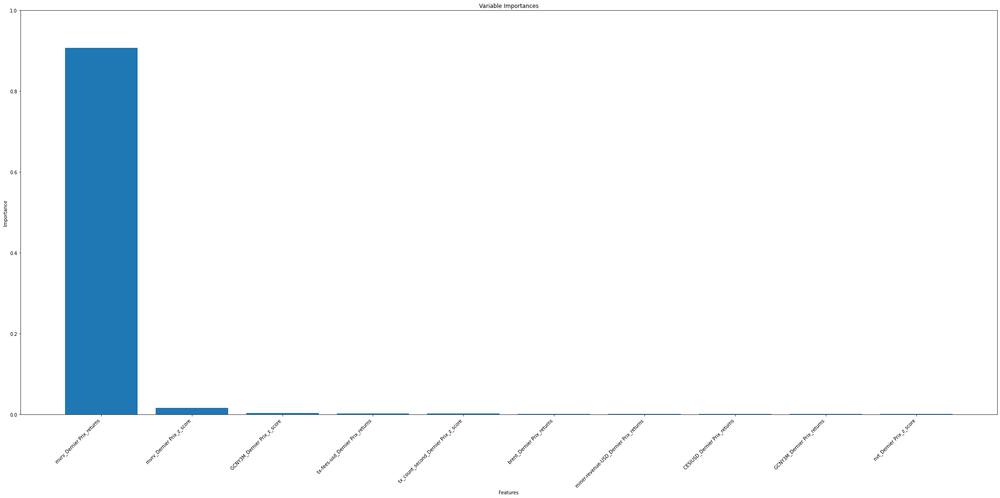

                                  Feature       p_value lag
0               mvrv_Dernier Prix_returns  2.498684e-02   3
1               mvrv_Dernier Prix_z_score  2.528492e-02   1
2             GCNY3M_Dernier Prix_z_score  9.836369e-02   5
3        tx-fees-usd_Dernier Prix_returns  5.394684e-09   3
4    tx_count_second_Dernier Prix_z_score  1.460504e-01   5
5              brent_Dernier Prix_returns  4.145677e-02   1
6  miner-revenue-USD_Dernier Prix_returns  1.596817e-03   1
7            CESIUSD_Dernier Prix_returns  6.199751e-01   2
8             GCNY3M_Dernier Prix_returns  1.056448e-02   5
9                nvt_Dernier Prix_z_score  3.270309e-02   2
                                          Feature  Importance
0                       mvrv_Dernier Prix_returns      0.9139
1                       mvrv_Dernier Prix_z_score      0.0062
2                tx-fees-btc_Dernier Prix_z_score      0.0048
3                       GOLD_Dernier Prix_returns      0.0044
4          miner-revenue-USD_D

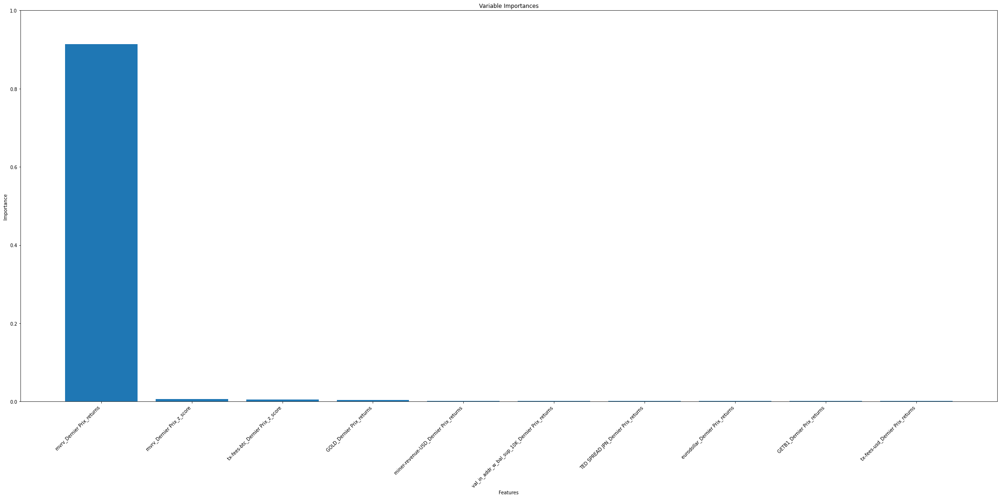

                                          Feature       p_value lag
0                       mvrv_Dernier Prix_returns  1.724058e-03   4
1                       mvrv_Dernier Prix_z_score  2.314122e-02   1
2                tx-fees-btc_Dernier Prix_z_score  4.311579e-01   2
3                       GOLD_Dernier Prix_returns  2.401603e-01   1
4          miner-revenue-USD_Dernier Prix_returns  1.892727e-03   2
5  val_in_addr_w_bal_sup_10K_Dernier Prix_returns  2.217569e-01   3
6             TED SPREAD JPN_Dernier Prix_returns  8.963587e-02   1
7                 eurodollar_Dernier Prix_returns  3.931203e-01   5
8                      GETB1_Dernier Prix_returns  2.671808e-01   2
9                tx-fees-usd_Dernier Prix_returns  4.981783e-10   3
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.8791
1     miner-revenue-USD_Dernier Prix_returns      0.0328
2                  mvrv_Dernier Prix_z_score      0.0062
3                 Cac40_

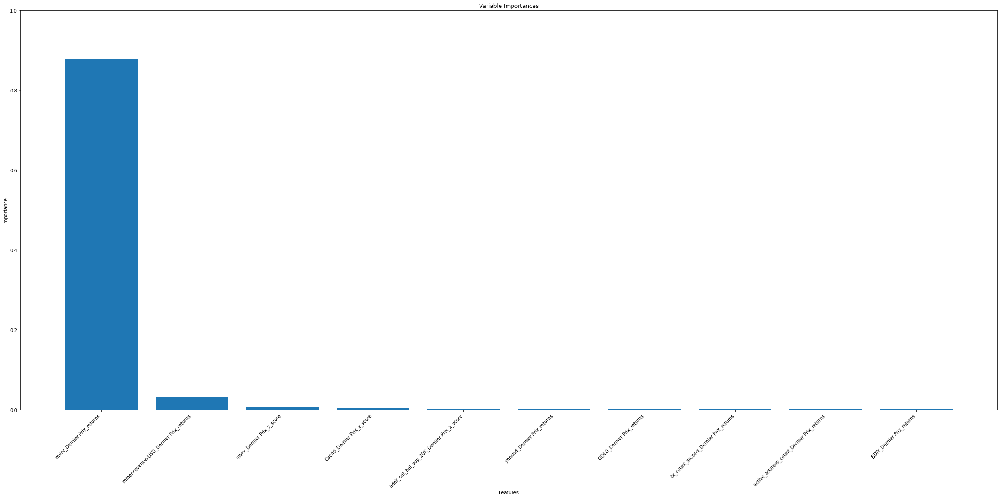

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.007057   4
1     miner-revenue-USD_Dernier Prix_returns  0.002541   4
2                  mvrv_Dernier Prix_z_score  0.034953   1
3                 Cac40_Dernier Prix_z_score  0.675406   1
4  addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.171333   3
5                yenusd_Dernier Prix_returns  0.876586   1
6                  GOLD_Dernier Prix_returns  0.194445   3
7       tx_count_second_Dernier Prix_returns  0.075130   4
8  active_address_count_Dernier Prix_returns  0.064531   5
9                  BDIY_Dernier Prix_returns  0.780045   1
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.8551
1     miner-revenue-USD_Dernier Prix_returns      0.0394
2                  mvrv_Dernier Prix_z_score      0.0187
3  addr_cnt_bal_sup_10K_Dernier Prix_z_score      0.0048
4                GCNY3M_Dernier Prix_returns      0.0034
5        

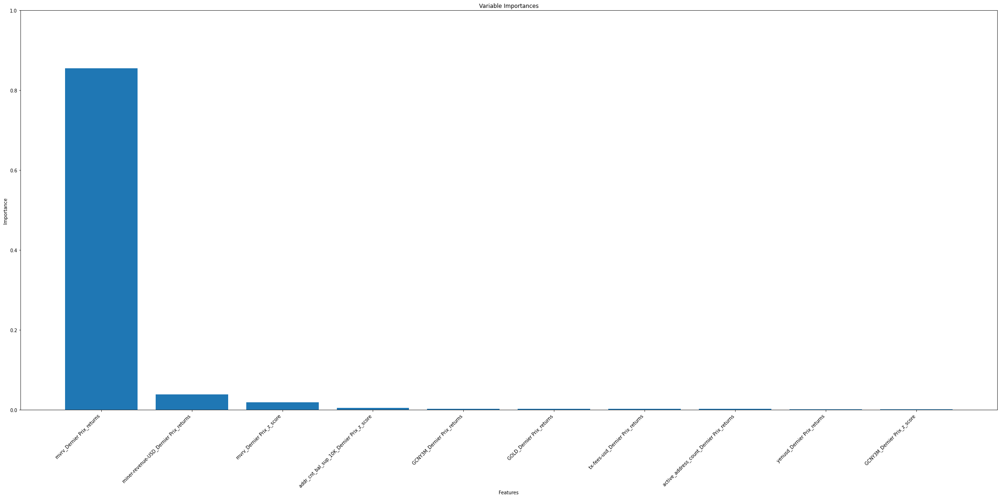

                                     Feature       p_value lag
0                  mvrv_Dernier Prix_returns  6.508910e-03   3
1     miner-revenue-USD_Dernier Prix_returns  3.103409e-03   2
2                  mvrv_Dernier Prix_z_score  2.376072e-02   1
3  addr_cnt_bal_sup_10K_Dernier Prix_z_score  5.314620e-01   3
4                GCNY3M_Dernier Prix_returns  3.691489e-02   2
5                  GOLD_Dernier Prix_returns  2.699192e-01   1
6           tx-fees-usd_Dernier Prix_returns  7.433621e-09   2
7  active_address_count_Dernier Prix_returns  1.267018e-02   4
8                yenusd_Dernier Prix_returns  8.334420e-01   1
9                GCNY3M_Dernier Prix_z_score  1.101844e-01   4
                                          Feature  Importance
0                       mvrv_Dernier Prix_returns      0.8263
1                       mvrv_Dernier Prix_z_score      0.0607
2          miner-revenue-USD_Dernier Prix_returns      0.0223
3       addr_cnt_bal_sup_10K_Dernier Prix_z_score      0.00

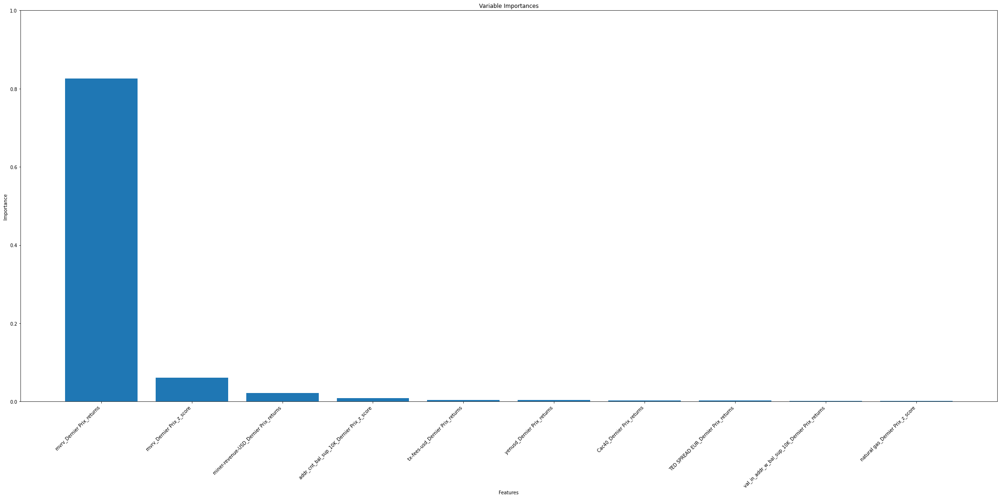

                                          Feature       p_value lag
0                       mvrv_Dernier Prix_returns  4.919929e-03   3
1                       mvrv_Dernier Prix_z_score  3.405343e-02   1
2          miner-revenue-USD_Dernier Prix_returns  1.128771e-02   2
3       addr_cnt_bal_sup_10K_Dernier Prix_z_score  2.885538e-01   3
4                tx-fees-usd_Dernier Prix_returns  4.808335e-09   2
5                     yenusd_Dernier Prix_returns  8.258987e-01   1
6                      Cac40_Dernier Prix_returns  1.240647e-01   5
7             TED SPREAD EUR_Dernier Prix_returns  1.000000e+00   1
8  val_in_addr_w_bal_sup_10K_Dernier Prix_returns  9.619380e-02   4
9                natural gas_Dernier Prix_z_score  6.822267e-01   3
                                          Feature  Importance
0                       mvrv_Dernier Prix_returns      0.8111
1          miner-revenue-USD_Dernier Prix_returns      0.0500
2                       mvrv_Dernier Prix_z_score      0.0410
3   

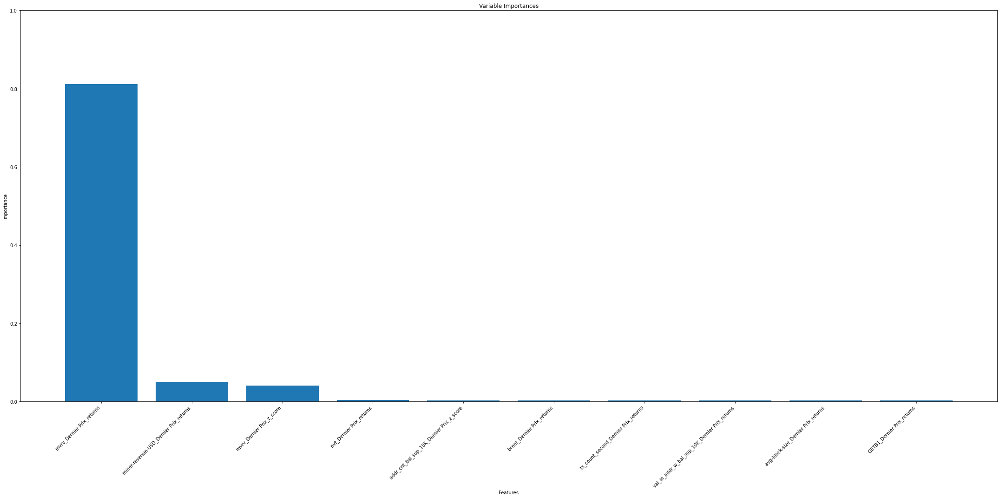

                                          Feature   p_value lag
0                       mvrv_Dernier Prix_returns  0.005689   3
1          miner-revenue-USD_Dernier Prix_returns  0.005420   2
2                       mvrv_Dernier Prix_z_score  0.038467   1
3                        nvt_Dernier Prix_returns  0.230814   2
4       addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.281752   3
5                      brent_Dernier Prix_returns  0.076190   1
6            tx_count_second_Dernier Prix_returns  0.042719   4
7  val_in_addr_w_bal_sup_10K_Dernier Prix_returns  0.095888   1
8             avg-block-size_Dernier Prix_returns  0.042195   4
9                      GETB1_Dernier Prix_returns  0.381719   2
                                          Feature  Importance
0                       mvrv_Dernier Prix_returns      0.7459
1                       mvrv_Dernier Prix_z_score      0.1062
2          miner-revenue-USD_Dernier Prix_returns      0.0403
3       addr_cnt_bal_sup_10K_Dernier Prix_z_scor

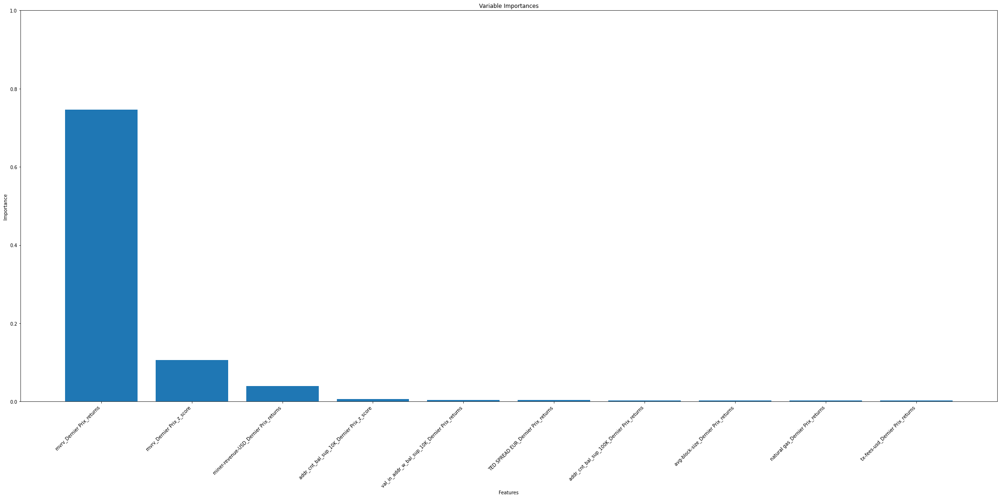

                                          Feature   p_value lag
0                       mvrv_Dernier Prix_returns  0.003452   3
1                       mvrv_Dernier Prix_z_score  0.037804   1
2          miner-revenue-USD_Dernier Prix_returns  0.015365   2
3       addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.212127   1
4  val_in_addr_w_bal_sup_10K_Dernier Prix_returns  0.106934   1
5             TED SPREAD EUR_Dernier Prix_returns  1.000000   1
6      addr_cnt_bal_sup_100K_Dernier Prix_returns  0.199511   4
7             avg-block-size_Dernier Prix_returns  0.039438   4
8                natural gas_Dernier Prix_returns  0.246853   3
9                tx-fees-usd_Dernier Prix_returns  0.000016   2
                                           Feature  Importance
0                        mvrv_Dernier Prix_returns      0.7834
1                        mvrv_Dernier Prix_z_score      0.0671
2           miner-revenue-USD_Dernier Prix_returns      0.0380
3        addr_cnt_bal_sup_10K_Dernier Prix_z

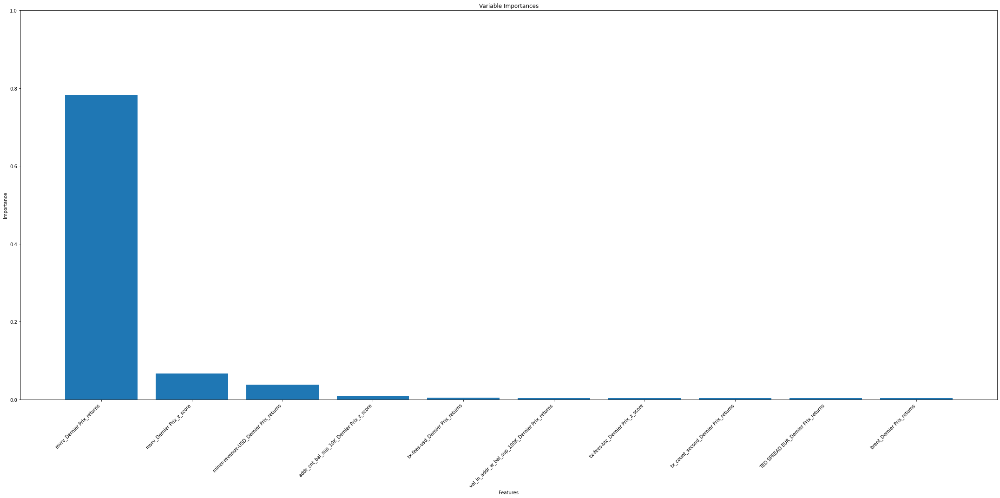

                                           Feature       p_value lag
0                        mvrv_Dernier Prix_returns  1.595964e-03   4
1                        mvrv_Dernier Prix_z_score  4.898432e-02   1
2           miner-revenue-USD_Dernier Prix_returns  1.592633e-02   2
3        addr_cnt_bal_sup_10K_Dernier Prix_z_score  1.978224e-01   1
4                 tx-fees-usd_Dernier Prix_returns  2.705840e-07   3
5  val_in_addr_w_bal_sup_100K_Dernier Prix_returns  1.152116e-01   4
6                 tx-fees-btc_Dernier Prix_z_score  4.075106e-01   2
7             tx_count_second_Dernier Prix_returns  5.813975e-02   4
8              TED SPREAD EUR_Dernier Prix_returns  2.196996e-01   3
9                       brent_Dernier Prix_returns  7.660588e-02   1
                                          Feature  Importance
0                       mvrv_Dernier Prix_returns      0.7516
1                       mvrv_Dernier Prix_z_score      0.0946
2          miner-revenue-USD_Dernier Prix_returns      

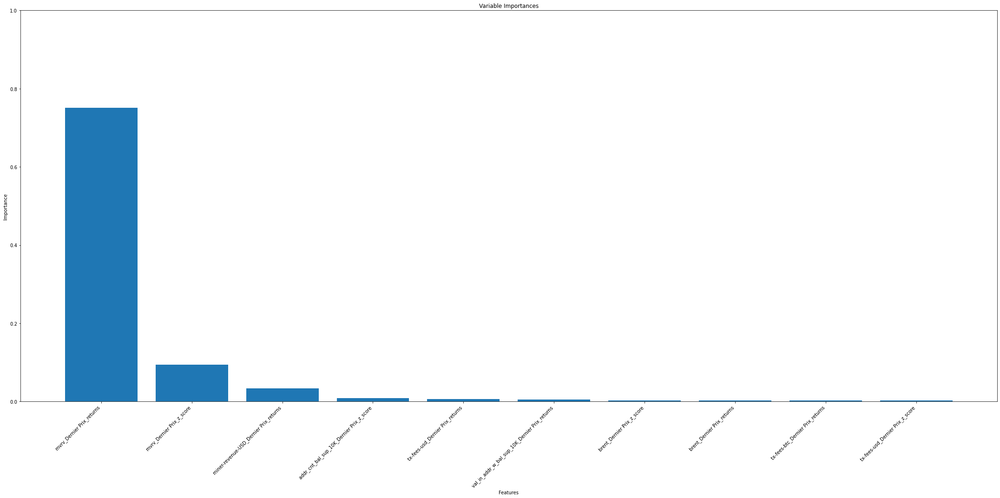

                                          Feature   p_value lag
0                       mvrv_Dernier Prix_returns  0.001398   3
1                       mvrv_Dernier Prix_z_score  0.042478   1
2          miner-revenue-USD_Dernier Prix_returns  0.017941   2
3       addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.205774   3
4                tx-fees-usd_Dernier Prix_returns  0.000002   3
5  val_in_addr_w_bal_sup_10K_Dernier Prix_returns  0.120364   1
6                      brent_Dernier Prix_z_score  0.367016   1
7                      brent_Dernier Prix_returns  0.078556   1
8                tx-fees-btc_Dernier Prix_returns  0.000285   2
9                tx-fees-usd_Dernier Prix_z_score  0.564370   1
                                          Feature  Importance
0                       mvrv_Dernier Prix_returns      0.7037
1          miner-revenue-USD_Dernier Prix_returns      0.0953
2                       mvrv_Dernier Prix_z_score      0.0842
3                tx-fees-usd_Dernier Prix_return

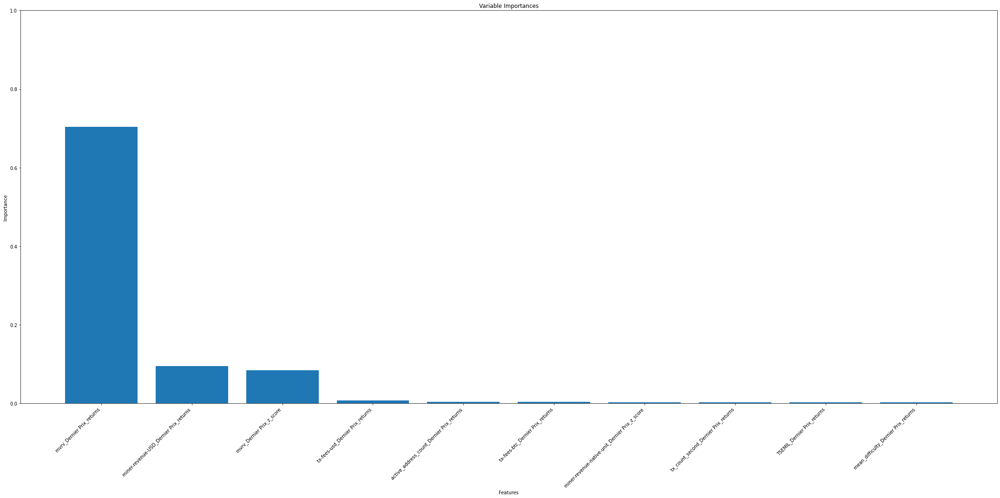

                                          Feature       p_value lag
0                       mvrv_Dernier Prix_returns  1.891864e-03   5
1          miner-revenue-USD_Dernier Prix_returns  8.585071e-03   4
2                       mvrv_Dernier Prix_z_score  7.202555e-02   1
3                tx-fees-usd_Dernier Prix_returns  2.121397e-07   2
4       active_address_count_Dernier Prix_returns  8.672422e-04   4
5                tx-fees-btc_Dernier Prix_returns  5.005589e-05   2
6  miner-revenue-native-unit_Dernier Prix_z_score  1.556992e-02   1
7            tx_count_second_Dernier Prix_returns  3.689527e-02   4
8                     TSEMIL_Dernier Prix_returns  5.917978e-01   3
9            mean_difficulty_Dernier Prix_returns  1.183831e-01   1
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.5427
1     miner-revenue-USD_Dernier Prix_returns      0.2807
2                  mvrv_Dernier Prix_z_score      0.0483
3           tx-fees-usd_

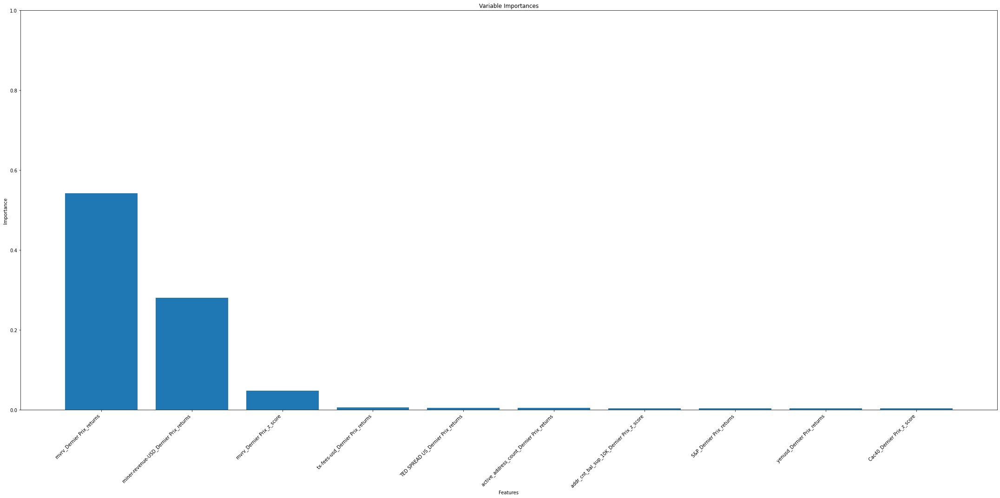

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.004266   3
1     miner-revenue-USD_Dernier Prix_returns  0.010666   2
2                  mvrv_Dernier Prix_z_score  0.042488   1
3           tx-fees-usd_Dernier Prix_returns  0.000001   2
4         TED SPREAD US_Dernier Prix_returns  0.200754   2
5  active_address_count_Dernier Prix_returns  0.002150   5
6  addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.085016   5
7                   S&P_Dernier Prix_returns  0.409227   1
8                yenusd_Dernier Prix_returns  0.585565   1
9                 Cac40_Dernier Prix_z_score  0.461614   5
                                          Feature  Importance
0                       mvrv_Dernier Prix_returns      0.5306
1          miner-revenue-USD_Dernier Prix_returns      0.3020
2                       mvrv_Dernier Prix_z_score      0.0465
3              TED SPREAD US_Dernier Prix_returns      0.0073
4                tx-fees-usd_Dernier Prix

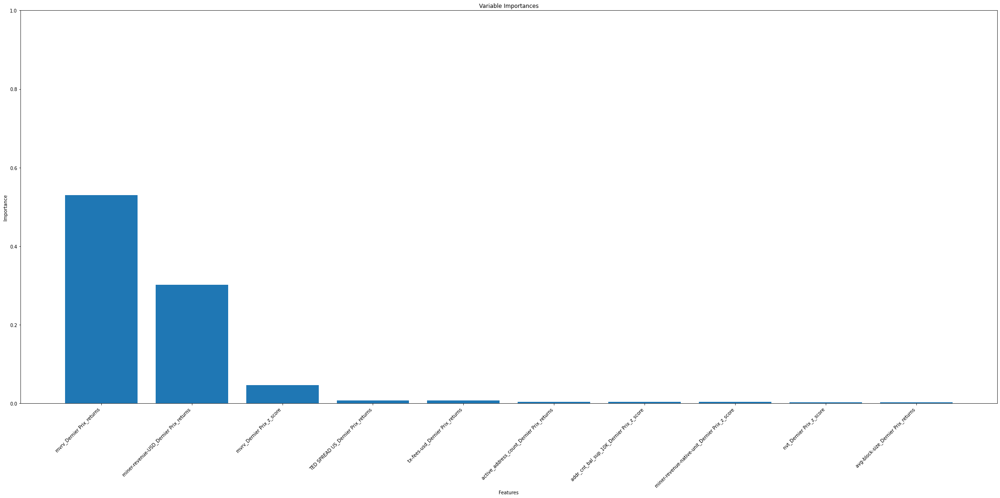

                                          Feature       p_value lag
0                       mvrv_Dernier Prix_returns  1.297100e-03   3
1          miner-revenue-USD_Dernier Prix_returns  1.768732e-02   2
2                       mvrv_Dernier Prix_z_score  8.683961e-02   1
3              TED SPREAD US_Dernier Prix_returns  1.152546e-01   4
4                tx-fees-usd_Dernier Prix_returns  7.345579e-07   2
5       active_address_count_Dernier Prix_returns  4.906164e-03   4
6       addr_cnt_bal_sup_10K_Dernier Prix_z_score  2.034663e-01   5
7  miner-revenue-native-unit_Dernier Prix_z_score  5.551612e-03   1
8                        nvt_Dernier Prix_z_score  4.644932e-02   2
9             avg-block-size_Dernier Prix_returns  1.280398e-03   4
                                          Feature  Importance
0                       mvrv_Dernier Prix_returns      0.5668
1          miner-revenue-USD_Dernier Prix_returns      0.2947
2                       mvrv_Dernier Prix_z_score      0.0278
3   

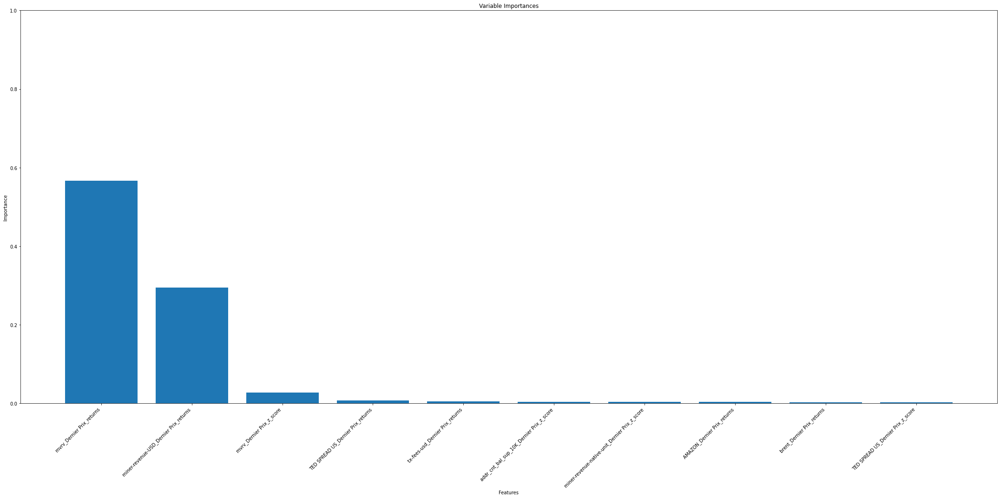

                                          Feature   p_value lag
0                       mvrv_Dernier Prix_returns  0.001394   3
1          miner-revenue-USD_Dernier Prix_returns  0.014491   2
2                       mvrv_Dernier Prix_z_score  0.225562   3
3              TED SPREAD US_Dernier Prix_returns  0.091828   4
4                tx-fees-usd_Dernier Prix_returns  0.000002   2
5       addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.063368   3
6  miner-revenue-native-unit_Dernier Prix_z_score  0.069604   5
7                     AMAZON_Dernier Prix_returns  0.794954   5
8                      brent_Dernier Prix_returns  0.164544   2
9              TED SPREAD US_Dernier Prix_z_score  0.308813   4
                                          Feature  Importance
0                       mvrv_Dernier Prix_returns      0.5958
1          miner-revenue-USD_Dernier Prix_returns      0.2712
2                       mvrv_Dernier Prix_z_score      0.0317
3       addr_cnt_bal_sup_10K_Dernier Prix_z_scor

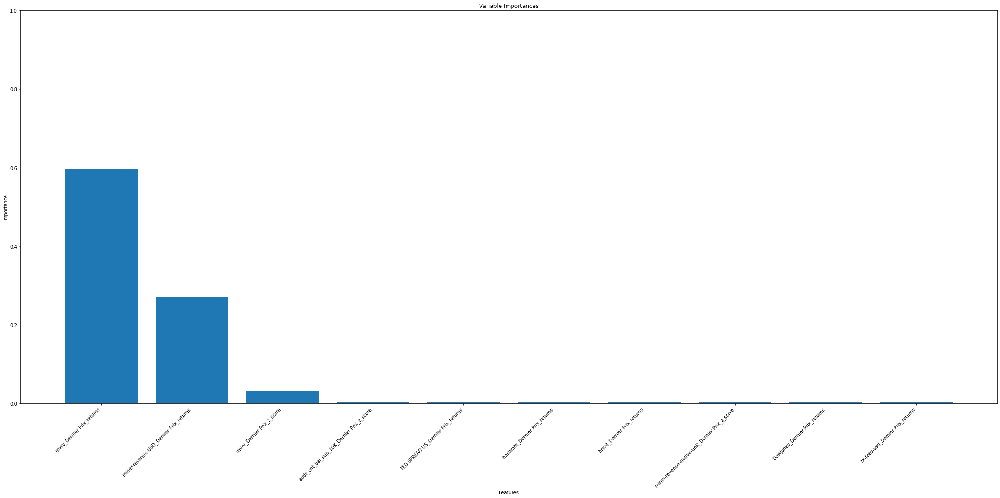

                                          Feature   p_value lag
0                       mvrv_Dernier Prix_returns  0.002556   3
1          miner-revenue-USD_Dernier Prix_returns  0.035776   4
2                       mvrv_Dernier Prix_z_score  0.202747   3
3       addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.060476   5
4              TED SPREAD US_Dernier Prix_returns  0.160429   4
5                   hashrate_Dernier Prix_returns  0.419885   5
6                      brent_Dernier Prix_returns  0.125037   1
7  miner-revenue-native-unit_Dernier Prix_z_score  0.107575   5
8                   DowJones_Dernier Prix_returns  0.066817   1
9                tx-fees-usd_Dernier Prix_returns  0.000001   2
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.6379
1     miner-revenue-USD_Dernier Prix_returns      0.2237
2                  mvrv_Dernier Prix_z_score      0.0367
3         TED SPREAD US_Dernier Prix_returns      0.0062
4          

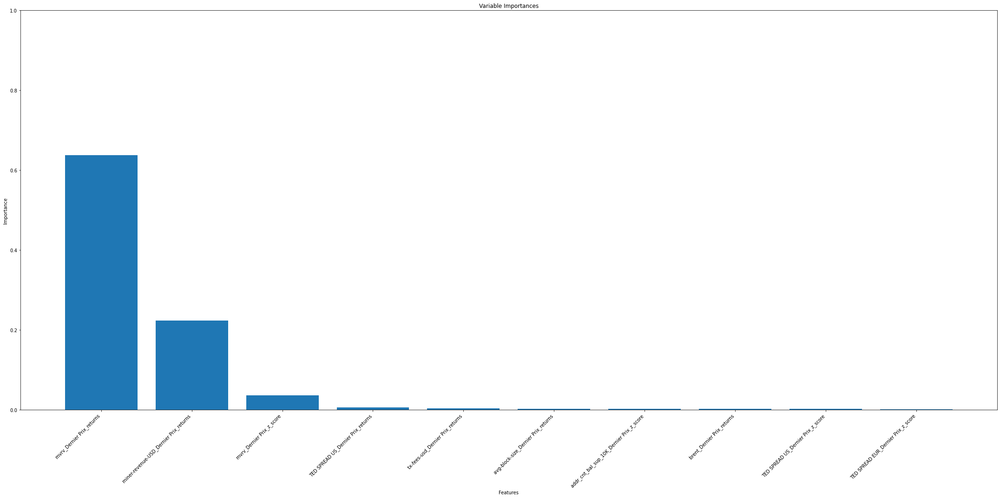

                                     Feature       p_value lag
0                  mvrv_Dernier Prix_returns  1.183907e-03   3
1     miner-revenue-USD_Dernier Prix_returns  5.624257e-02   4
2                  mvrv_Dernier Prix_z_score  2.034526e-01   3
3         TED SPREAD US_Dernier Prix_returns  1.493148e-01   4
4           tx-fees-usd_Dernier Prix_returns  3.526735e-07   3
5        avg-block-size_Dernier Prix_returns  1.975234e-02   4
6  addr_cnt_bal_sup_10K_Dernier Prix_z_score  7.347908e-02   3
7                 brent_Dernier Prix_returns  1.191326e-01   1
8         TED SPREAD US_Dernier Prix_z_score  2.147002e-01   4
9        TED SPREAD EUR_Dernier Prix_z_score  7.012544e-02   5
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.6041
1     miner-revenue-USD_Dernier Prix_returns      0.2732
2                  mvrv_Dernier Prix_z_score      0.0196
3         TED SPREAD US_Dernier Prix_returns      0.0069
4           tx-fees-us

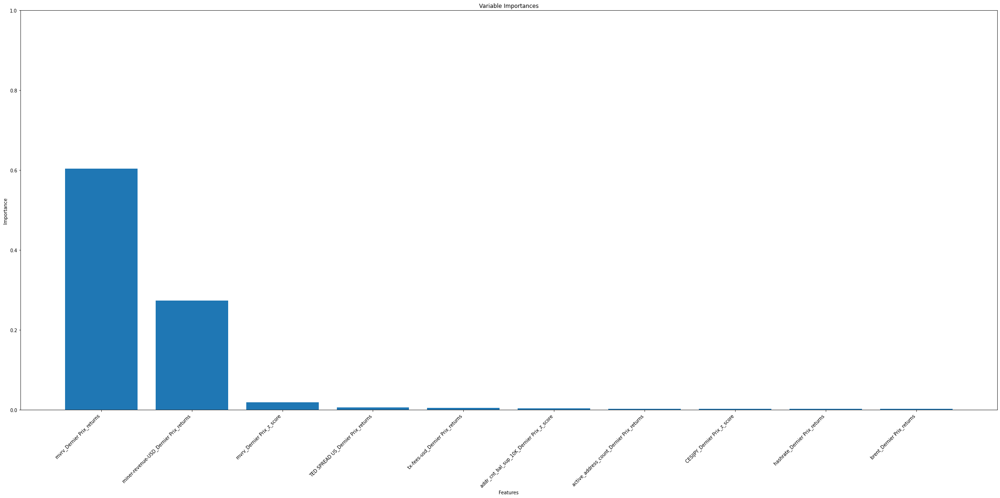

                                     Feature       p_value lag
0                  mvrv_Dernier Prix_returns  1.549211e-03   3
1     miner-revenue-USD_Dernier Prix_returns  4.432186e-02   1
2                  mvrv_Dernier Prix_z_score  1.917203e-01   1
3         TED SPREAD US_Dernier Prix_returns  1.244816e-01   4
4           tx-fees-usd_Dernier Prix_returns  4.213358e-07   2
5  addr_cnt_bal_sup_10K_Dernier Prix_z_score  5.284442e-02   3
6  active_address_count_Dernier Prix_returns  9.135030e-04   5
7               CESIJPY_Dernier Prix_z_score  3.987090e-01   5
8              hashrate_Dernier Prix_returns  5.245410e-01   2
9                 brent_Dernier Prix_returns  1.082861e-01   1
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.5835
1     miner-revenue-USD_Dernier Prix_returns      0.2654
2                  mvrv_Dernier Prix_z_score      0.0450
3         TED SPREAD US_Dernier Prix_returns      0.0065
4  addr_cnt_bal_sup_10

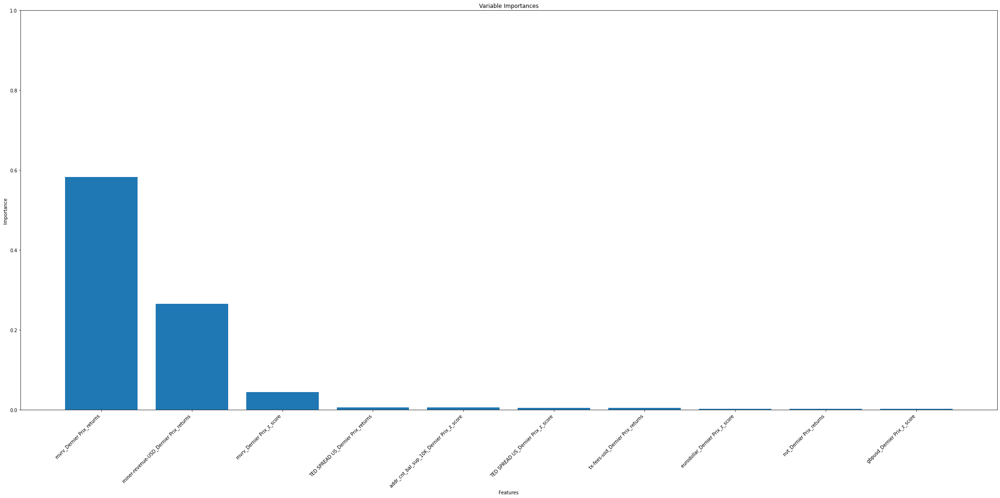

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.001895   3
1     miner-revenue-USD_Dernier Prix_returns  0.055830   1
2                  mvrv_Dernier Prix_z_score  0.143490   1
3         TED SPREAD US_Dernier Prix_returns  0.146833   4
4  addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.052863   3
5         TED SPREAD US_Dernier Prix_z_score  0.192877   5
6           tx-fees-usd_Dernier Prix_returns  0.003633   2
7            eurodollar_Dernier Prix_z_score  0.313912   3
8                   nvt_Dernier Prix_returns  0.154320   2
9                gbpusd_Dernier Prix_z_score  0.144908   3
                                          Feature  Importance
0                       mvrv_Dernier Prix_returns      0.6833
1          miner-revenue-USD_Dernier Prix_returns      0.1745
2                       mvrv_Dernier Prix_z_score      0.0438
3              TED SPREAD US_Dernier Prix_returns      0.0048
4                tx-fees-usd_Dernier Prix

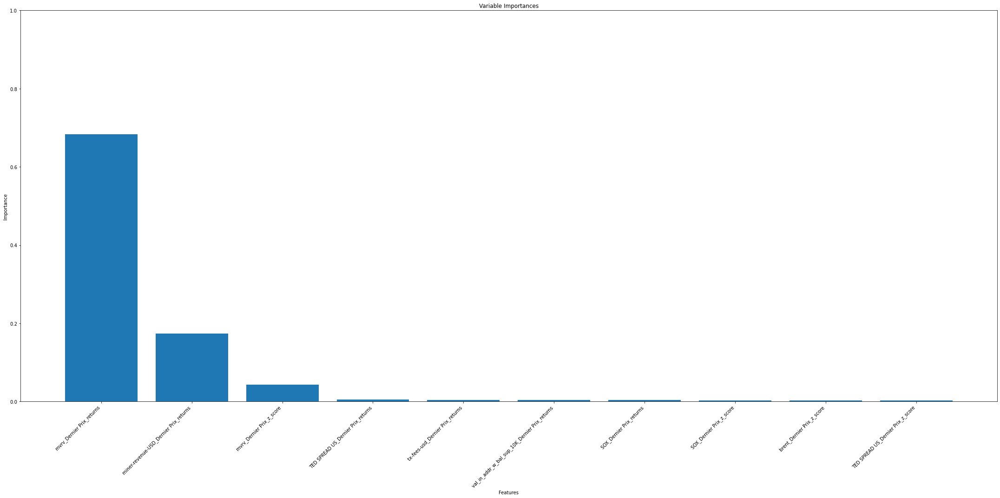

                                          Feature   p_value lag
0                       mvrv_Dernier Prix_returns  0.001960   3
1          miner-revenue-USD_Dernier Prix_returns  0.057519   1
2                       mvrv_Dernier Prix_z_score  0.119787   1
3              TED SPREAD US_Dernier Prix_returns  0.087103   4
4                tx-fees-usd_Dernier Prix_returns  0.000008   2
5  val_in_addr_w_bal_sup_10K_Dernier Prix_returns  0.007292   2
6                        SOX_Dernier Prix_returns  0.453598   3
7                        SOX_Dernier Prix_z_score  0.598605   3
8                      brent_Dernier Prix_z_score  0.066375   2
9              TED SPREAD US_Dernier Prix_z_score  0.060736   5
                                          Feature  Importance
0                       mvrv_Dernier Prix_returns      0.6334
1          miner-revenue-USD_Dernier Prix_returns      0.2231
2                       mvrv_Dernier Prix_z_score      0.0434
3              TED SPREAD US_Dernier Prix_z_scor

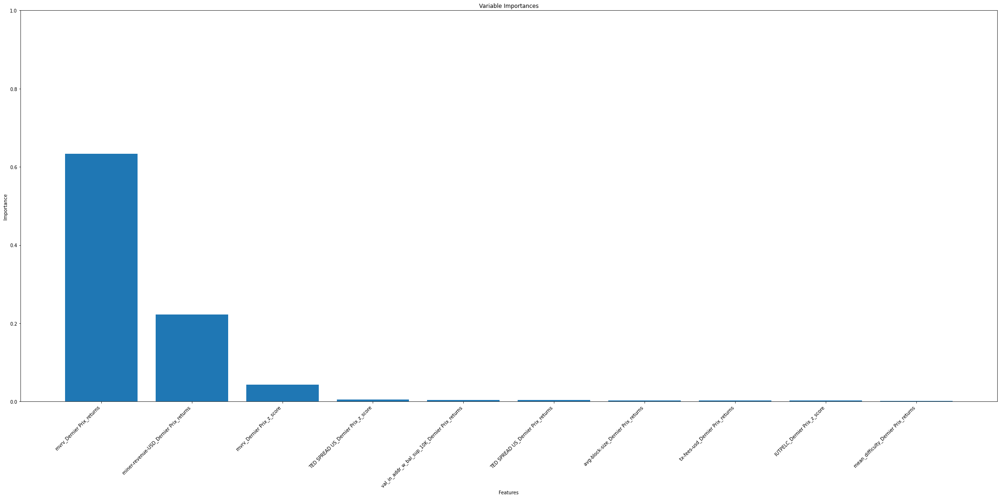

                                          Feature   p_value lag
0                       mvrv_Dernier Prix_returns  0.003079   3
1          miner-revenue-USD_Dernier Prix_returns  0.026706   1
2                       mvrv_Dernier Prix_z_score  0.079682   2
3              TED SPREAD US_Dernier Prix_z_score  0.067620   5
4  val_in_addr_w_bal_sup_10K_Dernier Prix_returns  0.006583   2
5              TED SPREAD US_Dernier Prix_returns  0.086286   4
6             avg-block-size_Dernier Prix_returns  0.007617   4
7                tx-fees-usd_Dernier Prix_returns  0.000018   2
8                    IUTPELC_Dernier Prix_z_score  0.573742   2
9            mean_difficulty_Dernier Prix_returns  0.135751   1
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.6367
1     miner-revenue-USD_Dernier Prix_returns      0.2262
2                  mvrv_Dernier Prix_z_score      0.0332
3         TED SPREAD US_Dernier Prix_z_score      0.0065
4  addr_cnt

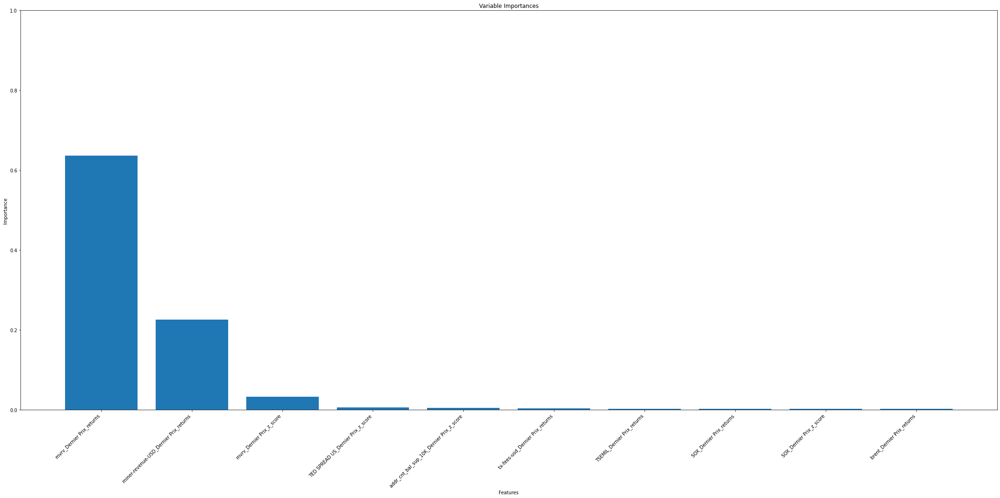

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.003688   3
1     miner-revenue-USD_Dernier Prix_returns  0.033975   1
2                  mvrv_Dernier Prix_z_score  0.056198   1
3         TED SPREAD US_Dernier Prix_z_score  0.076962   5
4  addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.034422   3
5           tx-fees-usd_Dernier Prix_returns  0.000013   2
6                TSEMIL_Dernier Prix_returns  0.359023   3
7                   SOX_Dernier Prix_returns  0.249413   3
8                   SOX_Dernier Prix_z_score  0.358343   1
9                 brent_Dernier Prix_returns  0.058770   2
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.6424
1     miner-revenue-USD_Dernier Prix_returns      0.2281
2                  mvrv_Dernier Prix_z_score      0.0242
3         TED SPREAD US_Dernier Prix_returns      0.0067
4         TED SPREAD US_Dernier Prix_z_score      0.0046
5        

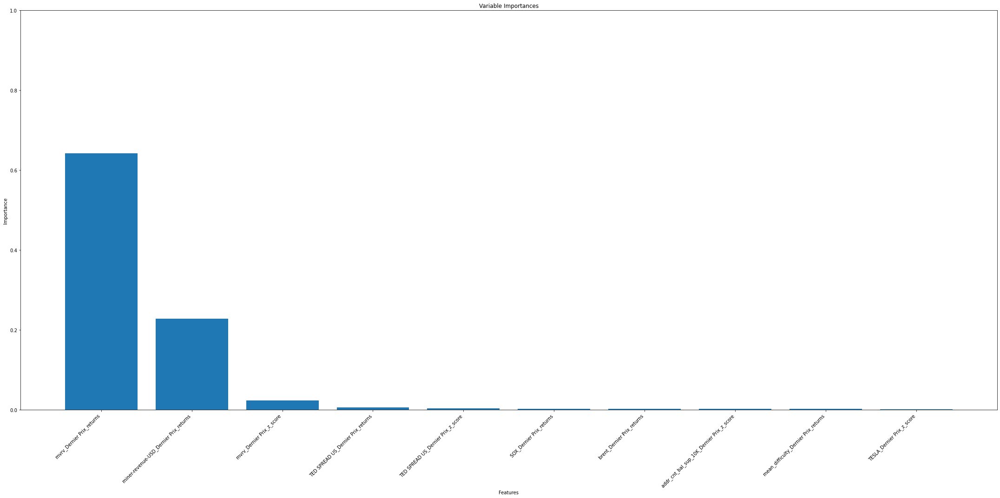

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.001493   3
1     miner-revenue-USD_Dernier Prix_returns  0.059751   1
2                  mvrv_Dernier Prix_z_score  0.020461   1
3         TED SPREAD US_Dernier Prix_returns  0.096833   4
4         TED SPREAD US_Dernier Prix_z_score  0.048794   5
5                   SOX_Dernier Prix_returns  0.228939   3
6                 brent_Dernier Prix_returns  0.037052   1
7  addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.008937   3
8       mean_difficulty_Dernier Prix_returns  0.096855   2
9                 TESLA_Dernier Prix_z_score  0.665655   1
                                          Feature  Importance
0                       mvrv_Dernier Prix_returns      0.6983
1          miner-revenue-USD_Dernier Prix_returns      0.1715
2                       mvrv_Dernier Prix_z_score      0.0224
3              TED SPREAD US_Dernier Prix_returns      0.0062
4                tx-fees-usd_Dernier Prix

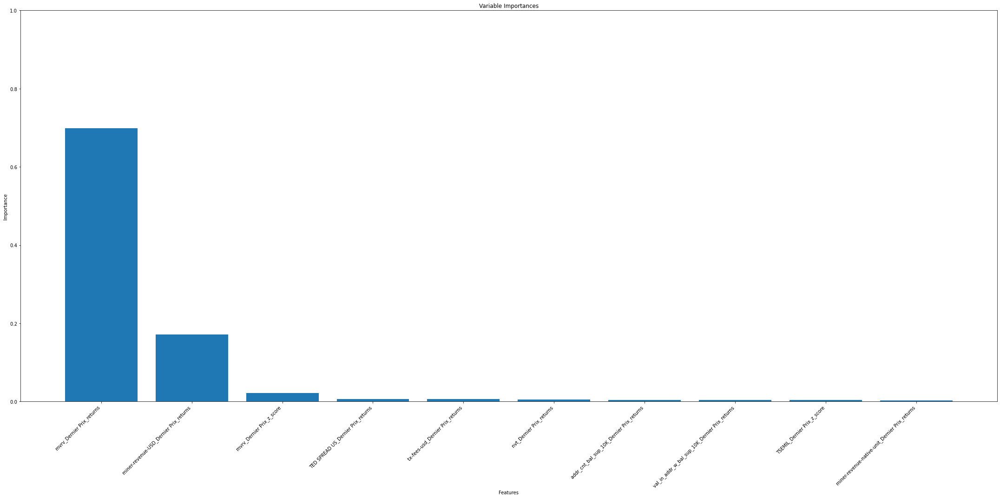

                                          Feature   p_value lag
0                       mvrv_Dernier Prix_returns  0.000990   3
1          miner-revenue-USD_Dernier Prix_returns  0.131830   1
2                       mvrv_Dernier Prix_z_score  0.033132   1
3              TED SPREAD US_Dernier Prix_returns  0.106714   4
4                tx-fees-usd_Dernier Prix_returns  0.000072   2
5                        nvt_Dernier Prix_returns  0.179556   2
6       addr_cnt_bal_sup_10K_Dernier Prix_returns  0.012362   3
7  val_in_addr_w_bal_sup_10K_Dernier Prix_returns  0.001674   2
8                     TSEMIL_Dernier Prix_z_score  0.139451   3
9  miner-revenue-native-unit_Dernier Prix_returns  0.177285   1
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.7243
1     miner-revenue-USD_Dernier Prix_returns      0.1117
2                  mvrv_Dernier Prix_z_score      0.0511
3         TED SPREAD US_Dernier Prix_returns      0.0088
4          

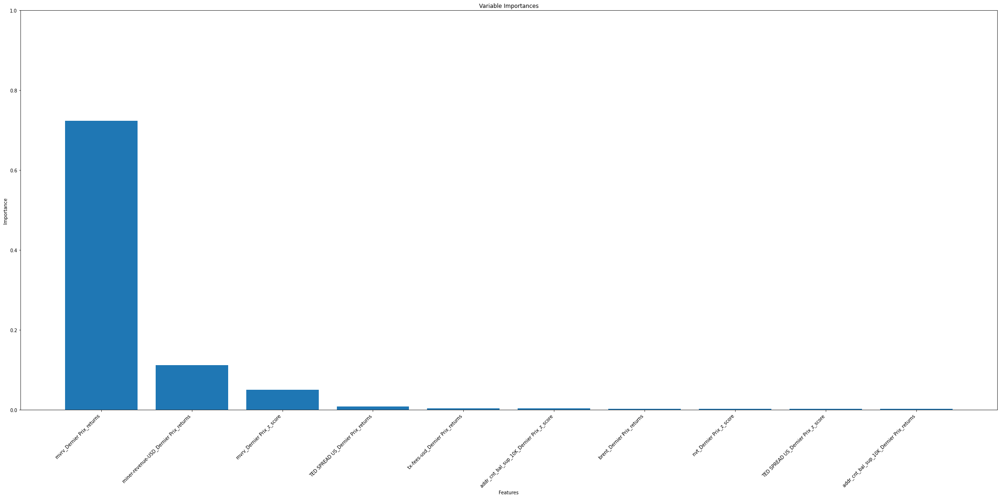

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.004371   3
1     miner-revenue-USD_Dernier Prix_returns  0.066837   1
2                  mvrv_Dernier Prix_z_score  0.090698   1
3         TED SPREAD US_Dernier Prix_returns  0.321728   4
4           tx-fees-usd_Dernier Prix_returns  0.000018   2
5  addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.043840   3
6                 brent_Dernier Prix_returns  0.054735   2
7                   nvt_Dernier Prix_z_score  0.102343   2
8         TED SPREAD US_Dernier Prix_z_score  0.357554   5
9  addr_cnt_bal_sup_10K_Dernier Prix_returns  0.023610   2
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.6889
1     miner-revenue-USD_Dernier Prix_returns      0.1522
2                  mvrv_Dernier Prix_z_score      0.0399
3         TED SPREAD US_Dernier Prix_returns      0.0075
4         TED SPREAD US_Dernier Prix_z_score      0.0058
5        

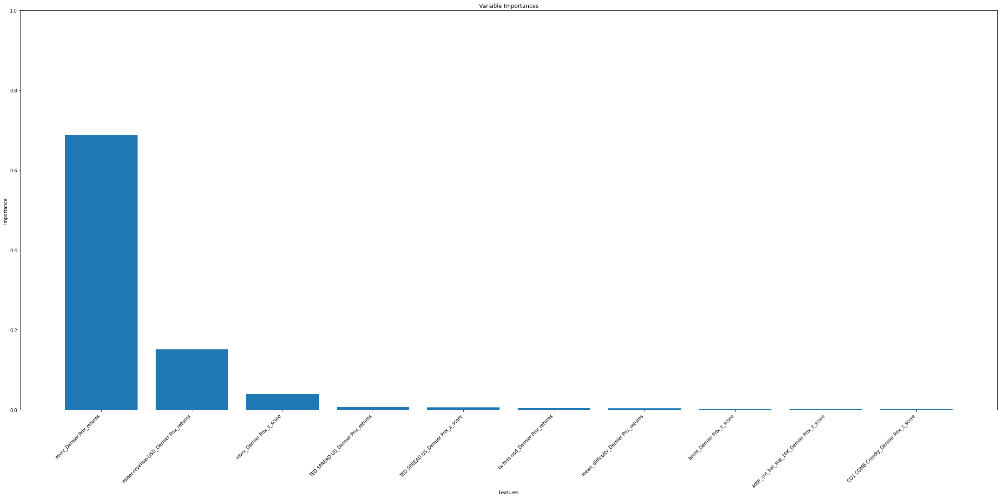

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.000958   3
1     miner-revenue-USD_Dernier Prix_returns  0.080629   1
2                  mvrv_Dernier Prix_z_score  0.072546   3
3         TED SPREAD US_Dernier Prix_returns  0.415761   3
4         TED SPREAD US_Dernier Prix_z_score  0.333306   5
5           tx-fees-usd_Dernier Prix_returns  0.000013   2
6       mean_difficulty_Dernier Prix_returns  0.130431   2
7                 brent_Dernier Prix_z_score  0.066831   2
8  addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.072897   3
9       CO1 COMB Comdty_Dernier Prix_z_score  0.629918   2
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.6810
1     miner-revenue-USD_Dernier Prix_returns      0.1537
2                  mvrv_Dernier Prix_z_score      0.0396
3         TED SPREAD US_Dernier Prix_returns      0.0098
4           tx-fees-usd_Dernier Prix_returns      0.0093
5        

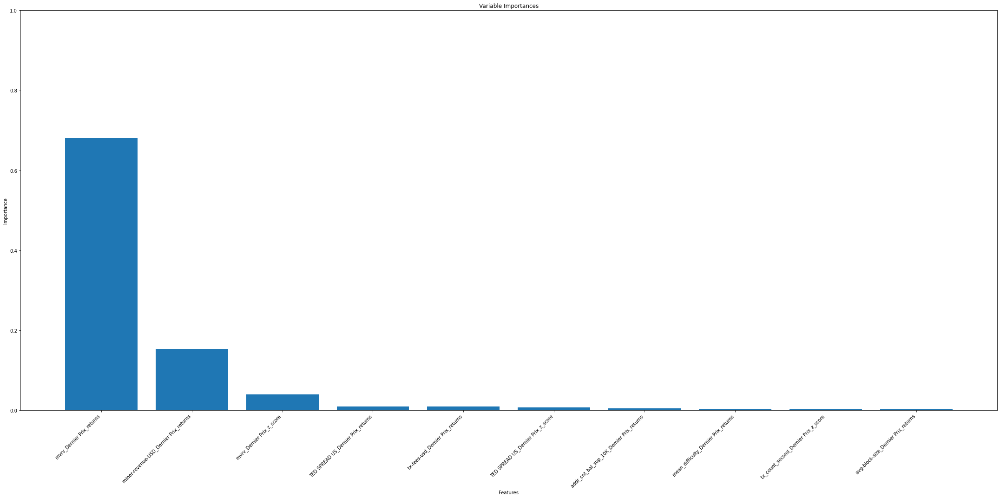

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.001181   3
1     miner-revenue-USD_Dernier Prix_returns  0.081202   1
2                  mvrv_Dernier Prix_z_score  0.066380   3
3         TED SPREAD US_Dernier Prix_returns  0.365747   4
4           tx-fees-usd_Dernier Prix_returns  0.000012   2
5         TED SPREAD US_Dernier Prix_z_score  0.301734   5
6  addr_cnt_bal_sup_10K_Dernier Prix_returns  0.028688   2
7       mean_difficulty_Dernier Prix_returns  0.121196   2
8       tx_count_second_Dernier Prix_z_score  0.053469   4
9        avg-block-size_Dernier Prix_returns  0.003031   4
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.7050
1     miner-revenue-USD_Dernier Prix_returns      0.1549
2                  mvrv_Dernier Prix_z_score      0.0191
3         TED SPREAD US_Dernier Prix_returns      0.0087
4           tx-fees-usd_Dernier Prix_returns      0.0055
5        

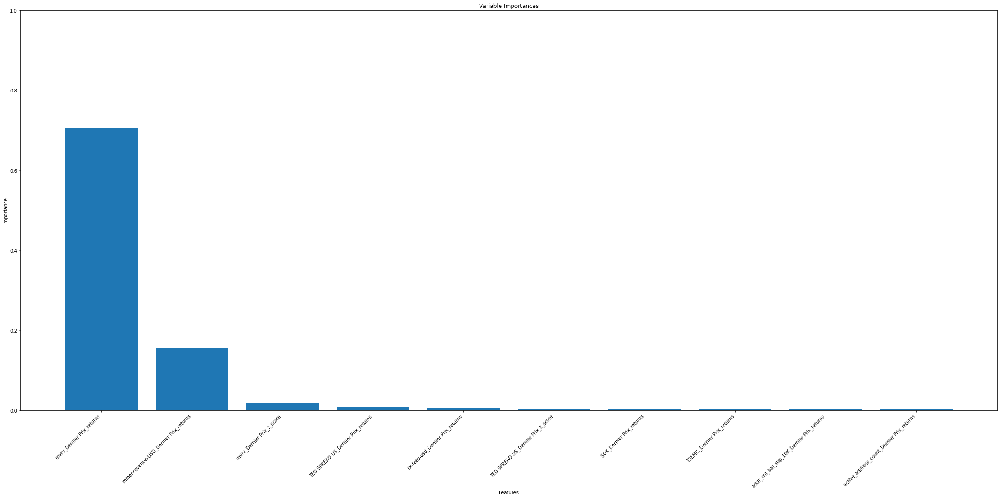

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.000868   3
1     miner-revenue-USD_Dernier Prix_returns  0.069327   1
2                  mvrv_Dernier Prix_z_score  0.091262   1
3         TED SPREAD US_Dernier Prix_returns  0.416056   4
4           tx-fees-usd_Dernier Prix_returns  0.000014   2
5         TED SPREAD US_Dernier Prix_z_score  0.351126   5
6                   SOX_Dernier Prix_returns  0.364433   3
7                TSEMIL_Dernier Prix_returns  0.430260   3
8  addr_cnt_bal_sup_10K_Dernier Prix_returns  0.014906   2
9  active_address_count_Dernier Prix_returns  0.008615   4
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.6447
1     miner-revenue-USD_Dernier Prix_returns      0.2133
2         TED SPREAD US_Dernier Prix_returns      0.0167
3           tx-fees-usd_Dernier Prix_returns      0.0107
4                  mvrv_Dernier Prix_z_score      0.0090
5  active

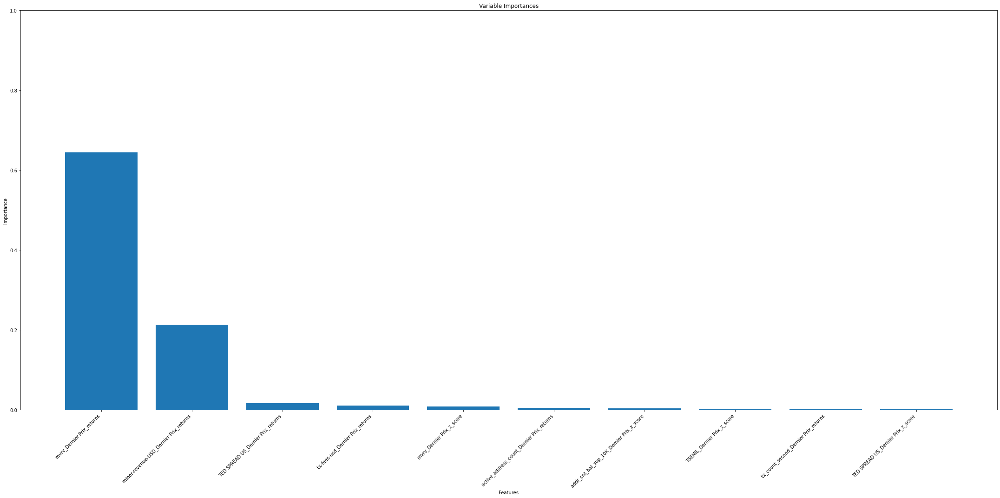

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.001041   3
1     miner-revenue-USD_Dernier Prix_returns  0.034536   1
2         TED SPREAD US_Dernier Prix_returns  0.432272   4
3           tx-fees-usd_Dernier Prix_returns  0.000122   2
4                  mvrv_Dernier Prix_z_score  0.127559   1
5  active_address_count_Dernier Prix_returns  0.008773   5
6  addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.041414   3
7                TSEMIL_Dernier Prix_z_score  0.305281   3
8       tx_count_second_Dernier Prix_returns  0.063695   2
9         TED SPREAD US_Dernier Prix_z_score  0.353871   5
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.6389
1     miner-revenue-USD_Dernier Prix_returns      0.2140
2                  mvrv_Dernier Prix_z_score      0.0271
3         TED SPREAD US_Dernier Prix_returns      0.0093
4  active_address_count_Dernier Prix_returns      0.0073
5        

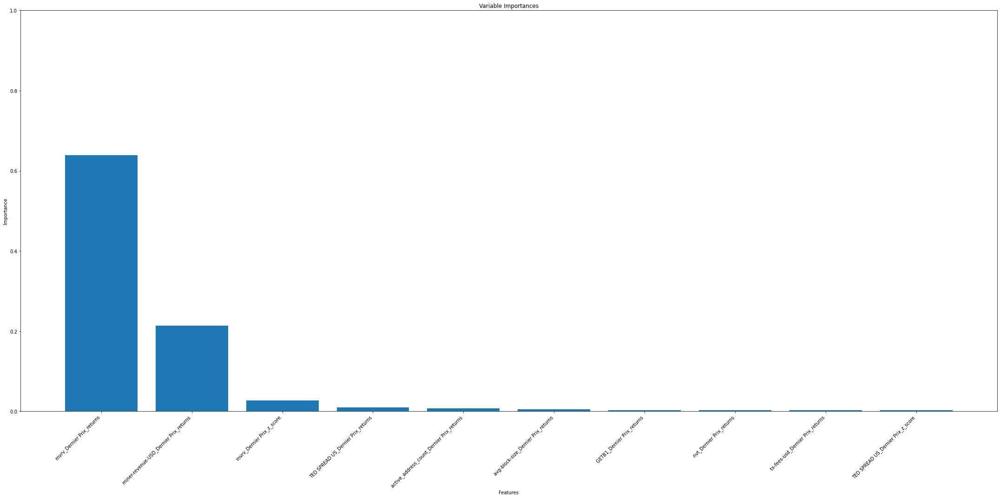

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.000934   3
1     miner-revenue-USD_Dernier Prix_returns  0.037098   1
2                  mvrv_Dernier Prix_z_score  0.117315   1
3         TED SPREAD US_Dernier Prix_returns  0.410483   4
4  active_address_count_Dernier Prix_returns  0.005198   5
5        avg-block-size_Dernier Prix_returns  0.002400   4
6                 GETB1_Dernier Prix_returns  0.706502   1
7                   nvt_Dernier Prix_returns  0.541316   2
8           tx-fees-usd_Dernier Prix_returns  0.000011   2
9         TED SPREAD US_Dernier Prix_z_score  0.303872   5
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.5980
1     miner-revenue-USD_Dernier Prix_returns      0.2449
2                  mvrv_Dernier Prix_z_score      0.0313
3         TED SPREAD US_Dernier Prix_returns      0.0095
4           tx-fees-usd_Dernier Prix_returns      0.0081
5  active

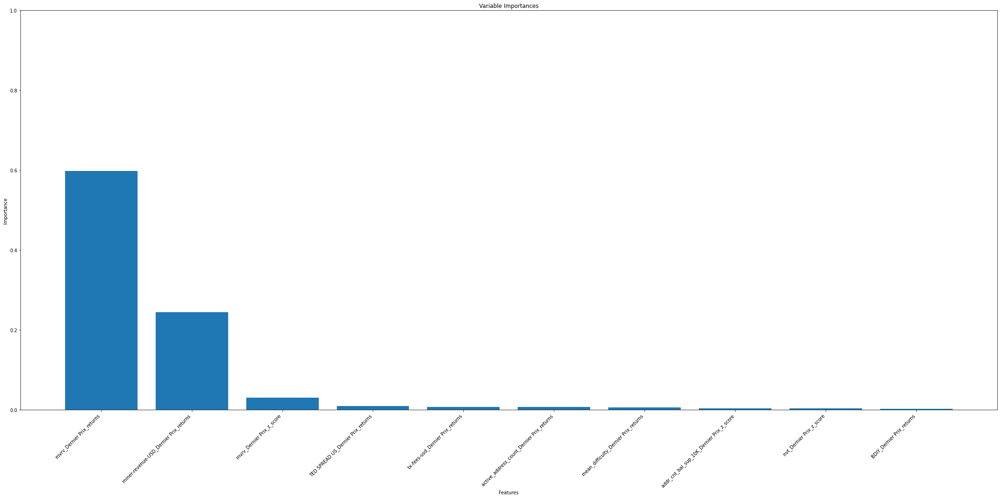

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.001392   3
1     miner-revenue-USD_Dernier Prix_returns  0.036195   1
2                  mvrv_Dernier Prix_z_score  0.163502   1
3         TED SPREAD US_Dernier Prix_returns  0.394625   4
4           tx-fees-usd_Dernier Prix_returns  0.000015   2
5  active_address_count_Dernier Prix_returns  0.007964   5
6       mean_difficulty_Dernier Prix_returns  0.103553   2
7  addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.019399   5
8                   nvt_Dernier Prix_z_score  0.073811   2
9                  BDIY_Dernier Prix_returns  0.636674   1
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.5935
1     miner-revenue-USD_Dernier Prix_returns      0.2336
2                  mvrv_Dernier Prix_z_score      0.0485
3           tx-fees-usd_Dernier Prix_returns      0.0085
4         TED SPREAD US_Dernier Prix_returns      0.0069
5  active

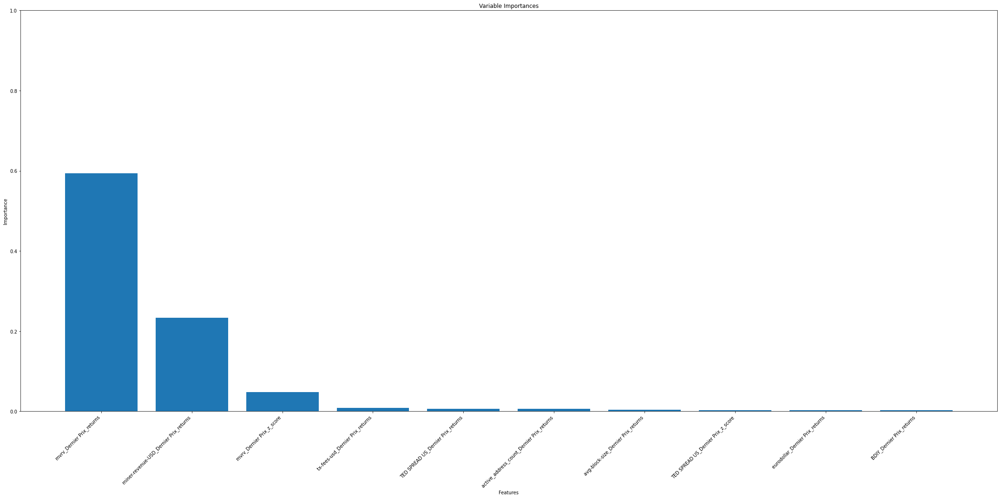

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.002221   3
1     miner-revenue-USD_Dernier Prix_returns  0.030192   1
2                  mvrv_Dernier Prix_z_score  0.148749   1
3           tx-fees-usd_Dernier Prix_returns  0.000042   2
4         TED SPREAD US_Dernier Prix_returns  0.377209   4
5  active_address_count_Dernier Prix_returns  0.007600   5
6        avg-block-size_Dernier Prix_returns  0.005393   4
7         TED SPREAD US_Dernier Prix_z_score  0.297947   5
8            eurodollar_Dernier Prix_returns  0.045883   3
9                  BDIY_Dernier Prix_returns  0.540498   1
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.6282
1     miner-revenue-USD_Dernier Prix_returns      0.2163
2                  mvrv_Dernier Prix_z_score      0.0312
3         TED SPREAD US_Dernier Prix_returns      0.0125
4           tx-fees-usd_Dernier Prix_returns      0.0083
5  active

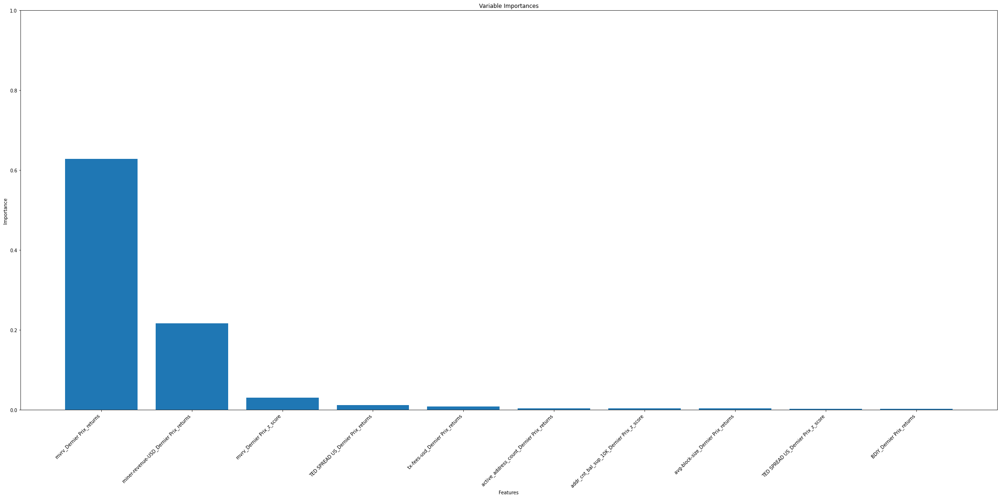

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.001928   3
1     miner-revenue-USD_Dernier Prix_returns  0.019312   3
2                  mvrv_Dernier Prix_z_score  0.156217   3
3         TED SPREAD US_Dernier Prix_returns  0.471657   3
4           tx-fees-usd_Dernier Prix_returns  0.000061   2
5  active_address_count_Dernier Prix_returns  0.012295   5
6  addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.206530   5
7        avg-block-size_Dernier Prix_returns  0.049582   4
8         TED SPREAD US_Dernier Prix_z_score  0.555063   5
9                  BDIY_Dernier Prix_returns  0.398766   1
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.6737
1     miner-revenue-USD_Dernier Prix_returns      0.1581
2                  mvrv_Dernier Prix_z_score      0.0503
3         TED SPREAD US_Dernier Prix_returns      0.0109
4         TED SPREAD US_Dernier Prix_z_score      0.0078
5  active

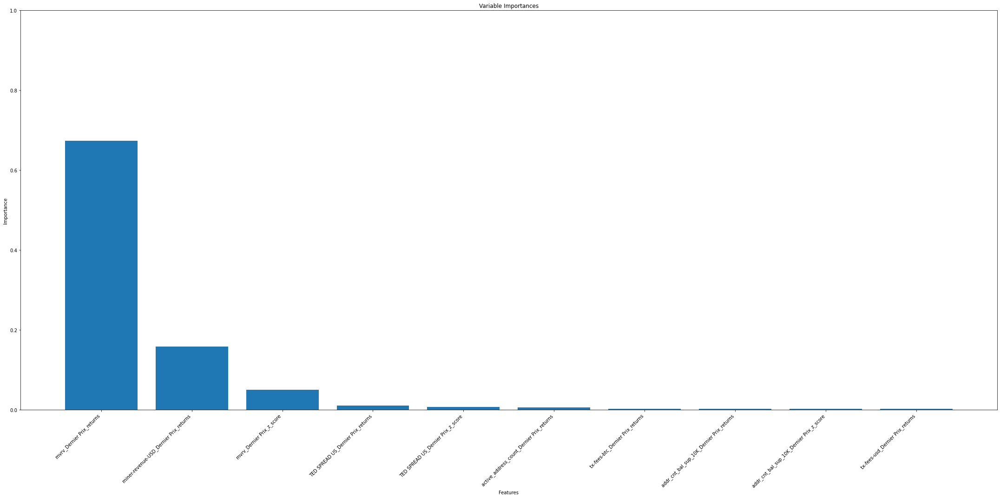

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.003549   3
1     miner-revenue-USD_Dernier Prix_returns  0.012449   1
2                  mvrv_Dernier Prix_z_score  0.171557   1
3         TED SPREAD US_Dernier Prix_returns  0.463039   3
4         TED SPREAD US_Dernier Prix_z_score  0.571518   5
5  active_address_count_Dernier Prix_returns  0.005611   5
6           tx-fees-btc_Dernier Prix_returns  0.013728   2
7  addr_cnt_bal_sup_10K_Dernier Prix_returns  0.070355   2
8  addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.095523   5
9           tx-fees-usd_Dernier Prix_returns  0.000400   2
                                          Feature  Importance
0                       mvrv_Dernier Prix_returns      0.6550
1          miner-revenue-USD_Dernier Prix_returns      0.1795
2                       mvrv_Dernier Prix_z_score      0.0465
3              TED SPREAD US_Dernier Prix_z_score      0.0061
4                tx-fees-usd_Dernier Prix

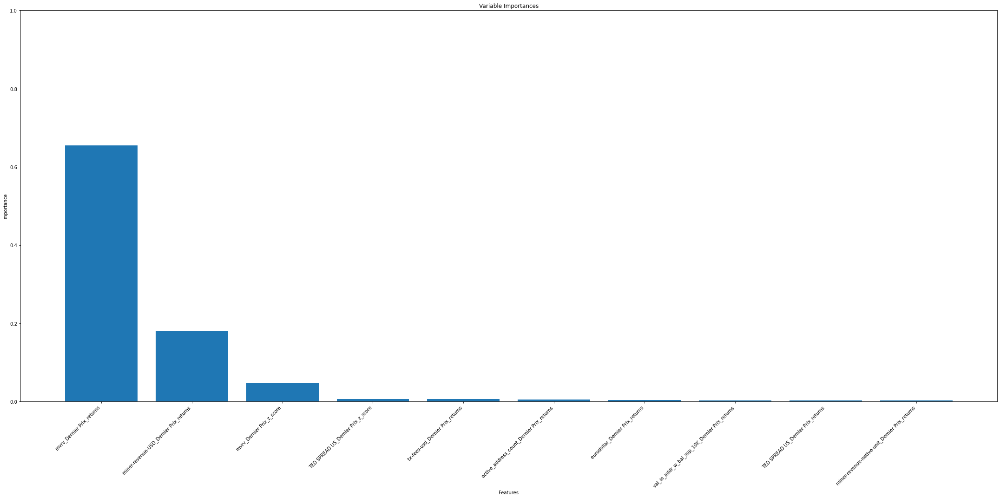

                                          Feature   p_value lag
0                       mvrv_Dernier Prix_returns  0.002889   3
1          miner-revenue-USD_Dernier Prix_returns  0.011132   3
2                       mvrv_Dernier Prix_z_score  0.176302   3
3              TED SPREAD US_Dernier Prix_z_score  0.555367   5
4                tx-fees-usd_Dernier Prix_returns  0.000465   2
5       active_address_count_Dernier Prix_returns  0.011680   5
6                 eurodollar_Dernier Prix_returns  0.073705   3
7  val_in_addr_w_bal_sup_10K_Dernier Prix_returns  0.008934   2
8              TED SPREAD US_Dernier Prix_returns  0.483103   4
9  miner-revenue-native-unit_Dernier Prix_returns  0.022185   2
                                          Feature  Importance
0                       mvrv_Dernier Prix_returns      0.6635
1          miner-revenue-USD_Dernier Prix_returns      0.1449
2                       mvrv_Dernier Prix_z_score      0.0711
3              TED SPREAD US_Dernier Prix_z_scor

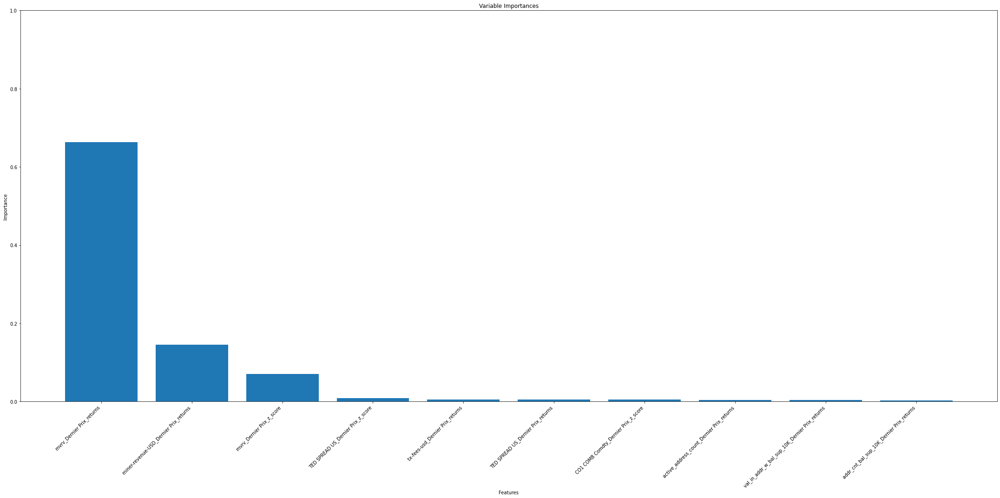

                                          Feature   p_value lag
0                       mvrv_Dernier Prix_returns  0.002522   3
1          miner-revenue-USD_Dernier Prix_returns  0.008632   3
2                       mvrv_Dernier Prix_z_score  0.183539   3
3              TED SPREAD US_Dernier Prix_z_score  0.560173   5
4                tx-fees-usd_Dernier Prix_returns  0.000722   2
5              TED SPREAD US_Dernier Prix_returns  0.537976   4
6            CO1 COMB Comdty_Dernier Prix_z_score  0.547170   1
7       active_address_count_Dernier Prix_returns  0.015365   5
8  val_in_addr_w_bal_sup_10K_Dernier Prix_returns  0.007590   2
9       addr_cnt_bal_sup_10K_Dernier Prix_returns  0.040252   2
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.6769
1     miner-revenue-USD_Dernier Prix_returns      0.1621
2                  mvrv_Dernier Prix_z_score      0.0436
3         TED SPREAD US_Dernier Prix_z_score      0.0096
4         T

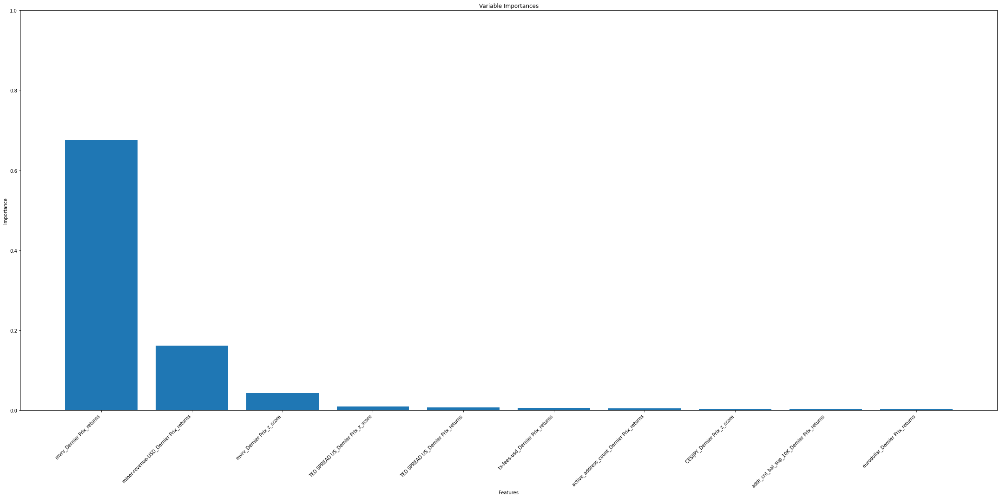

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.002232   3
1     miner-revenue-USD_Dernier Prix_returns  0.009376   3
2                  mvrv_Dernier Prix_z_score  0.172701   3
3         TED SPREAD US_Dernier Prix_z_score  0.564003   5
4         TED SPREAD US_Dernier Prix_returns  0.529079   4
5           tx-fees-usd_Dernier Prix_returns  0.001429   2
6  active_address_count_Dernier Prix_returns  0.009193   5
7               CESIJPY_Dernier Prix_z_score  0.540849   5
8  addr_cnt_bal_sup_10K_Dernier Prix_returns  0.031926   2
9            eurodollar_Dernier Prix_returns  0.104693   3
                                          Feature  Importance
0                       mvrv_Dernier Prix_returns      0.6365
1          miner-revenue-USD_Dernier Prix_returns      0.1804
2                       mvrv_Dernier Prix_z_score      0.0734
3       active_address_count_Dernier Prix_returns      0.0070
4              TED SPREAD US_Dernier Prix

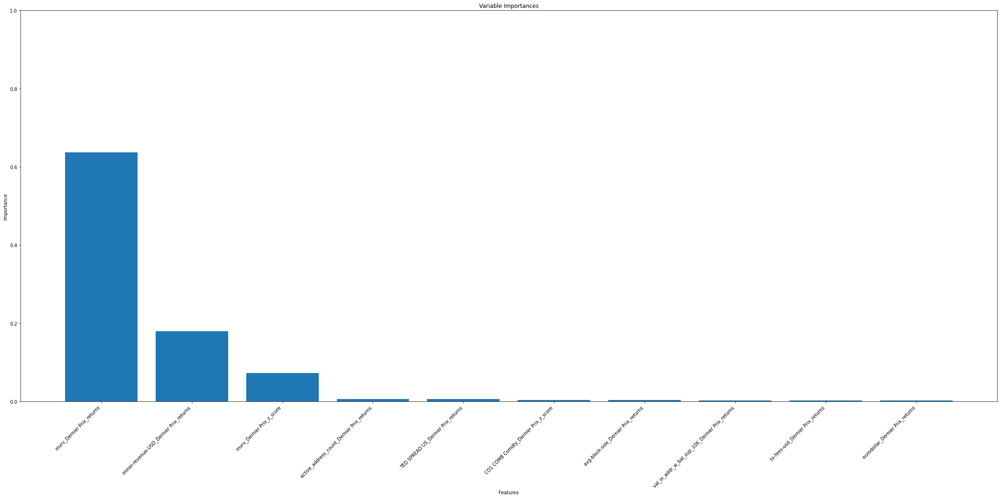

                                          Feature   p_value lag
0                       mvrv_Dernier Prix_returns  0.002551   3
1          miner-revenue-USD_Dernier Prix_returns  0.014138   3
2                       mvrv_Dernier Prix_z_score  0.195897   3
3       active_address_count_Dernier Prix_returns  0.005933   5
4              TED SPREAD US_Dernier Prix_returns  0.535289   4
5            CO1 COMB Comdty_Dernier Prix_z_score  0.250324   1
6             avg-block-size_Dernier Prix_returns  0.009393   4
7  val_in_addr_w_bal_sup_10K_Dernier Prix_returns  0.007982   2
8                tx-fees-usd_Dernier Prix_returns  0.001581   2
9                 eurodollar_Dernier Prix_returns  0.084932   3
                                          Feature  Importance
0                       mvrv_Dernier Prix_returns      0.6284
1                       mvrv_Dernier Prix_z_score      0.1294
2          miner-revenue-USD_Dernier Prix_returns      0.1283
3       active_address_count_Dernier Prix_return

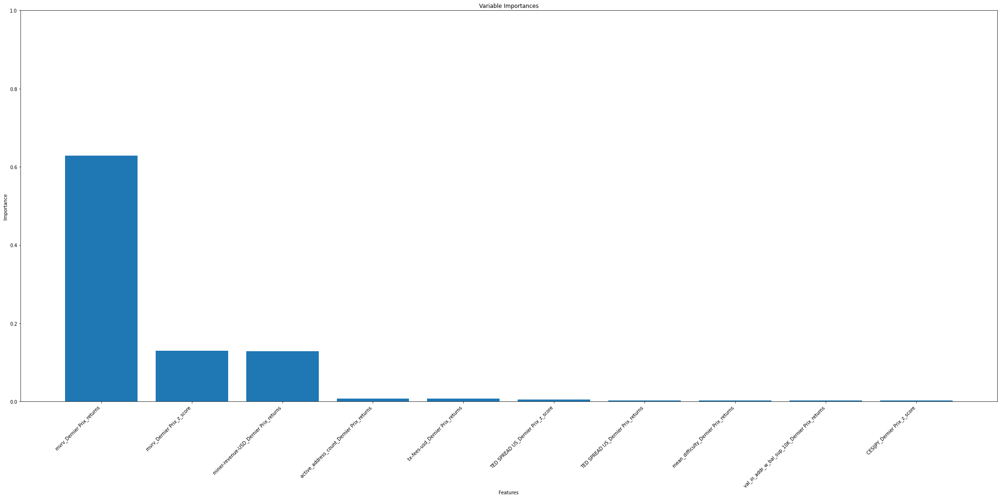

                                          Feature   p_value lag
0                       mvrv_Dernier Prix_returns  0.002481   3
1                       mvrv_Dernier Prix_z_score  0.178139   3
2          miner-revenue-USD_Dernier Prix_returns  0.018562   3
3       active_address_count_Dernier Prix_returns  0.010477   5
4                tx-fees-usd_Dernier Prix_returns  0.001967   2
5              TED SPREAD US_Dernier Prix_z_score  0.546931   5
6              TED SPREAD US_Dernier Prix_returns  0.529310   4
7            mean_difficulty_Dernier Prix_returns  0.018923   2
8  val_in_addr_w_bal_sup_10K_Dernier Prix_returns  0.009010   2
9                    CESIJPY_Dernier Prix_z_score  0.553863   5
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.5893
1                  mvrv_Dernier Prix_z_score      0.1676
2     miner-revenue-USD_Dernier Prix_returns      0.1275
3         TED SPREAD US_Dernier Prix_z_score      0.0080
4          

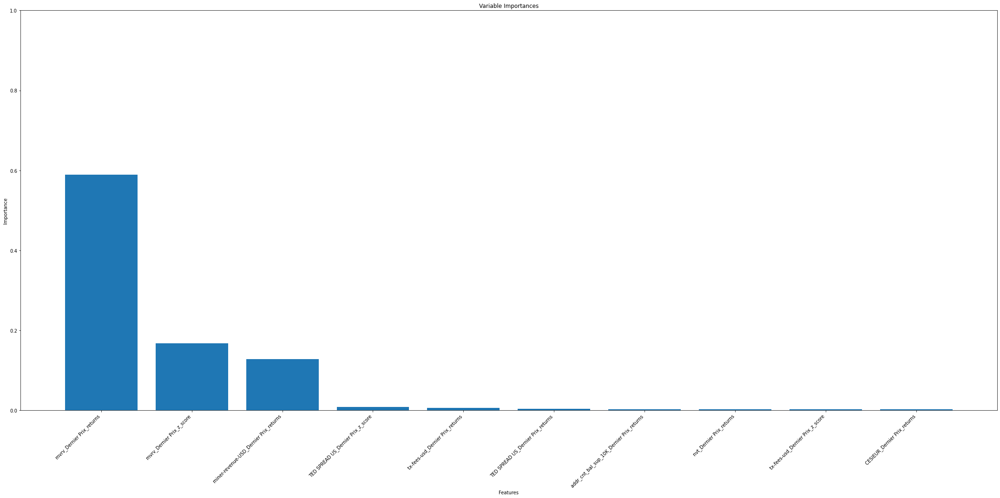

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.001328   3
1                  mvrv_Dernier Prix_z_score  0.214157   3
2     miner-revenue-USD_Dernier Prix_returns  0.006704   3
3         TED SPREAD US_Dernier Prix_z_score  0.385047   5
4           tx-fees-usd_Dernier Prix_returns  0.000715   2
5         TED SPREAD US_Dernier Prix_returns  0.442118   4
6  addr_cnt_bal_sup_10K_Dernier Prix_returns  0.045170   2
7                   nvt_Dernier Prix_returns  0.648400   3
8           tx-fees-usd_Dernier Prix_z_score  0.275653   2
9               CESIEUR_Dernier Prix_returns  0.069775   4
                                          Feature  Importance
0                       mvrv_Dernier Prix_returns      0.5565
1                       mvrv_Dernier Prix_z_score      0.2094
2          miner-revenue-USD_Dernier Prix_returns      0.1226
3              TED SPREAD US_Dernier Prix_z_score      0.0070
4       active_address_count_Dernier Prix

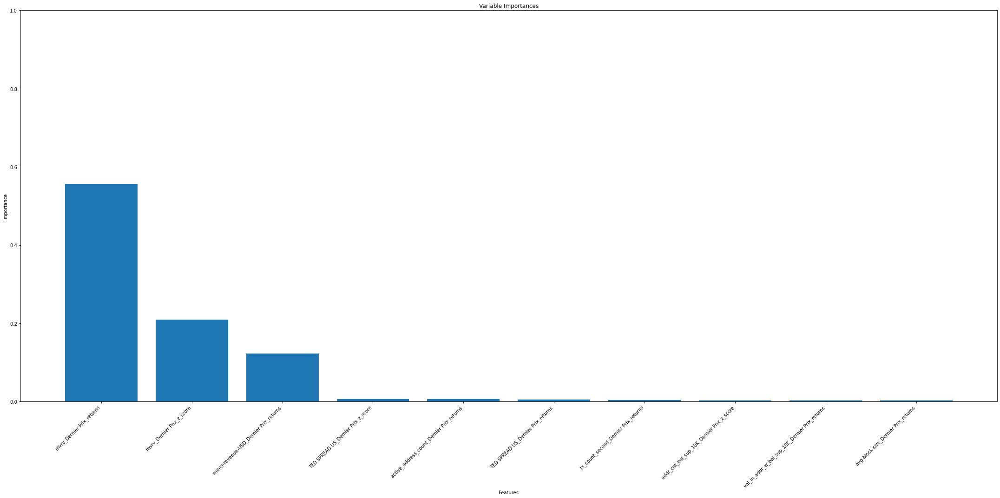

                                          Feature   p_value lag
0                       mvrv_Dernier Prix_returns  0.001733   3
1                       mvrv_Dernier Prix_z_score  0.254163   3
2          miner-revenue-USD_Dernier Prix_returns  0.006648   3
3              TED SPREAD US_Dernier Prix_z_score  0.360834   5
4       active_address_count_Dernier Prix_returns  0.005115   5
5              TED SPREAD US_Dernier Prix_returns  0.386588   5
6            tx_count_second_Dernier Prix_returns  0.018164   2
7       addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.128450   5
8  val_in_addr_w_bal_sup_10K_Dernier Prix_returns  0.013755   2
9             avg-block-size_Dernier Prix_returns  0.003905   4
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.6837
1     miner-revenue-USD_Dernier Prix_returns      0.1084
2                  mvrv_Dernier Prix_z_score      0.0874
3           tx-fees-usd_Dernier Prix_returns      0.0070
4        av

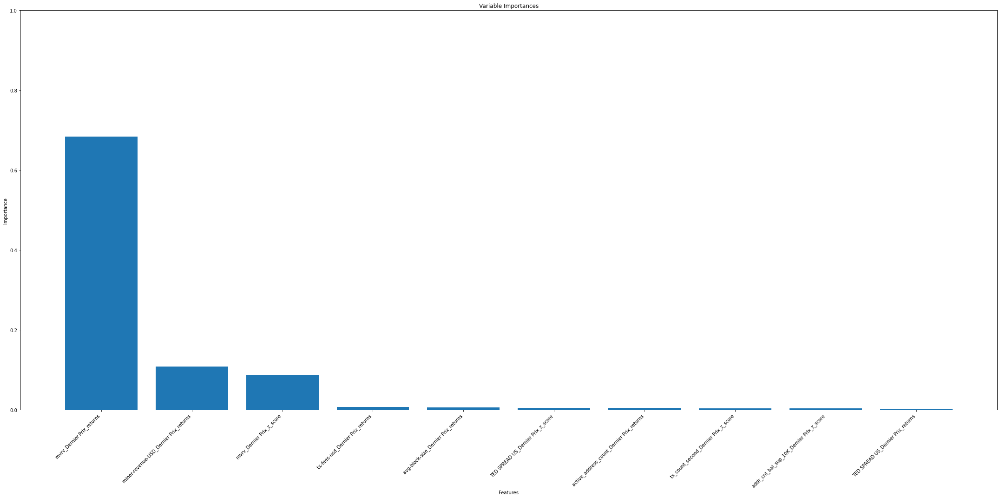

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.002116   3
1     miner-revenue-USD_Dernier Prix_returns  0.008208   3
2                  mvrv_Dernier Prix_z_score  0.226742   3
3           tx-fees-usd_Dernier Prix_returns  0.002538   2
4        avg-block-size_Dernier Prix_returns  0.014284   4
5         TED SPREAD US_Dernier Prix_z_score  0.367595   5
6  active_address_count_Dernier Prix_returns  0.005234   5
7       tx_count_second_Dernier Prix_z_score  0.221029   2
8  addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.208865   3
9         TED SPREAD US_Dernier Prix_returns  0.420823   5
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.6017
1                  mvrv_Dernier Prix_z_score      0.1496
2     miner-revenue-USD_Dernier Prix_returns      0.1261
3         TED SPREAD US_Dernier Prix_z_score      0.0064
4  active_address_count_Dernier Prix_returns      0.0063
5        

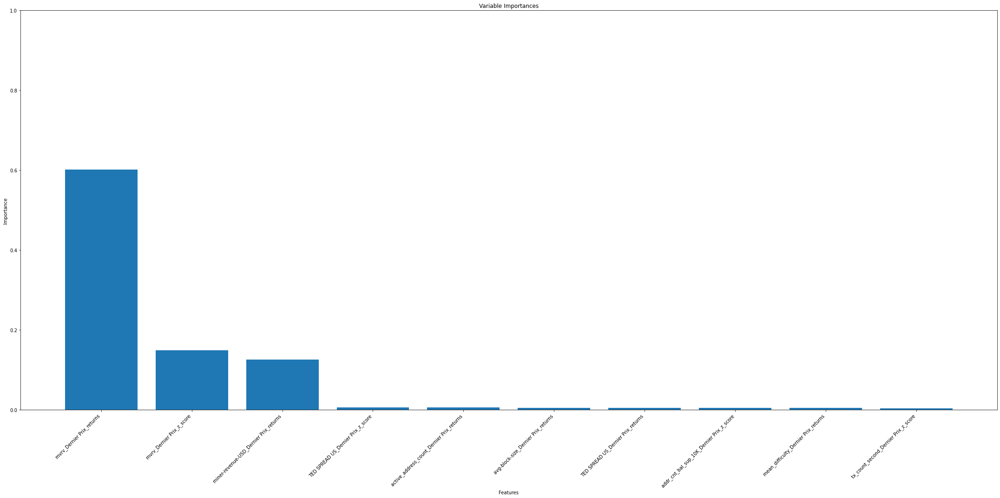

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.001159   3
1                  mvrv_Dernier Prix_z_score  0.178857   3
2     miner-revenue-USD_Dernier Prix_returns  0.005063   3
3         TED SPREAD US_Dernier Prix_z_score  0.453498   5
4  active_address_count_Dernier Prix_returns  0.004056   5
5        avg-block-size_Dernier Prix_returns  0.009337   4
6         TED SPREAD US_Dernier Prix_returns  0.502434   5
7  addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.288859   5
8       mean_difficulty_Dernier Prix_returns  0.013370   2
9       tx_count_second_Dernier Prix_z_score  0.142356   4
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.6647
1     miner-revenue-USD_Dernier Prix_returns      0.1209
2                  mvrv_Dernier Prix_z_score      0.1009
3         TED SPREAD US_Dernier Prix_z_score      0.0066
4  active_address_count_Dernier Prix_returns      0.0047
5       m

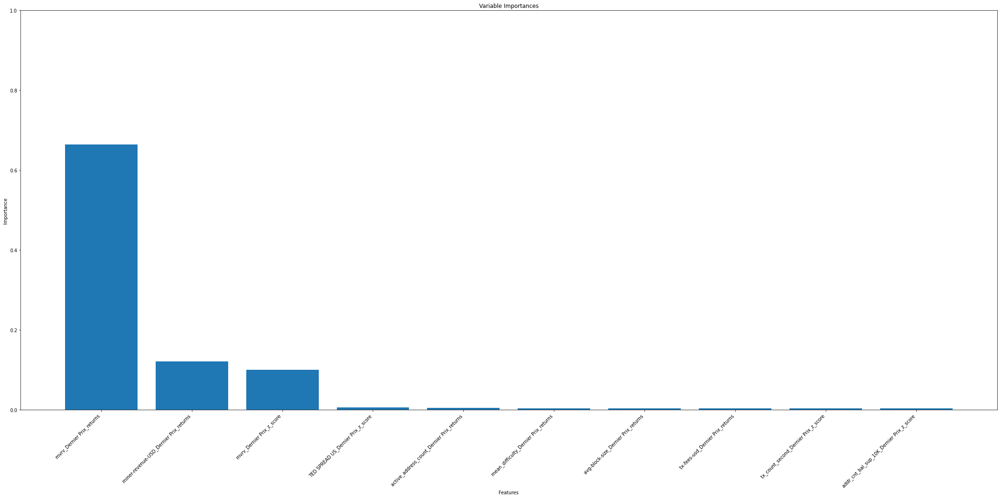

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.002455   3
1     miner-revenue-USD_Dernier Prix_returns  0.043316   1
2                  mvrv_Dernier Prix_z_score  0.171349   3
3         TED SPREAD US_Dernier Prix_z_score  0.475042   5
4  active_address_count_Dernier Prix_returns  0.009360   5
5       mean_difficulty_Dernier Prix_returns  0.016586   2
6        avg-block-size_Dernier Prix_returns  0.017257   4
7           tx-fees-usd_Dernier Prix_returns  0.003713   2
8       tx_count_second_Dernier Prix_z_score  0.195503   2
9  addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.238893   5
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.7007
1                  mvrv_Dernier Prix_z_score      0.0879
2     miner-revenue-USD_Dernier Prix_returns      0.0873
3         TED SPREAD US_Dernier Prix_z_score      0.0074
4           tx-fees-usd_Dernier Prix_returns      0.0061
5        

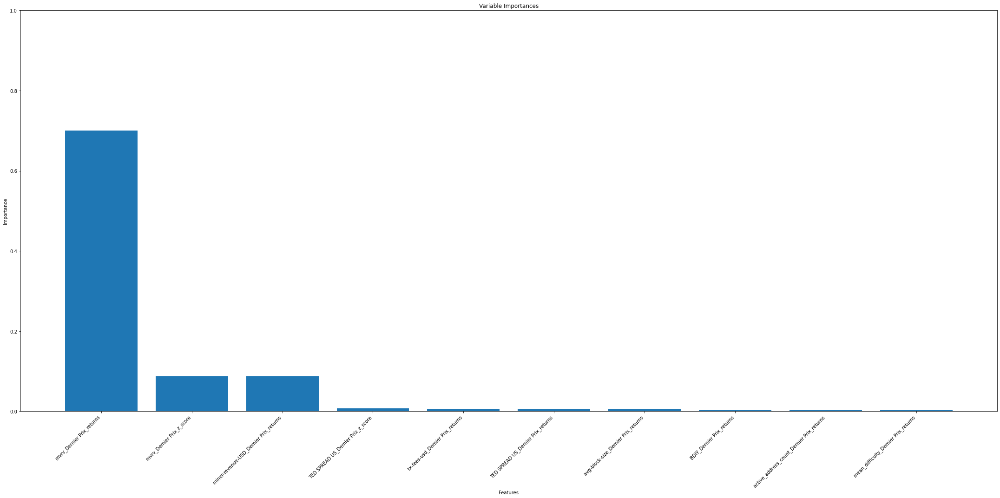

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.017951   3
1                  mvrv_Dernier Prix_z_score  0.237138   3
2     miner-revenue-USD_Dernier Prix_returns  0.005029   3
3         TED SPREAD US_Dernier Prix_z_score  0.336522   5
4           tx-fees-usd_Dernier Prix_returns  0.006187   2
5         TED SPREAD US_Dernier Prix_returns  0.333802   1
6        avg-block-size_Dernier Prix_returns  0.009755   4
7                  BDIY_Dernier Prix_returns  0.083210   1
8  active_address_count_Dernier Prix_returns  0.002653   5
9       mean_difficulty_Dernier Prix_returns  0.058084   2
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.7001
1  miner-revenue-USD_Dernier Prix_returns      0.1078
2               mvrv_Dernier Prix_z_score      0.0742
3      TED SPREAD US_Dernier Prix_z_score      0.0097
4     avg-block-size_Dernier Prix_returns      0.0087
5      TED SPREAD US_Dernie

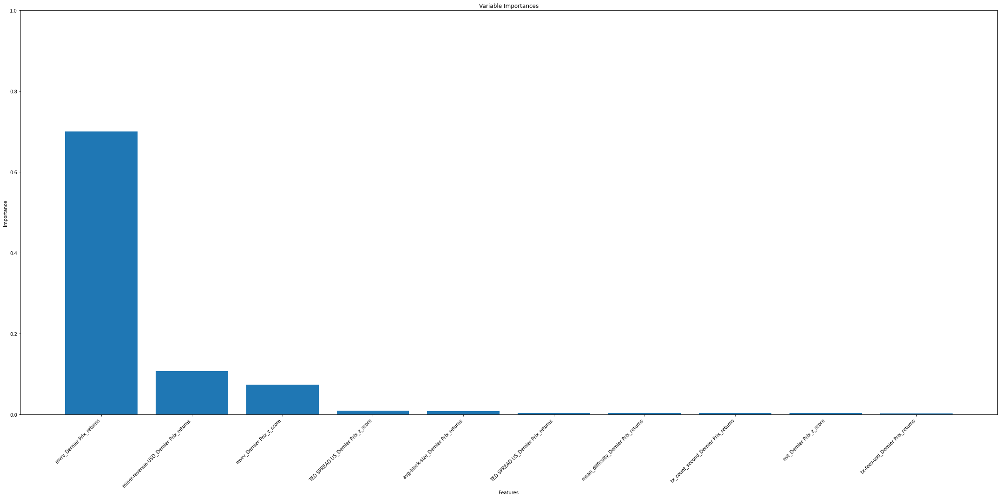

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.033519   3
1  miner-revenue-USD_Dernier Prix_returns  0.002861   3
2               mvrv_Dernier Prix_z_score  0.224292   3
3      TED SPREAD US_Dernier Prix_z_score  0.413763   1
4     avg-block-size_Dernier Prix_returns  0.012006   4
5      TED SPREAD US_Dernier Prix_returns  0.305194   1
6    mean_difficulty_Dernier Prix_returns  0.059838   2
7    tx_count_second_Dernier Prix_returns  0.029914   2
8                nvt_Dernier Prix_z_score  0.279647   2
9        tx-fees-usd_Dernier Prix_returns  0.011406   2
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.6695
1     miner-revenue-USD_Dernier Prix_returns      0.1248
2                  mvrv_Dernier Prix_z_score      0.0833
3         TED SPREAD US_Dernier Prix_returns      0.0101
4  addr_cnt_bal_sup_10K_Dernier Prix_z_score      0.0057
5       tx_count_second_Dernier Prix_z_sco

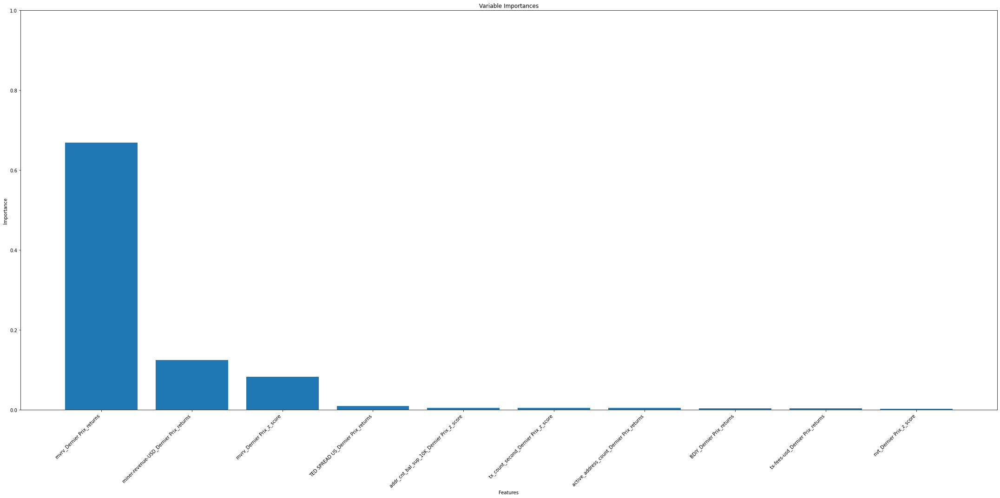

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.046396   1
1     miner-revenue-USD_Dernier Prix_returns  0.001459   3
2                  mvrv_Dernier Prix_z_score  0.272286   3
3         TED SPREAD US_Dernier Prix_returns  0.329267   5
4  addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.354556   5
5       tx_count_second_Dernier Prix_z_score  0.135286   2
6  active_address_count_Dernier Prix_returns  0.007608   5
7                  BDIY_Dernier Prix_returns  0.045242   1
8           tx-fees-usd_Dernier Prix_returns  0.005462   2
9                   nvt_Dernier Prix_z_score  0.291833   2
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.8046
1     miner-revenue-USD_Dernier Prix_returns      0.0733
2         TED SPREAD US_Dernier Prix_z_score      0.0095
3        avg-block-size_Dernier Prix_returns      0.0077
4                 GETB1_Dernier Prix_returns      0.0066
5        

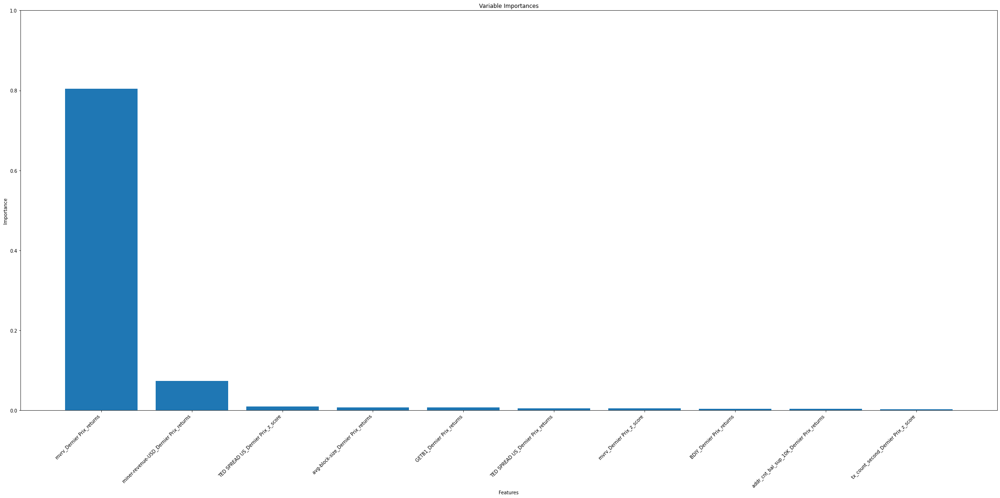

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.019589   1
1     miner-revenue-USD_Dernier Prix_returns  0.004752   3
2         TED SPREAD US_Dernier Prix_z_score  0.574947   5
3        avg-block-size_Dernier Prix_returns  0.069256   4
4                 GETB1_Dernier Prix_returns  0.484114   3
5         TED SPREAD US_Dernier Prix_returns  0.435795   5
6                  mvrv_Dernier Prix_z_score  0.311262   3
7                  BDIY_Dernier Prix_returns  0.064879   1
8  addr_cnt_bal_sup_10K_Dernier Prix_returns  0.327631   2
9       tx_count_second_Dernier Prix_z_score  0.097306   2
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.7824
1     miner-revenue-USD_Dernier Prix_returns      0.1052
2                  mvrv_Dernier Prix_z_score      0.0151
3        avg-block-size_Dernier Prix_returns      0.0063
4                   nvt_Dernier Prix_z_score      0.0052
5        

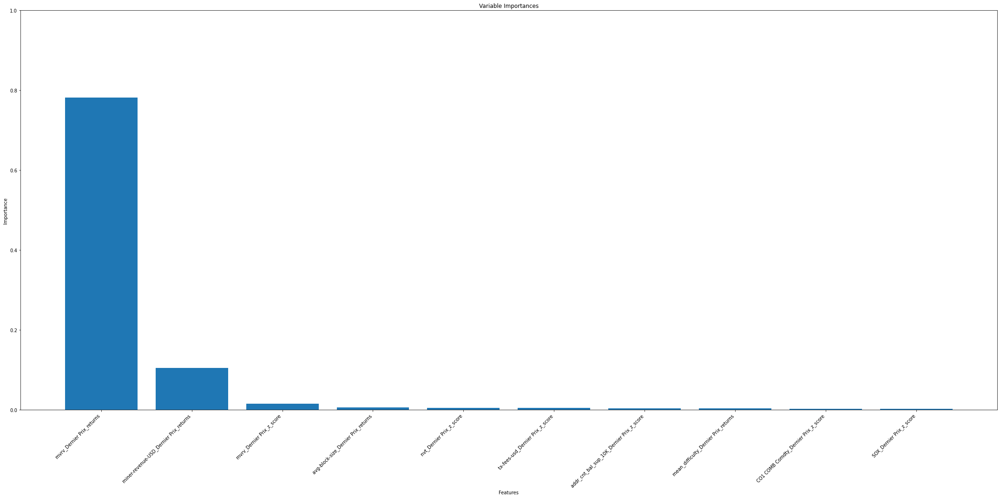

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.026877   1
1     miner-revenue-USD_Dernier Prix_returns  0.004901   3
2                  mvrv_Dernier Prix_z_score  0.358791   3
3        avg-block-size_Dernier Prix_returns  0.090633   4
4                   nvt_Dernier Prix_z_score  0.618073   2
5           tx-fees-usd_Dernier Prix_z_score  0.392755   2
6  addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.204534   5
7       mean_difficulty_Dernier Prix_returns  0.000273   2
8       CO1 COMB Comdty_Dernier Prix_z_score  0.122219   1
9                   SOX_Dernier Prix_z_score  0.245251   1
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.8148
1  miner-revenue-USD_Dernier Prix_returns      0.0722
2     avg-block-size_Dernier Prix_returns      0.0066
3      TED SPREAD US_Dernier Prix_returns      0.0053
4      TED SPREAD US_Dernier Prix_z_score      0.0045
5               mvrv_Dernie

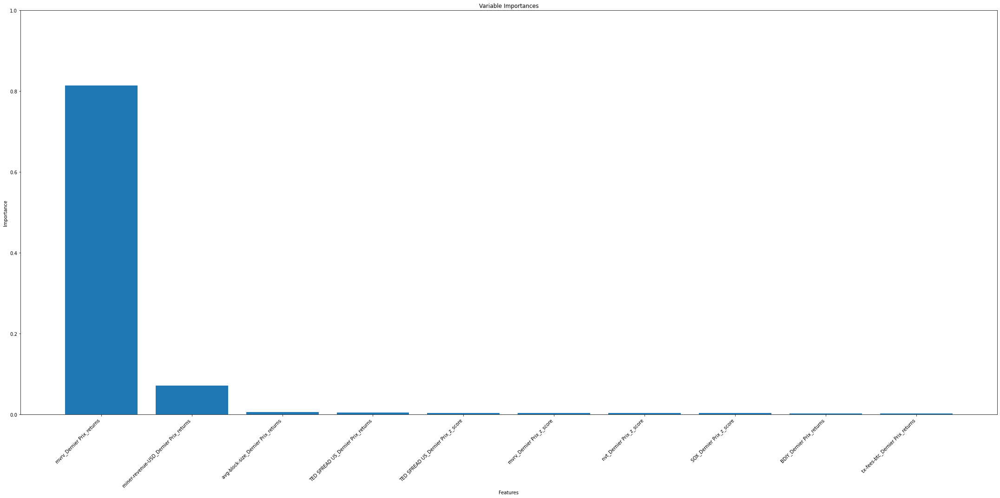

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.021380   1
1  miner-revenue-USD_Dernier Prix_returns  0.133481   1
2     avg-block-size_Dernier Prix_returns  0.118277   4
3      TED SPREAD US_Dernier Prix_returns  0.530632   5
4      TED SPREAD US_Dernier Prix_z_score  0.608276   1
5               mvrv_Dernier Prix_z_score  0.332416   3
6                nvt_Dernier Prix_z_score  0.359287   2
7                SOX_Dernier Prix_z_score  0.278766   1
8               BDIY_Dernier Prix_returns  0.102694   1
9        tx-fees-btc_Dernier Prix_returns  0.072965   2
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.8170
1  miner-revenue-USD_Dernier Prix_returns      0.0899
2      TED SPREAD US_Dernier Prix_returns      0.0054
3    tx_count_second_Dernier Prix_z_score      0.0046
4               BDIY_Dernier Prix_returns      0.0044
5    mean_difficulty_Dernier Prix_returns      0.0043
6     

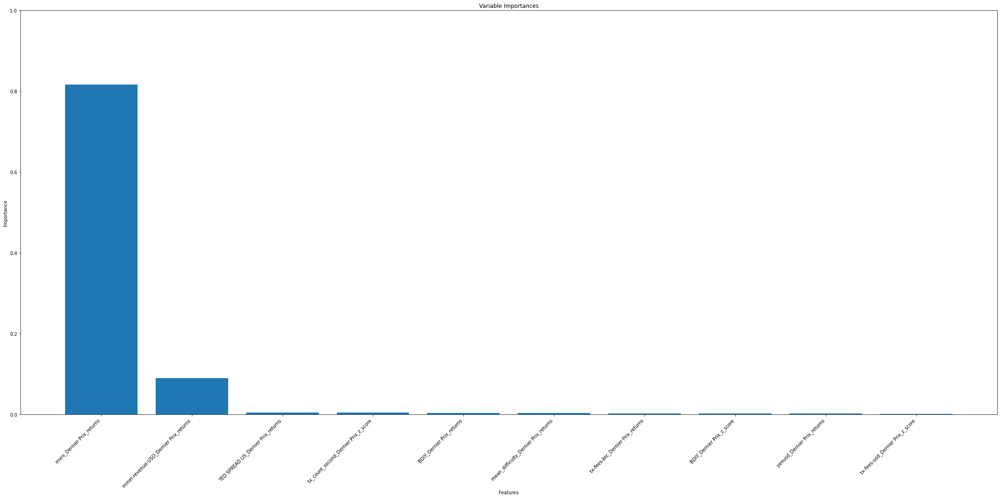

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.000842   5
1  miner-revenue-USD_Dernier Prix_returns  0.095892   2
2      TED SPREAD US_Dernier Prix_returns  0.404704   5
3    tx_count_second_Dernier Prix_z_score  0.156243   2
4               BDIY_Dernier Prix_returns  0.079984   1
5    mean_difficulty_Dernier Prix_returns  0.000231   2
6        tx-fees-btc_Dernier Prix_returns  0.090169   2
7               BDIY_Dernier Prix_z_score  0.008181   1
8             yenusd_Dernier Prix_returns  0.204684   2
9        tx-fees-usd_Dernier Prix_z_score  0.390765   2
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.8140
1  miner-revenue-USD_Dernier Prix_returns      0.0971
2               mvrv_Dernier Prix_z_score      0.0122
3     avg-block-size_Dernier Prix_returns      0.0041
4    mean_difficulty_Dernier Prix_returns      0.0035
5    tx_count_second_Dernier Prix_z_score      0.0032
6     

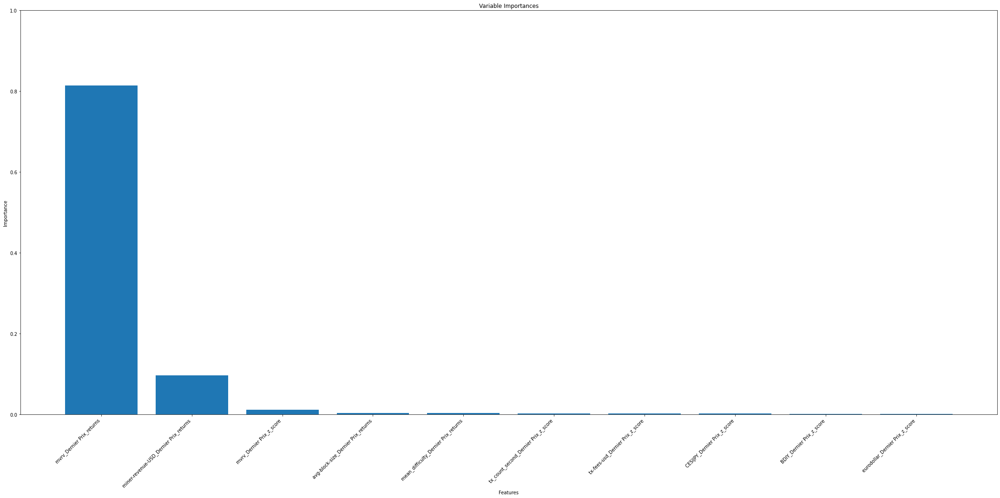

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.000118   1
1  miner-revenue-USD_Dernier Prix_returns  0.170184   3
2               mvrv_Dernier Prix_z_score  0.346681   1
3     avg-block-size_Dernier Prix_returns  0.048582   5
4    mean_difficulty_Dernier Prix_returns  0.001358   3
5    tx_count_second_Dernier Prix_z_score  0.231056   2
6        tx-fees-usd_Dernier Prix_z_score  0.347291   2
7            CESIJPY_Dernier Prix_z_score  0.564156   1
8               BDIY_Dernier Prix_z_score  0.007738   4
9         eurodollar_Dernier Prix_z_score  0.046681   3
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.9122
1     miner-revenue-USD_Dernier Prix_returns      0.0197
2  active_address_count_Dernier Prix_returns      0.0026
3                   SOX_Dernier Prix_z_score      0.0023
4                  BDIY_Dernier Prix_returns      0.0022
5              hashrate_Dernier Prix_retur

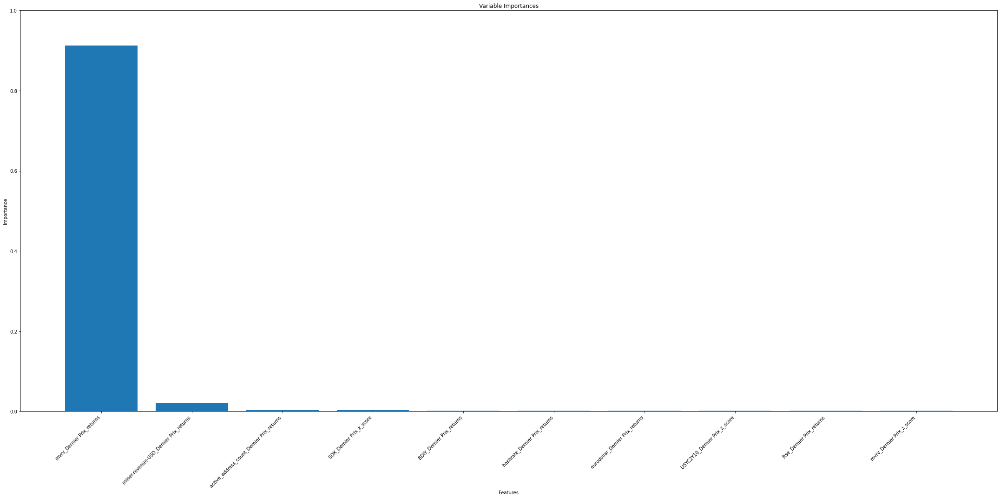

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.000580   1
1     miner-revenue-USD_Dernier Prix_returns  0.307706   3
2  active_address_count_Dernier Prix_returns  0.027987   5
3                   SOX_Dernier Prix_z_score  0.098169   2
4                  BDIY_Dernier Prix_returns  0.117484   1
5              hashrate_Dernier Prix_returns  0.354853   4
6            eurodollar_Dernier Prix_returns  0.086909   2
7              USYC2Y10_Dernier Prix_z_score  0.771230   1
8                  ftse_Dernier Prix_returns  0.121621   1
9                  mvrv_Dernier Prix_z_score  0.242641   3
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.8745
1  miner-revenue-USD_Dernier Prix_returns      0.0282
2               mvrv_Dernier Prix_z_score      0.0176
3    tx_count_second_Dernier Prix_z_score      0.0046
4     avg-block-size_Dernier Prix_returns      0.0028
5                SOX_Dernie

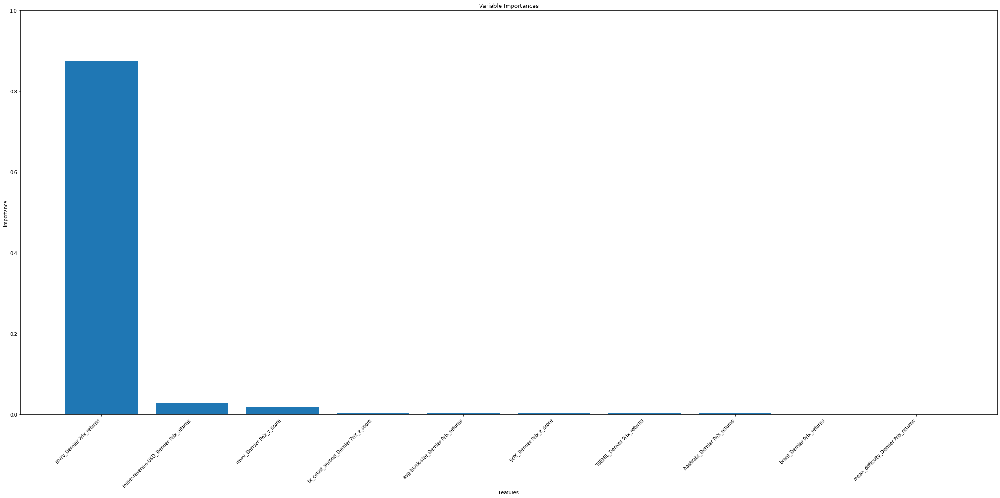

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.000006   5
1  miner-revenue-USD_Dernier Prix_returns  0.183631   3
2               mvrv_Dernier Prix_z_score  0.161794   3
3    tx_count_second_Dernier Prix_z_score  0.177718   2
4     avg-block-size_Dernier Prix_returns  0.069810   4
5                SOX_Dernier Prix_z_score  0.123829   2
6             TSEMIL_Dernier Prix_returns  0.198444   1
7           hashrate_Dernier Prix_returns  0.216273   4
8              brent_Dernier Prix_returns  0.008216   2
9    mean_difficulty_Dernier Prix_returns  0.000180   2
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.8881
1  miner-revenue-USD_Dernier Prix_returns      0.0258
2    tx_count_second_Dernier Prix_z_score      0.0061
3               mvrv_Dernier Prix_z_score      0.0049
4        tx-fees-btc_Dernier Prix_returns      0.0037
5            CESIEUR_Dernier Prix_returns      0.0029
6     

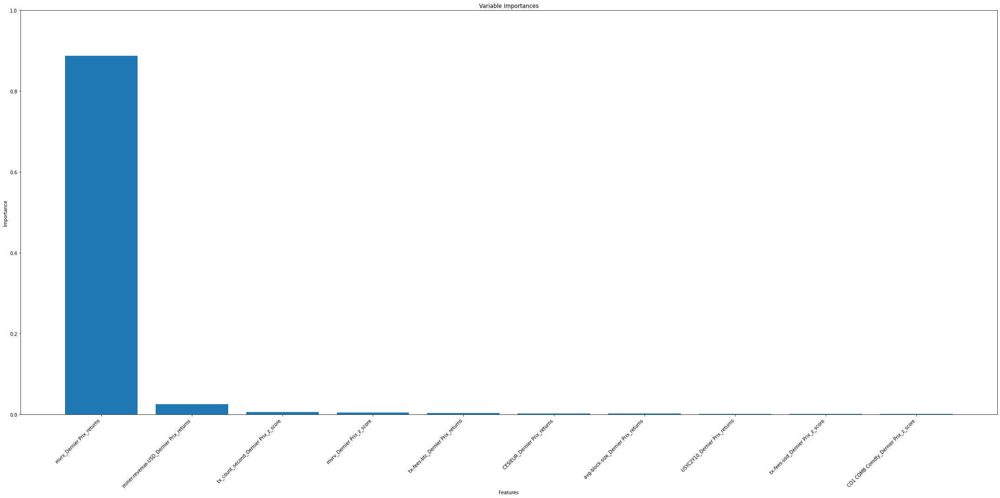

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.000035   5
1  miner-revenue-USD_Dernier Prix_returns  0.142648   3
2    tx_count_second_Dernier Prix_z_score  0.075403   2
3               mvrv_Dernier Prix_z_score  0.330859   3
4        tx-fees-btc_Dernier Prix_returns  0.328672   2
5            CESIEUR_Dernier Prix_returns  0.241703   2
6     avg-block-size_Dernier Prix_returns  0.150770   1
7           USYC2Y10_Dernier Prix_returns  0.667795   5
8        tx-fees-usd_Dernier Prix_z_score  0.303711   2
9    CO1 COMB Comdty_Dernier Prix_z_score  0.221140   1
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.8830
1  miner-revenue-USD_Dernier Prix_returns      0.0266
2           USYC2Y10_Dernier Prix_z_score      0.0043
3     avg-block-size_Dernier Prix_returns      0.0039
4    tx_count_second_Dernier Prix_z_score      0.0039
5              brent_Dernier Prix_returns      0.0037
6     

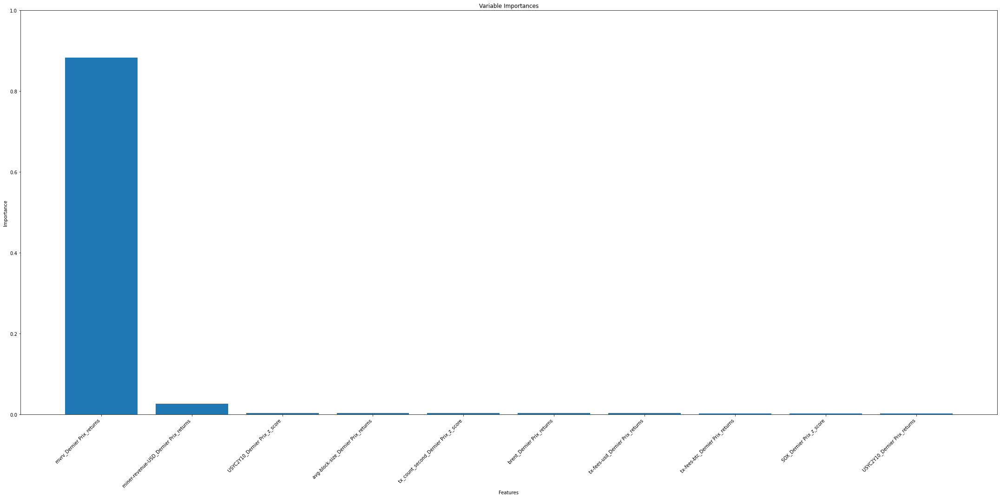

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.000057   5
1  miner-revenue-USD_Dernier Prix_returns  0.085822   3
2           USYC2Y10_Dernier Prix_z_score  0.679976   1
3     avg-block-size_Dernier Prix_returns  0.298269   1
4    tx_count_second_Dernier Prix_z_score  0.086728   2
5              brent_Dernier Prix_returns  0.036238   1
6        tx-fees-usd_Dernier Prix_returns  0.073173   2
7        tx-fees-btc_Dernier Prix_returns  0.203775   2
8                SOX_Dernier Prix_z_score  0.132661   4
9           USYC2Y10_Dernier Prix_returns  0.681065   5
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.8815
1               mvrv_Dernier Prix_z_score      0.0165
2  miner-revenue-USD_Dernier Prix_returns      0.0130
3           hashrate_Dernier Prix_returns      0.0072
4        tx-fees-btc_Dernier Prix_returns      0.0053
5        tx-fees-usd_Dernier Prix_z_score      0.0051
6    t

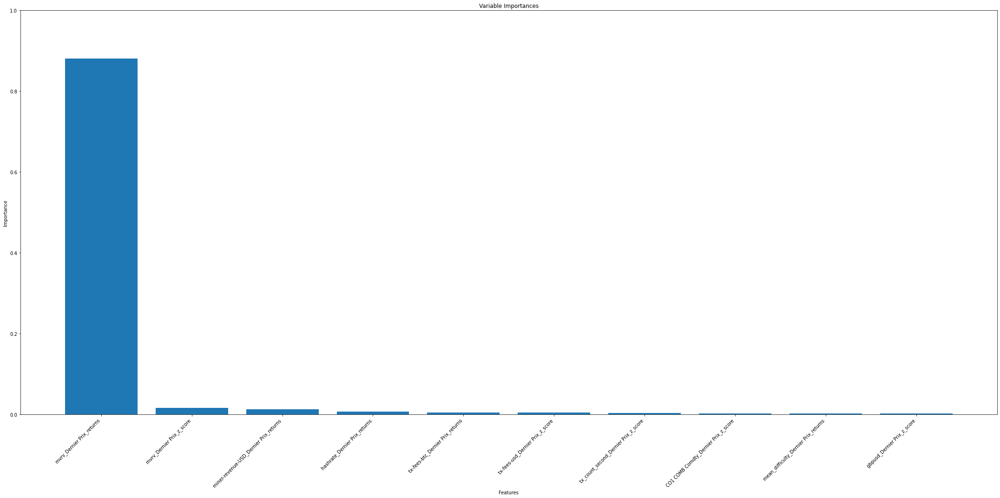

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.000105   5
1               mvrv_Dernier Prix_z_score  0.500499   4
2  miner-revenue-USD_Dernier Prix_returns  0.060427   3
3           hashrate_Dernier Prix_returns  0.060924   4
4        tx-fees-btc_Dernier Prix_returns  0.234595   2
5        tx-fees-usd_Dernier Prix_z_score  0.372132   2
6    tx_count_second_Dernier Prix_z_score  0.165253   2
7    CO1 COMB Comdty_Dernier Prix_z_score  0.127421   1
8    mean_difficulty_Dernier Prix_returns  0.000114   4
9             gbpusd_Dernier Prix_z_score  0.160538   1
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.8842
1     miner-revenue-USD_Dernier Prix_returns      0.0218
2                  mvrv_Dernier Prix_z_score      0.0055
3           tx-fees-btc_Dernier Prix_returns      0.0044
4       tx_count_second_Dernier Prix_z_score      0.0043
5              hashrate_Dernier Prix_retur

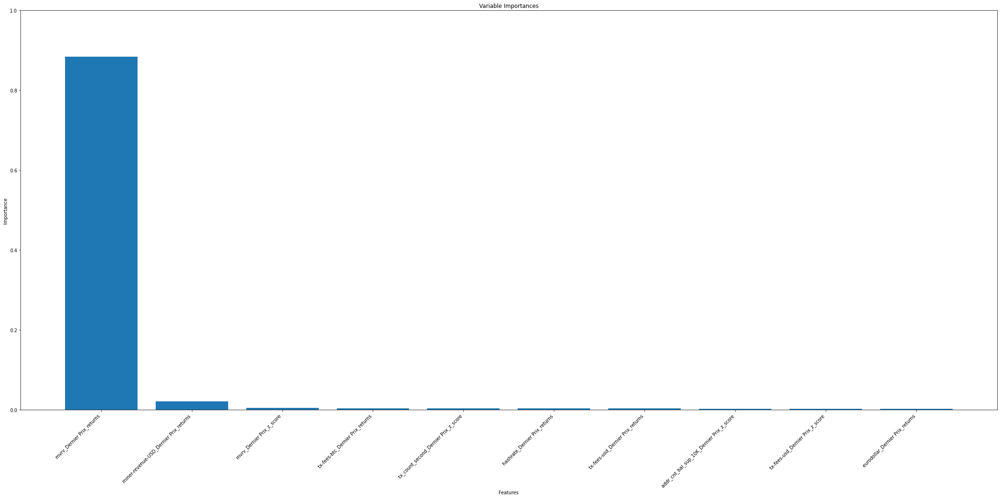

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.000164   5
1     miner-revenue-USD_Dernier Prix_returns  0.134158   2
2                  mvrv_Dernier Prix_z_score  0.316564   1
3           tx-fees-btc_Dernier Prix_returns  0.257558   2
4       tx_count_second_Dernier Prix_z_score  0.176587   2
5              hashrate_Dernier Prix_returns  0.090577   4
6           tx-fees-usd_Dernier Prix_returns  0.108825   2
7  addr_cnt_bal_sup_10K_Dernier Prix_z_score  0.632401   5
8           tx-fees-usd_Dernier Prix_z_score  0.411553   2
9            eurodollar_Dernier Prix_returns  0.271986   2
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.8794
1  miner-revenue-USD_Dernier Prix_returns      0.0300
2               mvrv_Dernier Prix_z_score      0.0063
3              brent_Dernier Prix_returns      0.0036
4        tx-fees-btc_Dernier Prix_returns      0.0033
5    CO1 COMB Comdty_Dernie

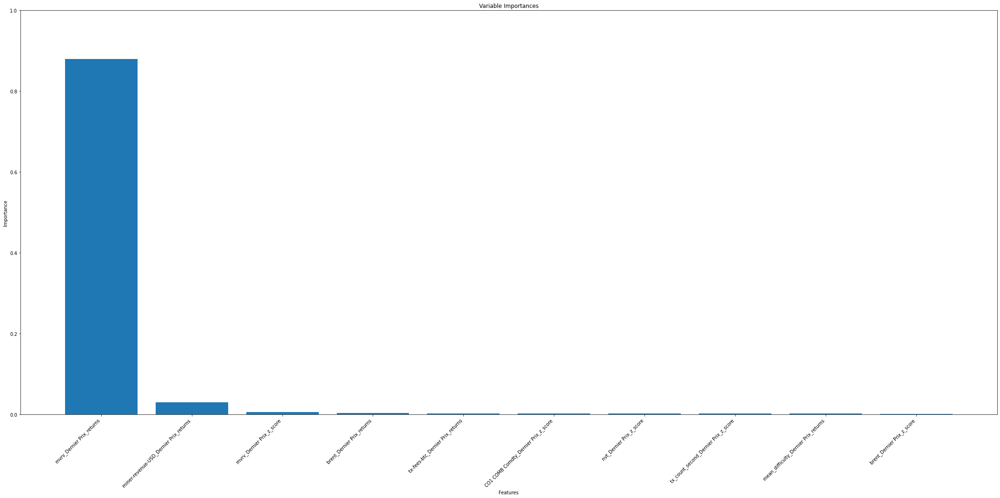

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.000724   5
1  miner-revenue-USD_Dernier Prix_returns  0.040999   3
2               mvrv_Dernier Prix_z_score  0.338367   1
3              brent_Dernier Prix_returns  0.013230   2
4        tx-fees-btc_Dernier Prix_returns  0.508040   2
5    CO1 COMB Comdty_Dernier Prix_z_score  0.272522   1
6                nvt_Dernier Prix_z_score  0.493391   5
7    tx_count_second_Dernier Prix_z_score  0.093182   2
8    mean_difficulty_Dernier Prix_returns  0.000013   4
9              brent_Dernier Prix_z_score  0.189272   1
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.8761
1     miner-revenue-USD_Dernier Prix_returns      0.0267
2                  mvrv_Dernier Prix_z_score      0.0128
3           tx-fees-btc_Dernier Prix_returns      0.0066
4       tx_count_second_Dernier Prix_z_score      0.0045
5  active_address_count_Dernier Prix_retur

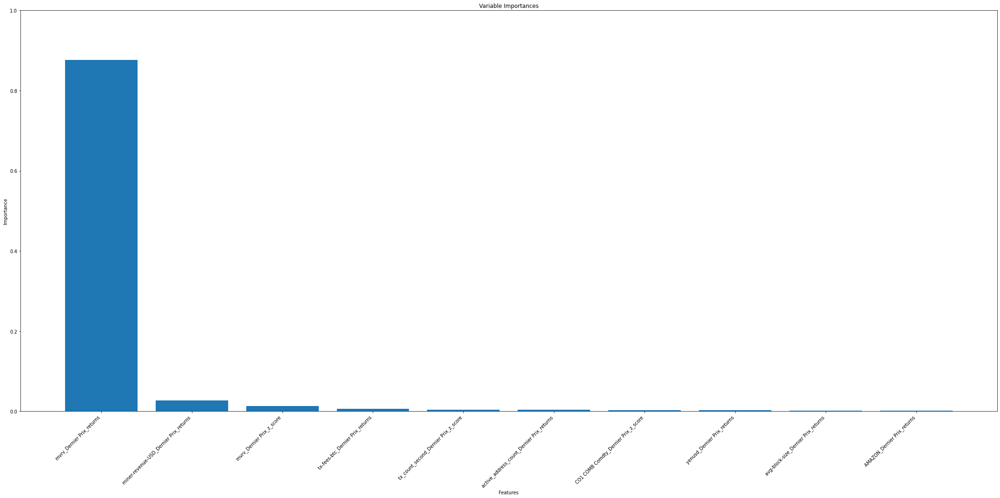

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.000455   5
1     miner-revenue-USD_Dernier Prix_returns  0.057322   2
2                  mvrv_Dernier Prix_z_score  0.299729   1
3           tx-fees-btc_Dernier Prix_returns  0.643663   2
4       tx_count_second_Dernier Prix_z_score  0.061448   2
5  active_address_count_Dernier Prix_returns  0.055997   2
6       CO1 COMB Comdty_Dernier Prix_z_score  0.355942   1
7                yenusd_Dernier Prix_returns  0.143812   2
8        avg-block-size_Dernier Prix_returns  0.668546   3
9                AMAZON_Dernier Prix_returns  0.311801   2
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.8645
1     miner-revenue-USD_Dernier Prix_returns      0.0346
2                  mvrv_Dernier Prix_z_score      0.0172
3           tx-fees-btc_Dernier Prix_returns      0.0081
4       tx_count_second_Dernier Prix_returns      0.0051
5       t

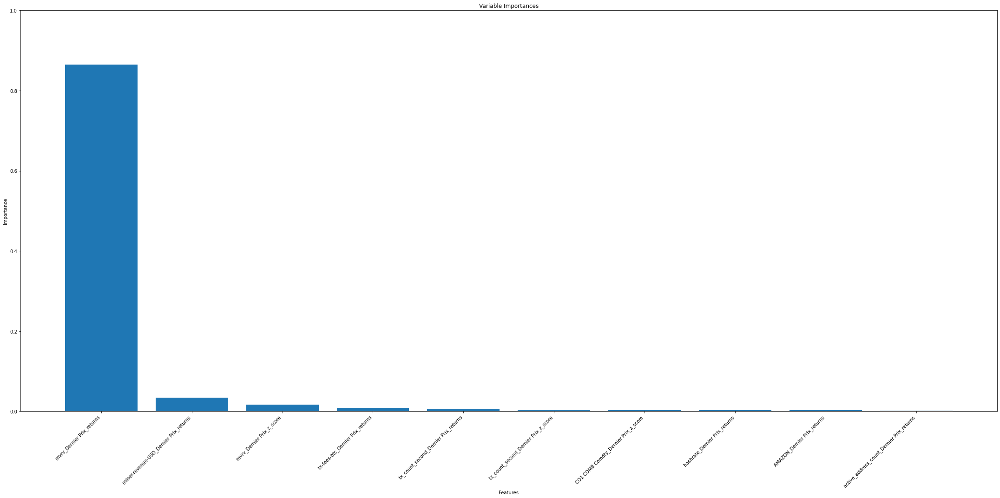

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.000601   5
1     miner-revenue-USD_Dernier Prix_returns  0.032934   3
2                  mvrv_Dernier Prix_z_score  0.324732   1
3           tx-fees-btc_Dernier Prix_returns  0.555711   2
4       tx_count_second_Dernier Prix_returns  0.065382   2
5       tx_count_second_Dernier Prix_z_score  0.140618   2
6       CO1 COMB Comdty_Dernier Prix_z_score  0.373695   1
7              hashrate_Dernier Prix_returns  0.093871   4
8                AMAZON_Dernier Prix_returns  0.321487   2
9  active_address_count_Dernier Prix_returns  0.114231   2
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.8585
1  miner-revenue-USD_Dernier Prix_returns      0.0322
2               mvrv_Dernier Prix_z_score      0.0286
3    tx_count_second_Dernier Prix_z_score      0.0086
4        tx-fees-btc_Dernier Prix_returns      0.0042
5    CO1 COMB Comdty_Dernie

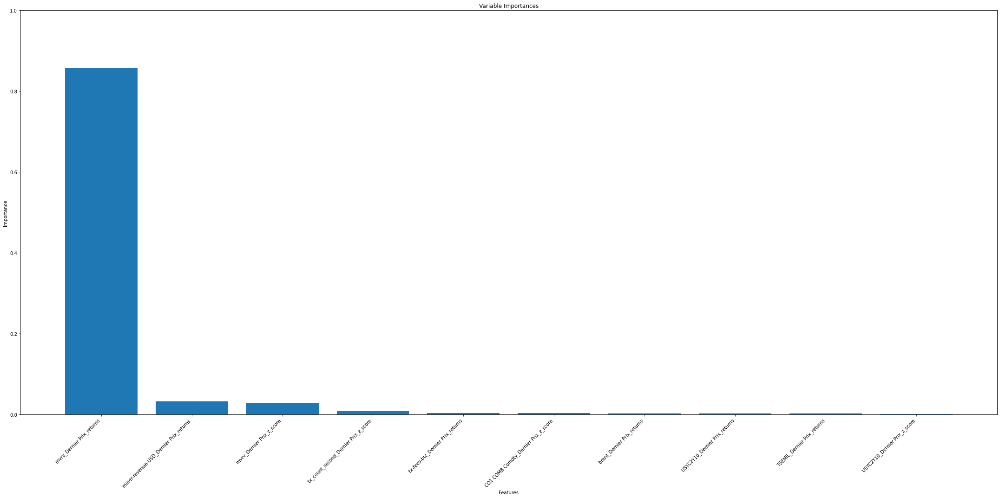

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.000183   5
1  miner-revenue-USD_Dernier Prix_returns  0.043187   3
2               mvrv_Dernier Prix_z_score  0.194468   4
3    tx_count_second_Dernier Prix_z_score  0.053609   2
4        tx-fees-btc_Dernier Prix_returns  0.656385   2
5    CO1 COMB Comdty_Dernier Prix_z_score  0.259039   1
6              brent_Dernier Prix_returns  0.033172   2
7           USYC2Y10_Dernier Prix_returns  0.067259   5
8             TSEMIL_Dernier Prix_returns  0.457240   1
9           USYC2Y10_Dernier Prix_z_score  0.354093   4
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.8975
1  miner-revenue-USD_Dernier Prix_returns      0.0167
2               mvrv_Dernier Prix_z_score      0.0064
3             GCNY3M_Dernier Prix_returns      0.0032
4    CO1 COMB Comdty_Dernier Prix_z_score      0.0029
5    tx_count_second_Dernier Prix_z_score      0.0028
6     

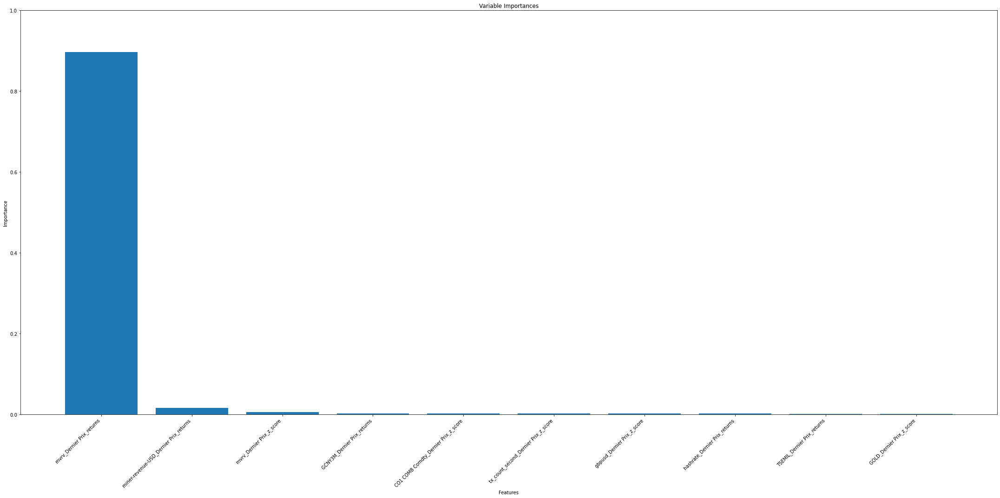

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.000151   5
1  miner-revenue-USD_Dernier Prix_returns  0.068948   3
2               mvrv_Dernier Prix_z_score  0.163363   3
3             GCNY3M_Dernier Prix_returns  0.443820   1
4    CO1 COMB Comdty_Dernier Prix_z_score  0.305212   1
5    tx_count_second_Dernier Prix_z_score  0.112624   2
6             gbpusd_Dernier Prix_z_score  0.379497   1
7           hashrate_Dernier Prix_returns  0.052106   4
8             TSEMIL_Dernier Prix_returns  0.449429   1
9               GOLD_Dernier Prix_z_score  0.088358   3
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.8771
1  miner-revenue-USD_Dernier Prix_returns      0.0245
2               mvrv_Dernier Prix_z_score      0.0166
3    CO1 COMB Comdty_Dernier Prix_z_score      0.0056
4    tx_count_second_Dernier Prix_z_score      0.0042
5        tx-fees-btc_Dernier Prix_returns      0.0040
6     

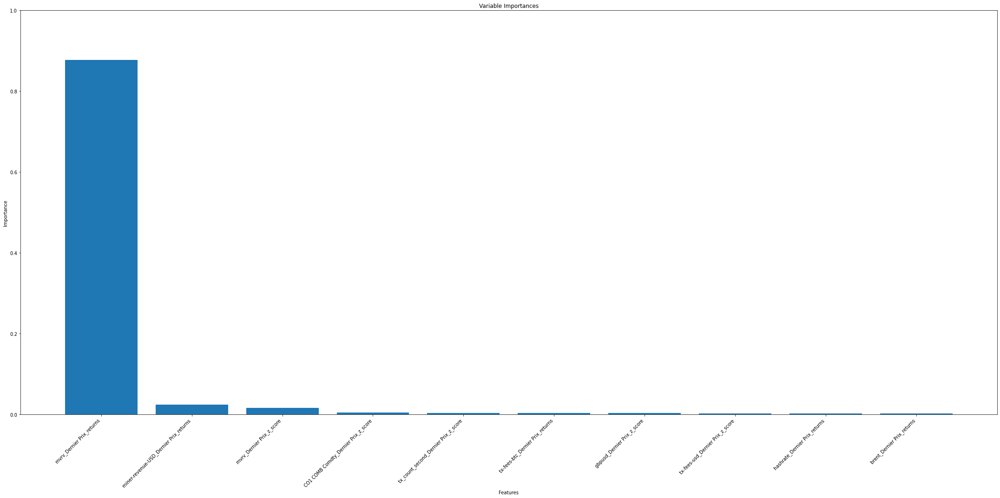

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.000095   5
1  miner-revenue-USD_Dernier Prix_returns  0.077802   3
2               mvrv_Dernier Prix_z_score  0.176951   1
3    CO1 COMB Comdty_Dernier Prix_z_score  0.265865   1
4    tx_count_second_Dernier Prix_z_score  0.091944   2
5        tx-fees-btc_Dernier Prix_returns  0.683153   2
6             gbpusd_Dernier Prix_z_score  0.348761   1
7        tx-fees-usd_Dernier Prix_z_score  0.203774   2
8           hashrate_Dernier Prix_returns  0.094318   4
9              brent_Dernier Prix_returns  0.010716   1
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.8904
1               mvrv_Dernier Prix_z_score      0.0150
2  miner-revenue-USD_Dernier Prix_returns      0.0146
3               BDIY_Dernier Prix_z_score      0.0048
4    CO1 COMB Comdty_Dernier Prix_z_score      0.0035
5        tx-fees-btc_Dernier Prix_returns      0.0033
6     

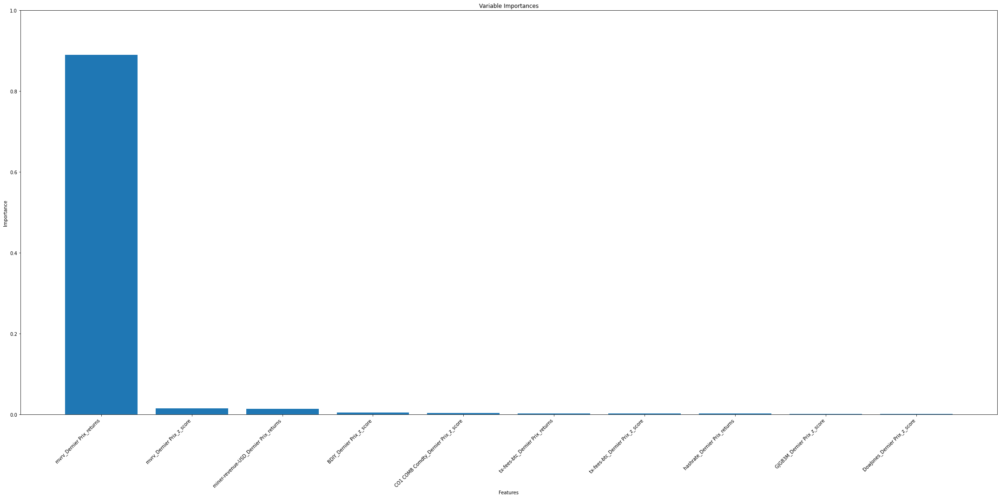

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.000034   5
1               mvrv_Dernier Prix_z_score  0.132217   4
2  miner-revenue-USD_Dernier Prix_returns  0.048669   3
3               BDIY_Dernier Prix_z_score  0.005562   1
4    CO1 COMB Comdty_Dernier Prix_z_score  0.369828   1
5        tx-fees-btc_Dernier Prix_returns  0.641723   2
6        tx-fees-btc_Dernier Prix_z_score  0.423737   1
7           hashrate_Dernier Prix_returns  0.024785   4
8             GJGB3M_Dernier Prix_z_score  0.030331   1
9           DowJones_Dernier Prix_z_score  0.053244   5
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.8927
1  miner-revenue-USD_Dernier Prix_returns      0.0206
2               mvrv_Dernier Prix_z_score      0.0185
3    CO1 COMB Comdty_Dernier Prix_z_score      0.0031
4     TED SPREAD EUR_Dernier Prix_returns      0.0026
5        tx-fees-usd_Dernier Prix_returns      0.0023
6     

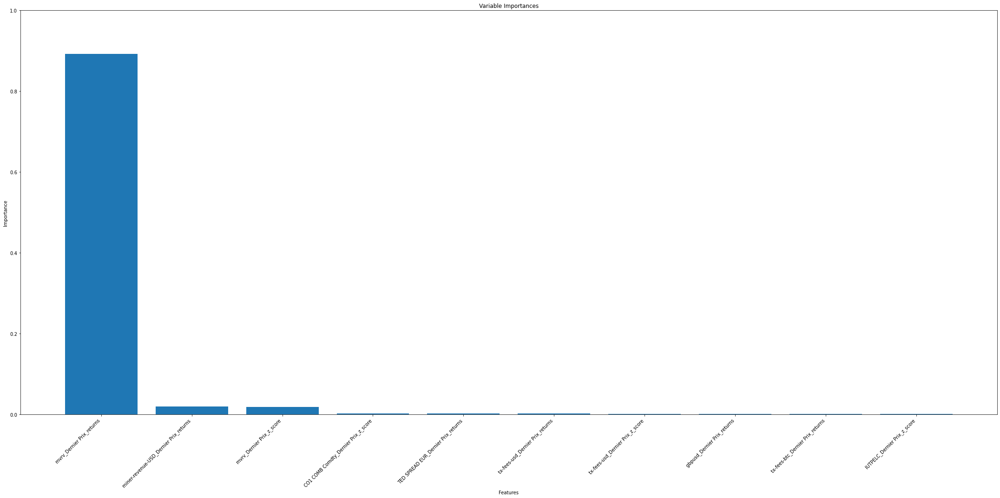

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.000059   5
1  miner-revenue-USD_Dernier Prix_returns  0.042354   3
2               mvrv_Dernier Prix_z_score  0.118777   3
3    CO1 COMB Comdty_Dernier Prix_z_score  0.324791   1
4     TED SPREAD EUR_Dernier Prix_returns  0.534745   2
5        tx-fees-usd_Dernier Prix_returns  0.220470   2
6        tx-fees-usd_Dernier Prix_z_score  0.363545   2
7             gbpusd_Dernier Prix_returns  0.028487   1
8        tx-fees-btc_Dernier Prix_returns  0.801502   2
9            IUTPELC_Dernier Prix_z_score  0.014668   3
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.8880
1  miner-revenue-USD_Dernier Prix_returns      0.0297
2               mvrv_Dernier Prix_z_score      0.0088
3           hashrate_Dernier Prix_returns      0.0050
4    CO1 COMB Comdty_Dernier Prix_z_score      0.0031
5        tx-fees-btc_Dernier Prix_z_score      0.0027
6     

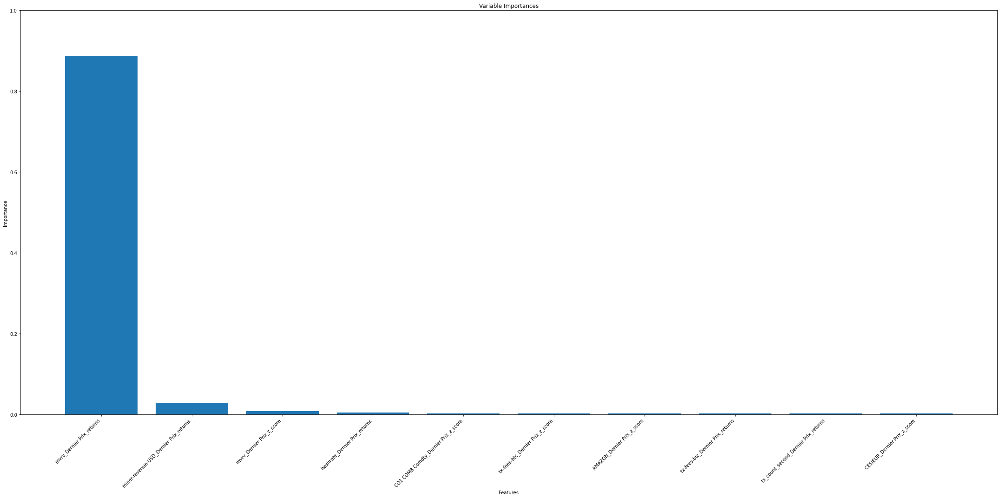

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.000006   5
1  miner-revenue-USD_Dernier Prix_returns  0.041022   3
2               mvrv_Dernier Prix_z_score  0.067750   5
3           hashrate_Dernier Prix_returns  0.044074   4
4    CO1 COMB Comdty_Dernier Prix_z_score  0.249325   1
5        tx-fees-btc_Dernier Prix_z_score  0.439281   1
6             AMAZON_Dernier Prix_z_score  0.003409   4
7        tx-fees-btc_Dernier Prix_returns  0.690624   2
8    tx_count_second_Dernier Prix_returns  0.033798   2
9            CESIEUR_Dernier Prix_z_score  0.315734   2
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.8755
1               mvrv_Dernier Prix_z_score      0.0398
2  miner-revenue-USD_Dernier Prix_returns      0.0197
3        tx-fees-btc_Dernier Prix_z_score      0.0027
4        tx-fees-btc_Dernier Prix_returns      0.0023
5    tx_count_second_Dernier Prix_returns      0.0022
6     

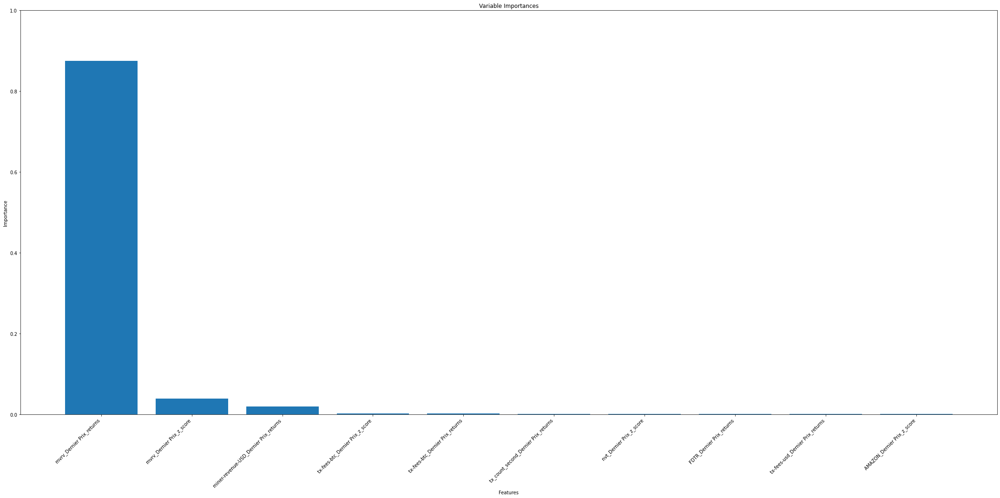

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.000034   5
1               mvrv_Dernier Prix_z_score  0.245452   3
2  miner-revenue-USD_Dernier Prix_returns  0.035506   3
3        tx-fees-btc_Dernier Prix_z_score  0.426995   1
4        tx-fees-btc_Dernier Prix_returns  0.677185   2
5    tx_count_second_Dernier Prix_returns  0.098260   2
6                nvt_Dernier Prix_z_score  0.370292   1
7               FDTR_Dernier Prix_returns  0.186944   1
8        tx-fees-usd_Dernier Prix_returns  0.180860   2
9             AMAZON_Dernier Prix_z_score  0.008783   4
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.8578
1               mvrv_Dernier Prix_z_score      0.0599
2  miner-revenue-USD_Dernier Prix_returns      0.0169
3        tx-fees-btc_Dernier Prix_z_score      0.0049
4        tx-fees-usd_Dernier Prix_z_score      0.0030
5        tx-fees-btc_Dernier Prix_returns      0.0028
6    t

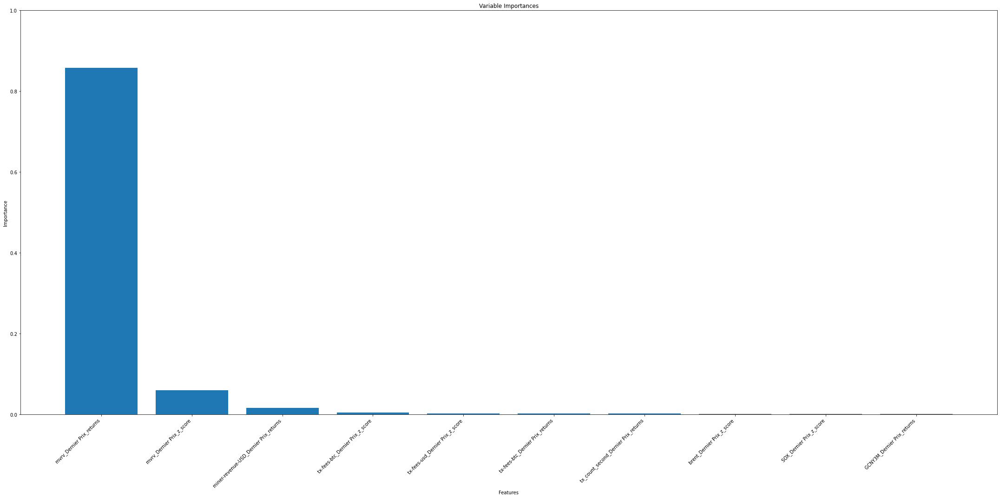

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.000713   5
1               mvrv_Dernier Prix_z_score  0.257511   3
2  miner-revenue-USD_Dernier Prix_returns  0.030881   3
3        tx-fees-btc_Dernier Prix_z_score  0.373167   1
4        tx-fees-usd_Dernier Prix_z_score  0.211305   2
5        tx-fees-btc_Dernier Prix_returns  0.700633   2
6    tx_count_second_Dernier Prix_returns  0.103656   2
7              brent_Dernier Prix_z_score  0.360588   2
8                SOX_Dernier Prix_z_score  0.172106   4
9             GCNY3M_Dernier Prix_returns  0.602418   1
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.8962
1               mvrv_Dernier Prix_z_score      0.0279
2  miner-revenue-USD_Dernier Prix_returns      0.0108
3        tx-fees-btc_Dernier Prix_returns      0.0067
4        renminbiusd_Dernier Prix_z_score      0.0025
5        tx-fees-btc_Dernier Prix_z_score      0.0023
6    C

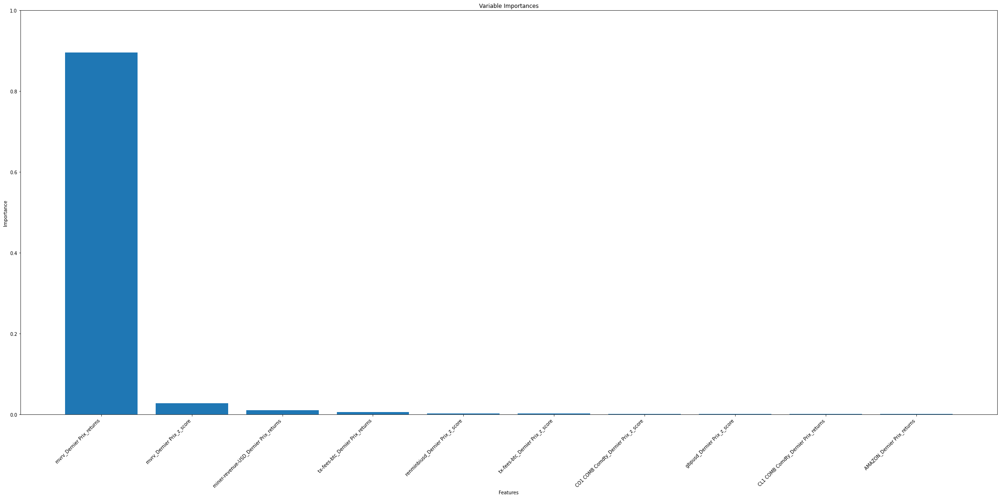

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.005189   5
1               mvrv_Dernier Prix_z_score  0.309830   3
2  miner-revenue-USD_Dernier Prix_returns  0.044120   2
3        tx-fees-btc_Dernier Prix_returns  0.565258   2
4        renminbiusd_Dernier Prix_z_score  0.238823   1
5        tx-fees-btc_Dernier Prix_z_score  0.396307   1
6    CO1 COMB Comdty_Dernier Prix_z_score  0.263184   1
7             gbpusd_Dernier Prix_z_score  0.578198   1
8    CL1 COMB Comdty_Dernier Prix_returns  0.172389   1
9             AMAZON_Dernier Prix_returns  0.152707   2
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.8794
1               mvrv_Dernier Prix_z_score      0.0386
2  miner-revenue-USD_Dernier Prix_returns      0.0148
3        tx-fees-btc_Dernier Prix_returns      0.0038
4             gbpusd_Dernier Prix_z_score      0.0031
5           hashrate_Dernier Prix_returns      0.0027
6    C

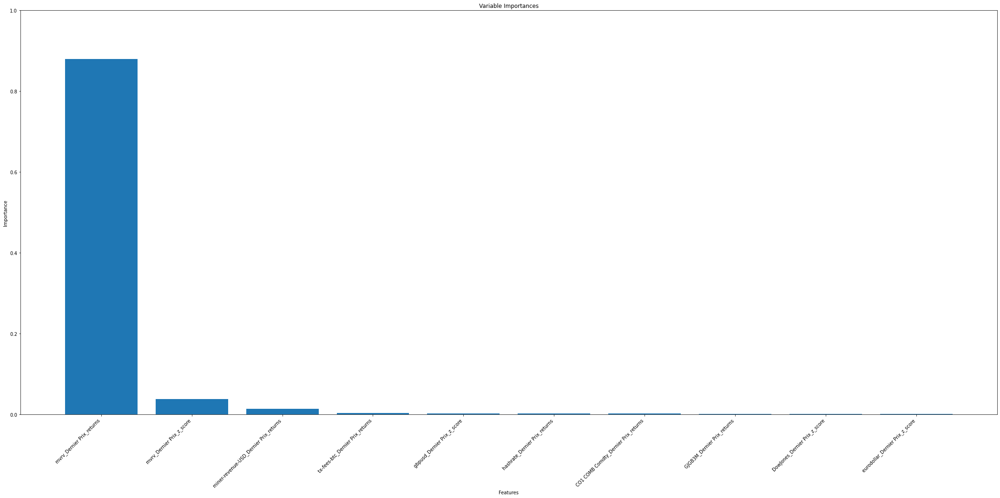

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.077973   1
1               mvrv_Dernier Prix_z_score  0.384225   3
2  miner-revenue-USD_Dernier Prix_returns  0.018151   2
3        tx-fees-btc_Dernier Prix_returns  0.344610   2
4             gbpusd_Dernier Prix_z_score  0.233993   1
5           hashrate_Dernier Prix_returns  0.018194   4
6    CO1 COMB Comdty_Dernier Prix_returns  0.040964   1
7             GJGB3M_Dernier Prix_returns  0.000519   1
8           DowJones_Dernier Prix_z_score  0.012611   4
9         eurodollar_Dernier Prix_z_score  0.141493   2
                                    Feature  Importance
0                 mvrv_Dernier Prix_returns      0.8353
1                 mvrv_Dernier Prix_z_score      0.0690
2    miner-revenue-USD_Dernier Prix_returns      0.0257
3          tx-fees-btc_Dernier Prix_returns      0.0036
4      CO1 COMB Comdty_Dernier Prix_returns      0.0035
5  federal_rate_target_Dernier Prix_returns     

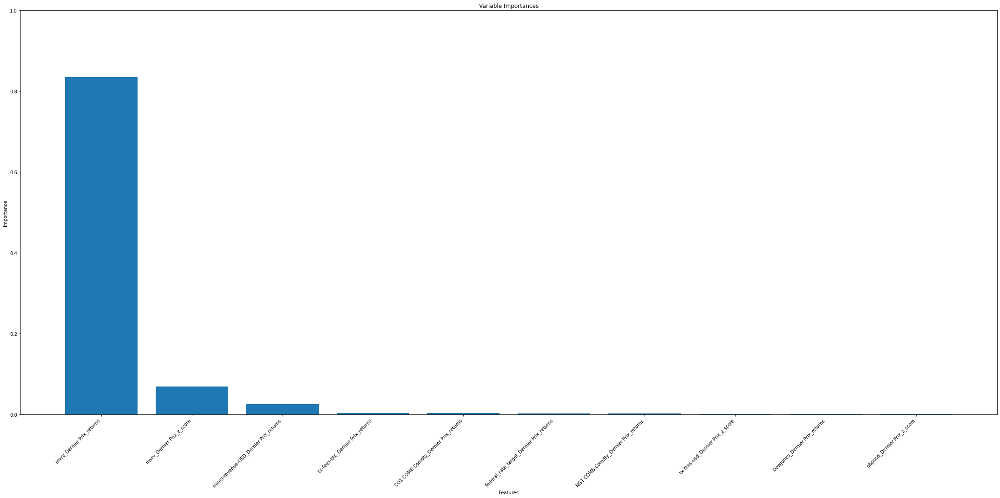

                                    Feature   p_value lag
0                 mvrv_Dernier Prix_returns  0.112184   1
1                 mvrv_Dernier Prix_z_score  0.136806   3
2    miner-revenue-USD_Dernier Prix_returns  0.059254   3
3          tx-fees-btc_Dernier Prix_returns  0.633593   2
4      CO1 COMB Comdty_Dernier Prix_returns  0.040284   1
5  federal_rate_target_Dernier Prix_returns  0.175307   1
6      NG1 COMB Comdty_Dernier Prix_returns  0.805685   1
7          tx-fees-usd_Dernier Prix_z_score  0.204161   2
8             DowJones_Dernier Prix_returns  0.114977   1
9               gbpusd_Dernier Prix_z_score  0.548947   1
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.8662
1               mvrv_Dernier Prix_z_score      0.0355
2  miner-revenue-USD_Dernier Prix_returns      0.0285
3        tx-fees-btc_Dernier Prix_z_score      0.0027
4    CO1 COMB Comdty_Dernier Prix_returns      0.0026
5        tx-fees-btc_Dernier Prix_retu

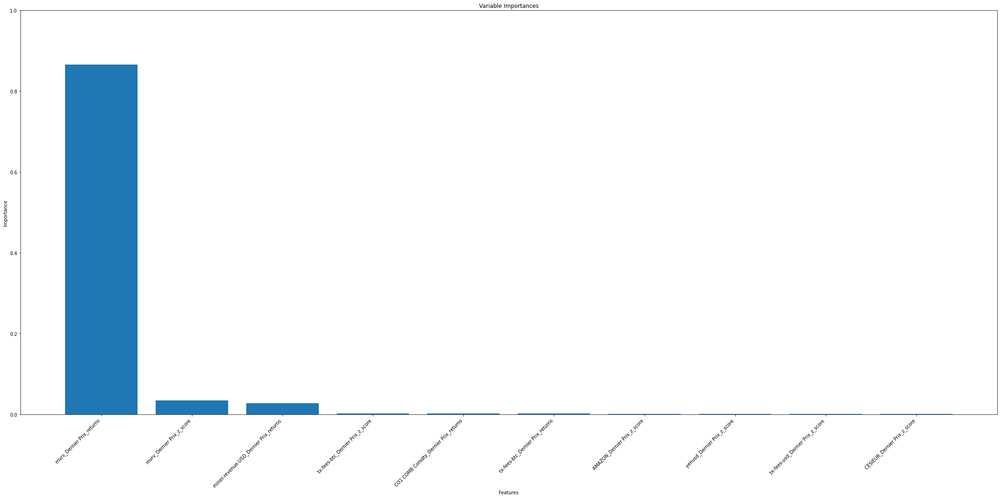

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.148791   1
1               mvrv_Dernier Prix_z_score  0.288153   5
2  miner-revenue-USD_Dernier Prix_returns  0.025191   2
3        tx-fees-btc_Dernier Prix_z_score  0.237395   1
4    CO1 COMB Comdty_Dernier Prix_returns  0.023101   1
5        tx-fees-btc_Dernier Prix_returns  0.869089   1
6             AMAZON_Dernier Prix_z_score  0.009841   4
7             yenusd_Dernier Prix_z_score  0.554002   3
8        tx-fees-usd_Dernier Prix_z_score  0.192205   2
9            CESIEUR_Dernier Prix_z_score  0.285977   1
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.8538
1  miner-revenue-USD_Dernier Prix_returns      0.0377
2               mvrv_Dernier Prix_z_score      0.0289
3                nvt_Dernier Prix_returns      0.0056
4    tx_count_second_Dernier Prix_returns      0.0049
5               FDTR_Dernier Prix_z_score      0.0028
6     

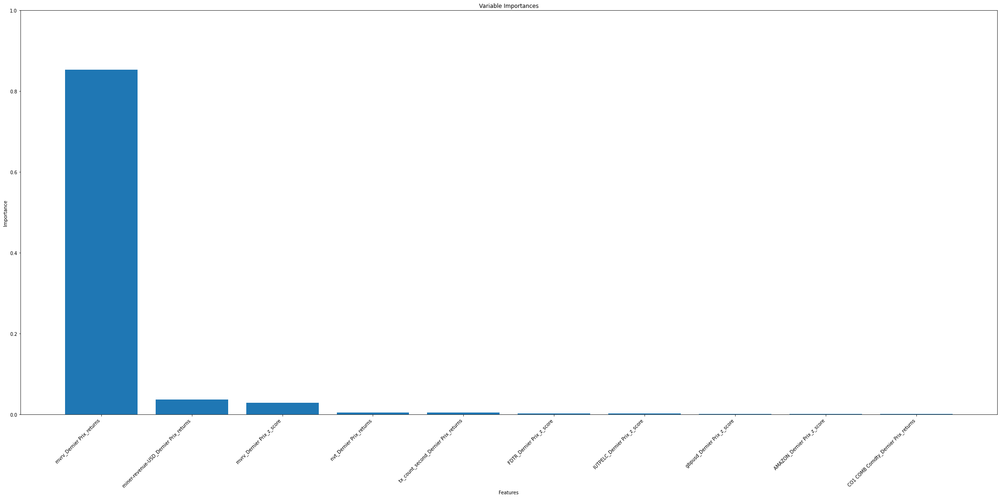

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.172754   1
1  miner-revenue-USD_Dernier Prix_returns  0.012594   2
2               mvrv_Dernier Prix_z_score  0.357970   5
3                nvt_Dernier Prix_returns  0.075968   1
4    tx_count_second_Dernier Prix_returns  0.206904   3
5               FDTR_Dernier Prix_z_score  0.415023   3
6            IUTPELC_Dernier Prix_z_score  0.058822   4
7             gbpusd_Dernier Prix_z_score  0.327371   1
8             AMAZON_Dernier Prix_z_score  0.060062   4
9    CO1 COMB Comdty_Dernier Prix_returns  0.023468   1
                                          Feature  Importance
0                       mvrv_Dernier Prix_returns      0.8918
1          miner-revenue-USD_Dernier Prix_returns      0.0235
2                       mvrv_Dernier Prix_z_score      0.0137
3                tx-fees-btc_Dernier Prix_returns      0.0045
4  val_in_addr_w_bal_sup_10K_Dernier Prix_returns      0.0034
5           

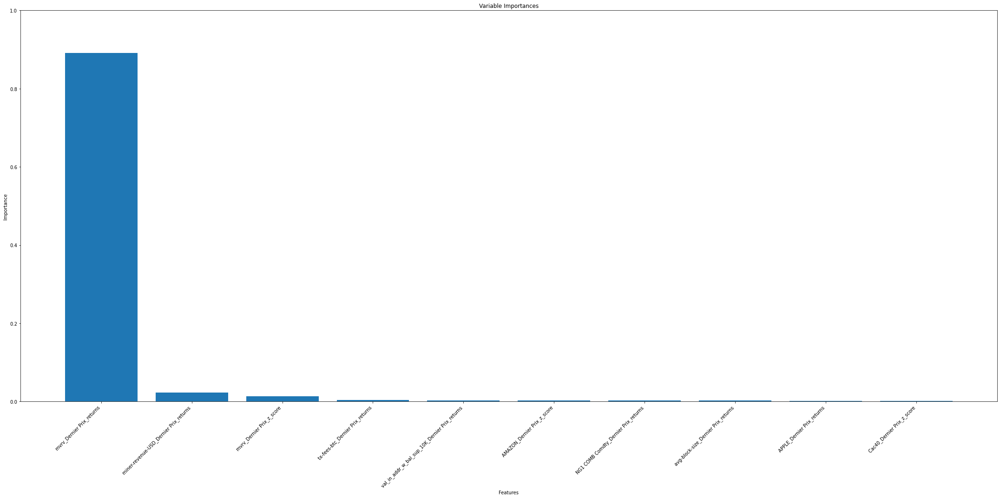

                                          Feature   p_value lag
0                       mvrv_Dernier Prix_returns  0.179532   1
1          miner-revenue-USD_Dernier Prix_returns  0.009613   2
2                       mvrv_Dernier Prix_z_score  0.219705   5
3                tx-fees-btc_Dernier Prix_returns  0.810522   1
4  val_in_addr_w_bal_sup_10K_Dernier Prix_returns  0.619225   4
5                     AMAZON_Dernier Prix_z_score  0.055320   4
6            NG1 COMB Comdty_Dernier Prix_returns  0.789759   1
7             avg-block-size_Dernier Prix_returns  0.103963   3
8                      APPLE_Dernier Prix_returns  0.182019   1
9                      Cac40_Dernier Prix_z_score  0.223217   1
                                          Feature  Importance
0                       mvrv_Dernier Prix_returns      0.8553
1          miner-revenue-USD_Dernier Prix_returns      0.0321
2                       mvrv_Dernier Prix_z_score      0.0264
3                tx-fees-btc_Dernier Prix_return

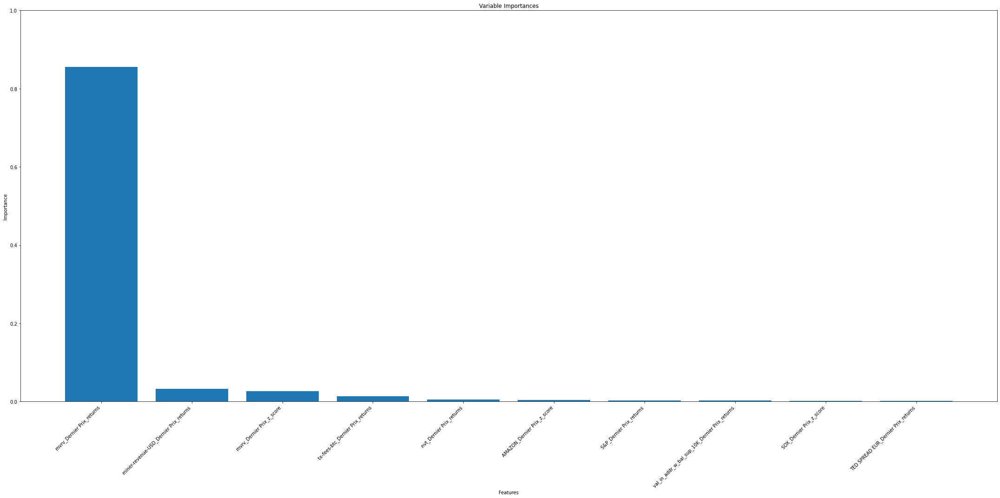

                                          Feature   p_value lag
0                       mvrv_Dernier Prix_returns  0.185337   1
1          miner-revenue-USD_Dernier Prix_returns  0.008380   2
2                       mvrv_Dernier Prix_z_score  0.261617   5
3                tx-fees-btc_Dernier Prix_returns  0.786795   1
4                        nvt_Dernier Prix_returns  0.081675   1
5                     AMAZON_Dernier Prix_z_score  0.086648   5
6                        S&P_Dernier Prix_returns  0.249058   1
7  val_in_addr_w_bal_sup_10K_Dernier Prix_returns  0.539484   4
8                        SOX_Dernier Prix_z_score  0.060751   1
9             TED SPREAD EUR_Dernier Prix_returns  0.520994   2
                                          Feature  Importance
0                       mvrv_Dernier Prix_returns      0.8696
1                       mvrv_Dernier Prix_z_score      0.0355
2          miner-revenue-USD_Dernier Prix_returns      0.0228
3                tx-fees-btc_Dernier Prix_z_scor

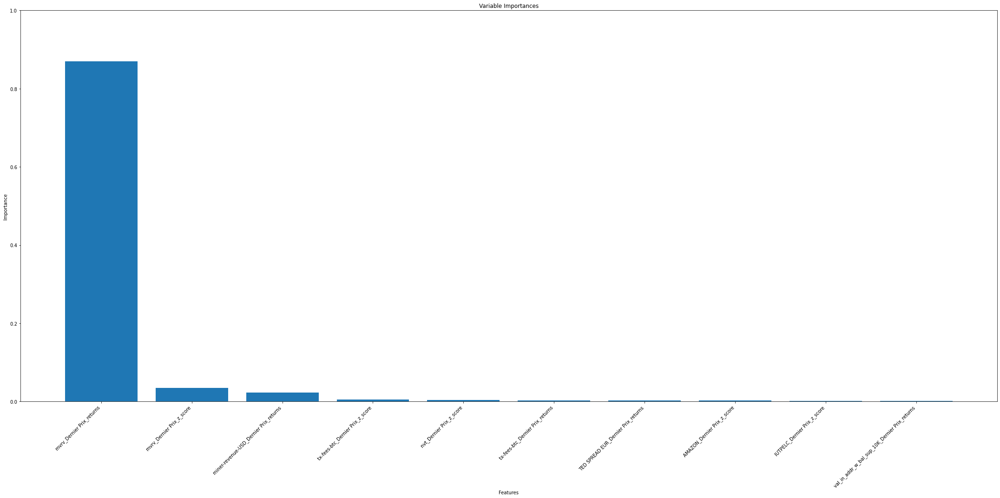

                                          Feature   p_value lag
0                       mvrv_Dernier Prix_returns  0.227036   1
1                       mvrv_Dernier Prix_z_score  0.271408   5
2          miner-revenue-USD_Dernier Prix_returns  0.008372   3
3                tx-fees-btc_Dernier Prix_z_score  0.170535   1
4                        nvt_Dernier Prix_z_score  0.236433   1
5                tx-fees-btc_Dernier Prix_returns  0.757124   1
6             TED SPREAD EUR_Dernier Prix_returns  0.527279   2
7                     AMAZON_Dernier Prix_z_score  0.079785   3
8                    IUTPELC_Dernier Prix_z_score  0.067143   4
9  val_in_addr_w_bal_sup_10K_Dernier Prix_returns  0.501866   4
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.8810
1  miner-revenue-USD_Dernier Prix_returns      0.0284
2               mvrv_Dernier Prix_z_score      0.0152
3     avg-block-size_Dernier Prix_returns      0.0041
4        tx-fees-btc_Derni

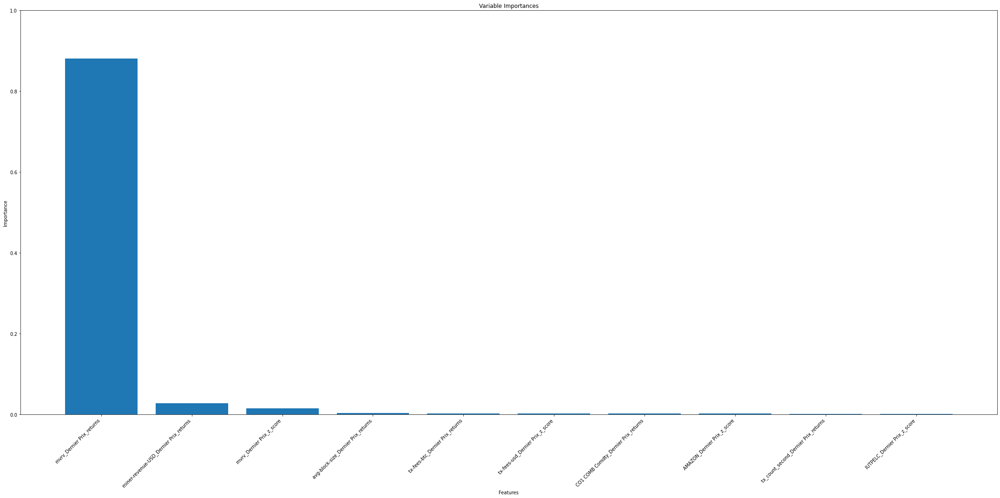

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.218034   1
1  miner-revenue-USD_Dernier Prix_returns  0.014973   2
2               mvrv_Dernier Prix_z_score  0.497593   5
3     avg-block-size_Dernier Prix_returns  0.084146   3
4        tx-fees-btc_Dernier Prix_returns  0.741921   1
5        tx-fees-usd_Dernier Prix_z_score  0.408294   2
6    CO1 COMB Comdty_Dernier Prix_returns  0.040673   1
7             AMAZON_Dernier Prix_z_score  0.124293   3
8    tx_count_second_Dernier Prix_returns  0.196534   3
9            IUTPELC_Dernier Prix_z_score  0.064291   4
                                     Feature  Importance
0                  mvrv_Dernier Prix_returns      0.8000
1                  mvrv_Dernier Prix_z_score      0.0987
2     miner-revenue-USD_Dernier Prix_returns      0.0178
3        avg-block-size_Dernier Prix_returns      0.0062
4       mean_difficulty_Dernier Prix_returns      0.0052
5               IUTPELC_Dernier Prix_retur

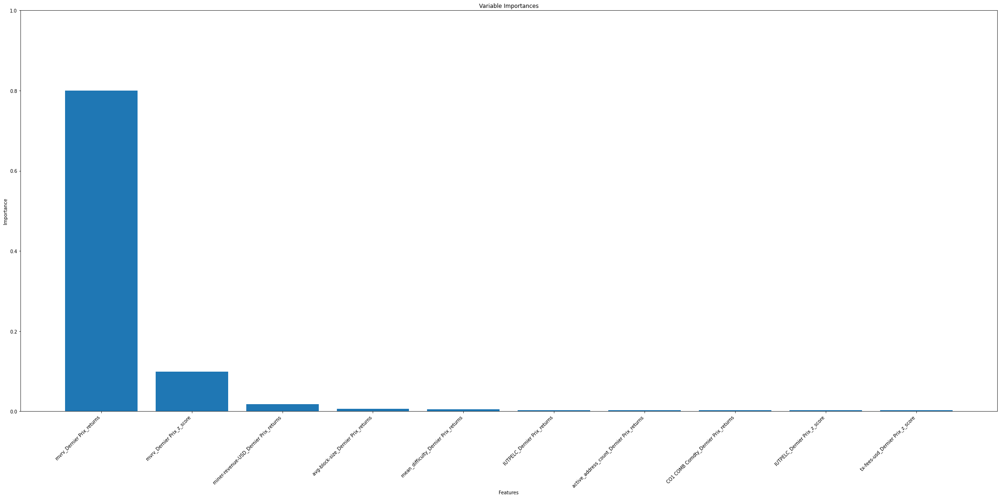

                                     Feature   p_value lag
0                  mvrv_Dernier Prix_returns  0.272584   1
1                  mvrv_Dernier Prix_z_score  0.323241   5
2     miner-revenue-USD_Dernier Prix_returns  0.009312   2
3        avg-block-size_Dernier Prix_returns  0.240660   3
4       mean_difficulty_Dernier Prix_returns  0.002385   4
5               IUTPELC_Dernier Prix_returns  0.015282   3
6  active_address_count_Dernier Prix_returns  0.026117   2
7       CO1 COMB Comdty_Dernier Prix_returns  0.052392   1
8               IUTPELC_Dernier Prix_z_score  0.043519   3
9           tx-fees-usd_Dernier Prix_z_score  0.342144   1
                                  Feature  Importance
0               mvrv_Dernier Prix_returns      0.8137
1               mvrv_Dernier Prix_z_score      0.0665
2  miner-revenue-USD_Dernier Prix_returns      0.0297
3    mean_difficulty_Dernier Prix_returns      0.0098
4                S&P_Dernier Prix_returns      0.0050
5     avg-block-size_Dernie

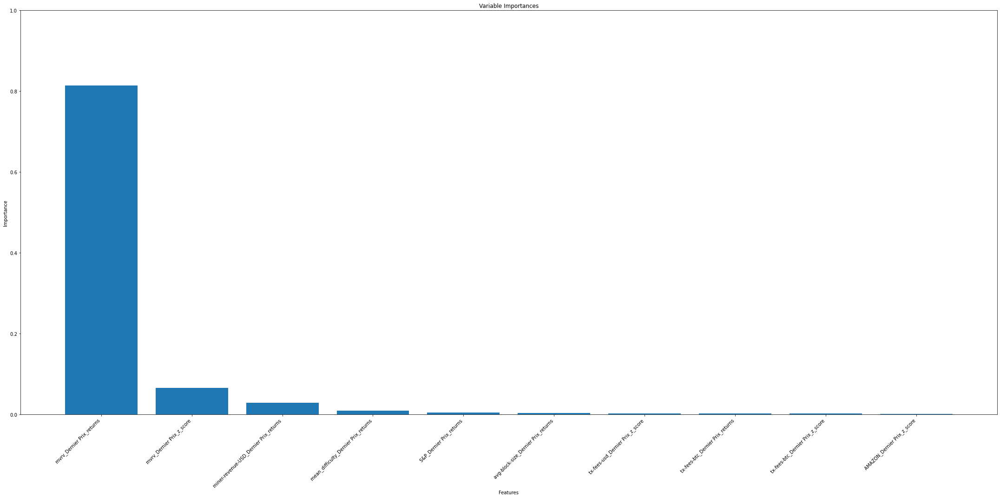

                                  Feature   p_value lag
0               mvrv_Dernier Prix_returns  0.289217   1
1               mvrv_Dernier Prix_z_score  0.347804   5
2  miner-revenue-USD_Dernier Prix_returns  0.014019   2
3    mean_difficulty_Dernier Prix_returns  0.003248   2
4                S&P_Dernier Prix_returns  0.286384   4
5     avg-block-size_Dernier Prix_returns  0.111244   3
6        tx-fees-usd_Dernier Prix_z_score  0.386722   1
7        tx-fees-btc_Dernier Prix_returns  0.692480   2
8        tx-fees-btc_Dernier Prix_z_score  0.248366   1
9             AMAZON_Dernier Prix_z_score  0.070632   4


"feature_counts_df = pd.DataFrame(list(feature_counts.items()), columns=['Feature', 'count'])\nfeature_counts_df = feature_counts_df.sort_values(by='count', ascending=False)\nprint(feature_counts_df)\nfeature_mean_p_value_df = pd.DataFrame(list(feature_counts.items()), columns=['Feature', 'p_values'])\nfeature_counts_df = feature_counts_df.sort_values(by='p_values', ascending=False)\nprint(feature_counts_df)\nall_total_returns=pd.DataFrame(all_total_returns)\nbtc_returns=pd.DataFrame(btc_returns)"

In [19]:
# Basically, I chose a 200 weeks window analysis. Which is representative to a Bitcoin cycle period.
# I take 160 weeks to TRAIN my model and 40 weeks to TEST it.
# Then I make my Random Forest predictions on the returns and iterate with a 4 weeks rolling.
# I chose to make a rolling incrementation instead of an expanding one in order to keep only 
# the dynamics that might explain the Bitcoin's narratives (features that explain Bitcoin are evolving with time !)


all_total_returns = []
btc_returns = []
return_dates = []

feature_counts = {}
feature_mean_p_values= {}
for i in range(0, len(labels)-200, 4):
 

    train_labels=labels.iloc[0+i:160+i]
    train_features=features.iloc[0+i:160+i]

    test_labels=labels.iloc[159+i:200+i]
    test_features=features.iloc[159+i:200+i]


    train_dates=dataset_prices.index[0+i:160+i]
    test_dates=dataset_prices.index[159+i:200+i]

     
    """print("\nStart Train : ", train_dates[0])
    print("End Train : ", train_dates[-1])
    print("Start Test : ", test_dates[0])
    print("End Test : ", test_dates[-1])
    """


    # Instantiate model 
    rf = RandomForestRegressor(n_estimators= 50, max_depth=None, min_samples_leaf=1, min_samples_split=2, random_state=(42))

    # Train the model on training data
    rf.fit(train_features, train_labels)

    
    # Make Predictions on Test Data

    # Use the forest's predict method on the test data
    predictions = rf.predict(test_features)
    
    """print('LAST WEEKLY RETURNS PREDICTIONS : ', predictions[-1])
    print('LAST MONTHLY RETURNS PREDICTIONS : ', np.mean(predictions[-4:]))"""

    # Calculate the absolute errors
    errors = abs(predictions - test_labels)

    # Print out the mean absolute error (mae)
    #print('\nMean Absolute Error:', round(np.mean(errors), 2))


    # Calculate mean absolute percentage error (MAPE)
    mape = 100 * (errors / test_labels)

    # Calculate and display accuracy
    accuracy = 100 - np.mean(mape)
    """print('Accuracy:', round(accuracy, 2), '%.')"""


    # Variable Importances

    # Get numerical feature importances
    importances = list(rf.feature_importances_)
    
    

    # List of tuples with variable and importance
    feature_importances = [(feature, round(importance, 4)) for feature, importance in zip(list(features.columns), importances)]

    # Sort the feature importances by most important first
    feature_importances = sorted(feature_importances, key = lambda x: x[1], reverse = True)
    
    feature_importances_df = pd.DataFrame(feature_importances[:10], columns=['Feature', 'Importance'])


    print(feature_importances_df)
    print("\n\n")
    
    plt.figure(figsize=(30, 15))

    # list of x locations for plotting
    x_values = list(range(len(importances)))
    # Make a bar chart
    plt.bar(feature_importances_df['Feature'], feature_importances_df['Importance']) #, rotation=45, ha='right' )
    plt.xticks(rotation=45, ha='right')
    
    plt.ylim(0, 1)

    # Axis labels and title
    plt.ylabel('Importance'); plt.xlabel('Features'); plt.title('Variable Importances'); 
    plt.tight_layout()
    plt.show()

    # Granger test
    features_importances_granger_test = pd.DataFrame(columns=['Feature', 'p_value','lag'])

    for feature_name in feature_importances_df['Feature']:
        # Select the column corresponding to the feature
        feature_values_train = train_features[feature_name].values.reshape(-1, 1)
        btc_returns_train = train_labels.values

        feature_values_test = test_features[feature_name].values.reshape(-1, 1)
        btc_returns_test = test_labels.values

        feature_values = np.concatenate((feature_values_train, feature_values_test), axis=0)
        btc_returns_for_granger = np.concatenate((btc_returns_train, btc_returns_test), axis=0)

        # Perform Granger Causality Test
        max_lag = 5
        test_result = grangercausalitytests(np.column_stack((feature_values, btc_returns_for_granger)), max_lag, verbose=False)

        # Get p-values from the test results
        p_values = [test_result[i + 1][0]['ssr_ftest'][1] for i in range(max_lag)]
        min_p_value = np.min(p_values)
        lag_of_min_p_value = np.argmin(p_values) + 1

        # Append the results to the DataFrame
        features_importances_granger_test = features_importances_granger_test.append({'Feature': feature_name, 'p_value': min_p_value, 'lag': lag_of_min_p_value}, ignore_index=True)

        #Count the number of apparition of the features 
        if feature_name not in feature_counts:
            feature_counts[feature_name] = 1
            feature_mean_p_values[feature_name] = 1
        else:
            feature_counts[feature_name] += 1
            feature_mean_p_values[feature_name] += min_p_value

        # Plotting histogram
    """plt.figure(figsize=(12, 8))
    sns.set(style="whitegrid")
    palette = sns.color_palette("brg", max_lag)  # You can choose a different color palette

    for lag in range(1, max_lag + 1):
        lag_values = features_importances_granger_test[features_importances_granger_test['lag'] == lag]
        # Reorder the lag_values based on the initial order of features
        lag_values = lag_values.set_index('Feature').reindex(index=feature_importances_df['Feature']).reset_index()
        plt.bar(lag_values['Feature'], lag_values['p_value'], color=palette[lag - 1], label=f'Lag {lag}')

    plt.xticks(rotation=45, ha='right')
    plt.xlabel('Features')
    plt.ylabel('P-Values')
    plt.title('Granger Causality Test Results')
    plt.legend()
    plt.show()"""
    
    # Display the DataFrame with Granger test results
    print(features_importances_granger_test)

    
    # Predictions and Actual Values

    train_dates=dataset_prices.index[0+i:160+i]
    test_dates=dataset_prices.index[159+i:200+i]

    # Convert datetime64[ns] to matplotlib's datetime format
    train_dates = [date.strftime('%Y-%m-%d') for date in train_dates]

    test_dates = [date.strftime('%Y-%m-%d') for date in test_dates]
    

    """# Plotting the entire dataset
    plt.figure(figsize=(18, 12))
    


    # Plotting training set
    plt.plot(train_dates, train_labels, label='Training Set (Actual)', color='green', alpha=0.7)

    # Plotting testing set
    plt.plot(test_dates, test_labels, label='Testing Set (Actual)', color='red', alpha=0.7)

    # Plotting predictions on the testing set
    plt.plot(test_dates, predictions, label='Testing Set (Predicted)', color='orange', alpha=0.7)


    plt.title('Bitcoin Weekly Returns - Actual vs Predicted')
    plt.xlabel('Date')
    plt.ylabel('Bitcoin Weekly Returns')
    plt.legend()
    
  
    # Set the locator for x-axis ticks to display every 6 months
    plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=15))
    plt.show()"""

    return_dates.append(test_dates[-1])
    all_total_returns.append(np.mean(predictions[-4:])) # KEEP THE LAST 4 predicted weekly returns --> last month returns prediction
    btc_returns.append(np.mean(test_labels[-4:]))
    
    #all_total_returns.append(predictions[-1])   # KEEP THE LAST predicted return  --> last week return prediction
    #btc_returns.append(test_labels[-1])

"""feature_counts_df = pd.DataFrame(list(feature_counts.items()), columns=['Feature', 'count'])
feature_counts_df = feature_counts_df.sort_values(by='count', ascending=False)
print(feature_counts_df)
feature_mean_p_value_df = pd.DataFrame(list(feature_counts.items()), columns=['Feature', 'p_values'])
feature_counts_df = feature_counts_df.sort_values(by='p_values', ascending=False)
print(feature_counts_df)
all_total_returns=pd.DataFrame(all_total_returns)
btc_returns=pd.DataFrame(btc_returns)"""

In [12]:
feature_counts_df = pd.DataFrame(list(feature_counts.items()), columns=['Feature', 'Count'])
feature_counts_df = feature_counts_df.sort_values(by='Count', ascending=False)
#print(feature_counts_df)

feature_mean_p_value_df = pd.DataFrame(list(feature_mean_p_values.items()), columns=['Feature', 'p_values'])
feature_mean_p_value_df = feature_mean_p_value_df.sort_values(by='p_values', ascending=False)
#print(feature_mean_p_value_df)

feature_mean_p_value_df['p_values'] = (feature_mean_p_value_df['p_values']) / feature_counts_df['Count'] 

# Fusionnez les DataFrames en utilisant la colonne 'Feature' comme clé de fusion
merged_feature_df = pd.merge(feature_counts_df, feature_mean_p_value_df, on='Feature')

# Affichez le DataFrame fusionné
print(merged_feature_df)

all_total_returns=pd.DataFrame(all_total_returns)
btc_returns=pd.DataFrame(btc_returns)

                                      Feature  Count  p_values
0                   mvrv_Dernier Prix_returns    111  0.029005
1      miner-revenue-USD_Dernier Prix_returns    110  0.039691
2                   mvrv_Dernier Prix_z_score    109  0.165931
3            tx-fees-usd_Dernier Prix_returns     56  0.029060
4   active_address_count_Dernier Prix_returns     47  0.037000
..                                        ...    ...       ...
86               CESIJPY_Dernier Prix_returns      1  1.000000
87        TED SPREAD JPN_Dernier Prix_z_score      1  1.000000
88  active_address_count_Dernier Prix_z_score      1  1.000000
89              hashrate_Dernier Prix_z_score      1  1.000000
90               IUTPELC_Dernier Prix_returns      1  1.000000

[91 rows x 3 columns]


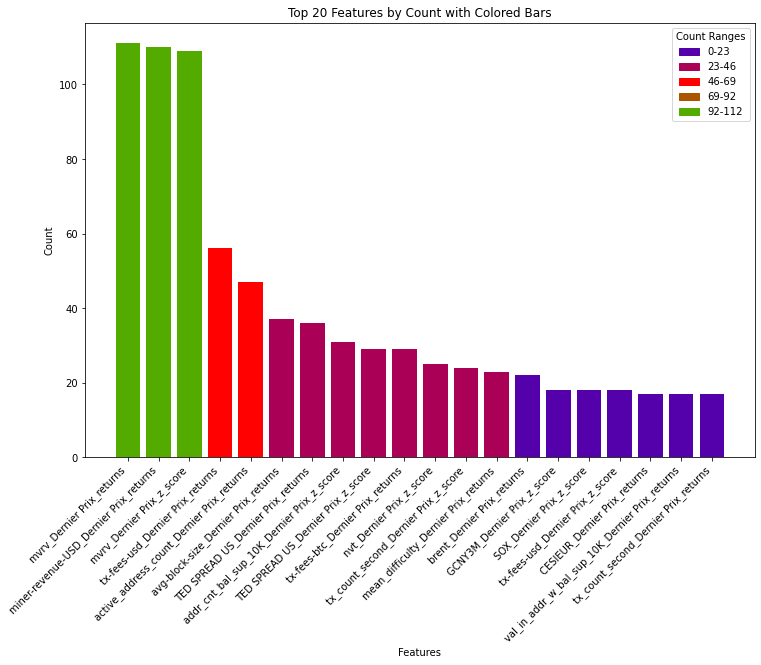

In [13]:
top_20_features_count = merged_feature_df.head(20)

#Define the maximum of apparitions
count_of_first_feature = merged_feature_df.iloc[0]['Count']

# Define color ranges
color_ranges = [0, 23, 46, 69, 92, count_of_first_feature+1]

# Get Seaborn color palette
colors = sns.color_palette("brg", len(color_ranges)-1)

# Assign colors based on count ranges
top_20_features_count['Color'] = pd.cut(top_20_features_count['Count'], bins=color_ranges, labels=colors, right=False)

# Plotting the histogram with colored bars
plt.figure(figsize=(12, 8))
bars = plt.bar(top_20_features_count['Feature'], top_20_features_count['Count'], color=top_20_features_count['Color'])
plt.xticks(rotation=45, ha='right')
plt.xlabel('Features')
plt.ylabel('Count')
plt.title('Top 20 Features by Count with Colored Bars')

# Add legend
legend_labels = [f'{color_ranges[i]}-{color_ranges[i+1]}' for i in range(len(color_ranges)-1)]
legend_colors = [plt.Rectangle((0, 0), 1, 1, color=colors[i]) for i in range(len(colors))]
plt.legend(legend_colors, legend_labels, title='Count Ranges', loc='upper right')

# Show the plot
plt.show()


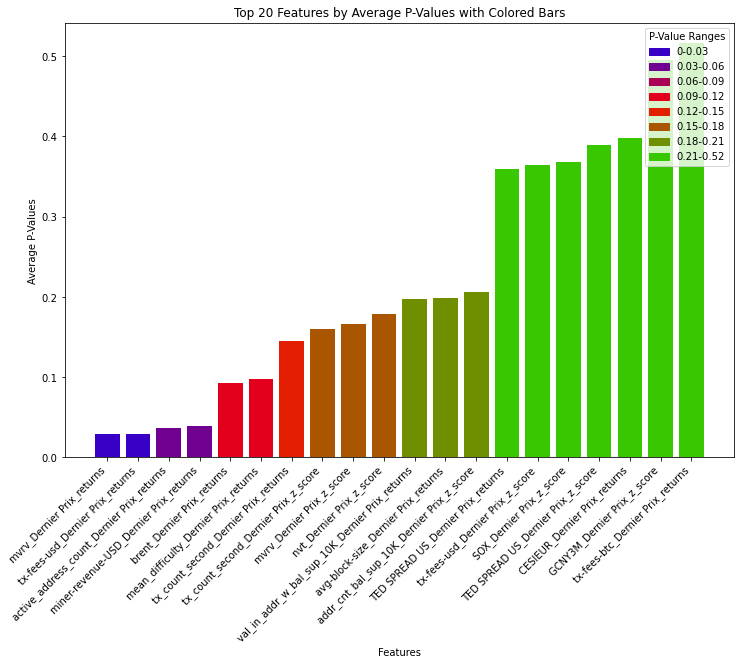

In [18]:
# Triez le DataFrame par 'Average_P_Value' de manière décroissante
top_20_features_p_values = top_20_features_count.sort_values(by='p_values', ascending=True).head(20)

# Réinitialisez les index
top_20_features_p_values.reset_index(drop=True, inplace=True)

#print(top_20_features_p_values)

#Define the maximum of apparitions
mean_p_values_of_first_feature = top_20_features_p_values.iloc[19]['p_values']

#print(mean_p_values_of_first_feature)
# Define color ranges
color_ranges = [0,0.03,0.06,0.09,0.12,0.15,0.18,0.21,np.round(mean_p_values_of_first_feature,2)]

# Get Seaborn color palette
colors = sns.color_palette("brg", len(color_ranges)-1)

# Assign colors based on p_values ranges
top_20_features_p_values['Color'] = pd.cut(top_20_features_p_values['p_values'], bins=color_ranges, labels=colors, right=False)

# Plotting the histogram with colored bars
plt.figure(figsize=(12, 8))
bars = plt.bar(top_20_features_p_values['Feature'], top_20_features_p_values['p_values'], color=top_20_features_p_values['Color'])
plt.xticks(rotation=45, ha='right')
plt.xlabel('Features')
plt.ylabel('Average P-Values')
plt.title('Top 20 Features by Average P-Values with Colored Bars')

# Add legend
legend_labels = [f'{color_ranges[i]}-{color_ranges[i+1]}' for i in range(len(color_ranges)-1)]
legend_colors = [plt.Rectangle((0, 0), 1, 1, color=colors[i]) for i in range(len(colors))]
plt.legend(legend_colors, legend_labels, title='P-Value Ranges', loc='upper right')

# Show the plot
plt.show()


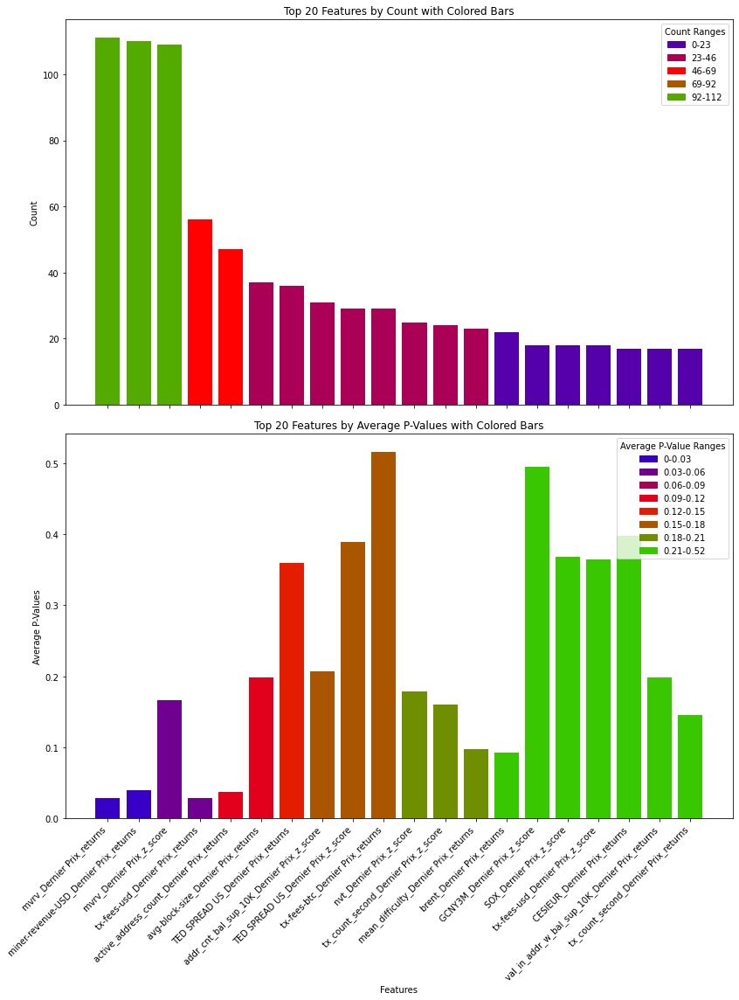

In [15]:
top_20_features = merged_feature_df.head(20)

# Créez une figure avec deux sous-graphiques disposés verticalement
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 16), sharex=True)

# Define color ranges
color_ranges = [0, 23, 46, 69, 92, count_of_first_feature+1]

# Get Seaborn color palette
colors = sns.color_palette("brg", len(color_ranges)-1)
# Plotting histogram with colored bars for Count
bars1 = ax1.bar(top_20_features['Feature'], top_20_features['Count'], color=top_20_features_count['Color'])
ax1.set_ylabel('Count')
ax1.set_title('Top 20 Features by Count with Colored Bars')

# Add legend for the first subplot
legend_labels_count = [f'{color_ranges[i]}-{color_ranges[i+1]}' for i in range(len(color_ranges)-1)]
legend_colors_count = [plt.Rectangle((0, 0), 1, 1, color=colors[i]) for i in range(len(colors))]
ax1.legend(legend_colors_count, legend_labels_count, title='Count Ranges', loc='upper right')

# Plotting histogram with colored bars for Average P-Values
bars2 = ax2.bar(top_20_features['Feature'], top_20_features['p_values'], color=top_20_features_p_values['Color'])
ax2.set_xlabel('Features')
ax2.set_ylabel('Average P-Values')
ax2.set_title('Top 20 Features by Average P-Values with Colored Bars')

# Define color ranges for Average P-Values
color_ranges_p_values = [0, 0.03, 0.06, 0.09, 0.12, 0.15, 0.18, 0.21, np.round(mean_p_values_of_first_feature, 2)]

# Get Seaborn color palette for Average P-Values
colors_p_values = sns.color_palette("brg", len(color_ranges_p_values)-1)

# Assign colors based on p_values ranges for Average P-Values
top_20_features['Color_p_values'] = pd.cut(top_20_features['p_values'], bins=color_ranges_p_values, labels=colors_p_values, right=False)

# Add legend for the second subplot
legend_labels_p_values = [f'{color_ranges_p_values[i]}-{color_ranges_p_values[i+1]}' for i in range(len(color_ranges_p_values)-1)]
legend_colors_p_values = [plt.Rectangle((0, 0), 1, 1, color=colors_p_values[i]) for i in range(len(colors_p_values))]
ax2.legend(legend_colors_p_values, legend_labels_p_values, title='Average P-Value Ranges', loc='upper right')

# Rotate x-axis labels for better readability
plt.xticks(rotation=45, ha='right')

# Ajustez la disposition pour éviter le chevauchement
plt.tight_layout()

# Affichez le graphique
plt.show()


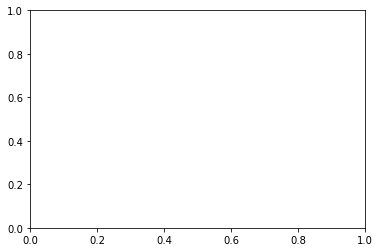

In [16]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
fig, ax = plt.subplots()

def update(frame):
    ax.clear()
    lag = frame + 1
    palette = sns.color_palette("brg", 1)

    lag_values = features_importances_granger_test[features_importances_granger_test['lag'] == lag]
    lag_values = lag_values.set_index('Feature').reindex(index=feature_importances_df['Feature']).reset_index()
    
    ax.bar(lag_values['Feature'], lag_values['p_value'], color=palette[0], label=f'Lag {lag}')
    
    plt.xticks(rotation=45, ha='right')
    plt.xlabel('Features')
    plt.ylabel('P-Values')
    plt.title(f'Granger Causality Test Results - Lag {lag}')

ani = animation.FuncAnimation(fig, update, frames=max_lag, repeat=False)
plt.show()


# Plotting actual VS predicted monthly returns on Bitcoin

KeyError: (slice(None, None, None), None)

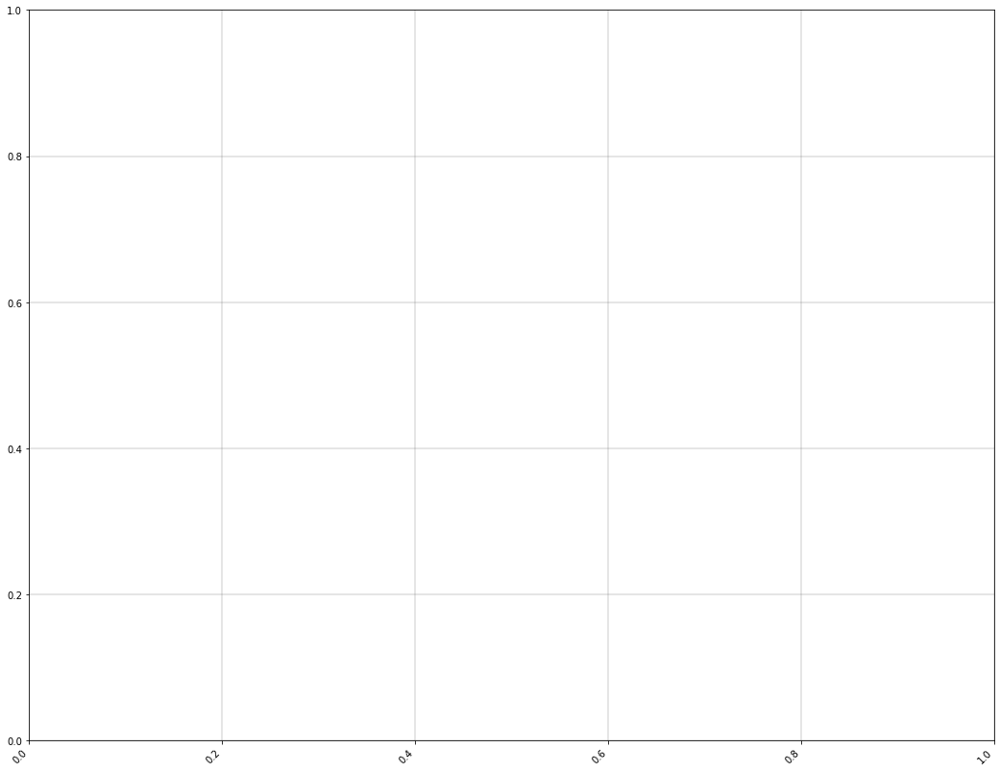

In [17]:
# Create a figure and axis object
fig, ax1 = plt.subplots(figsize=(18, 14))

plt.xticks(rotation=45, ha='right')
plt.grid(True, color = 'grey', linewidth = '0.4', linestyle = '-')


# Plot total momentum for each iteration on the primary y-axis
ax1.plot(return_dates, all_total_returns, color='blue', label='Predicted Returns')
ax1.set_xlabel('Date')
ax1.set_ylabel('Predicted Returns', color='blue')
ax1.tick_params(axis='y', labelcolor='blue')
ax1.set_title('Monthly Returns for Each Month Shift')

# Create a secondary y-axis and plot labels on it
ax2 = ax1.twinx()
ax2.plot(return_dates, btc_returns, color='red', label='Actual Returns')
ax2.set_ylabel('BTC Returns', color='red')
ax2.tick_params(axis='y', labelcolor='red')

plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=4))



# Show plot
plt.show()


# Bitcoin Investment Strategy

In [ ]:
# USGG10YR Index load
# We take the 10 years US GOV BOND to make it the risk free rate to invest 
# Data taken from Bloomberg in a monthly frequence accordingly to our other datasets


US_GOV_BOND_10Y = pd.read_excel("C:/Users/Virgile ROUMENS/Documents/Virgile Roumens/ESILV/A4/A4 Virgile/PI²/Datasets/USGG10YR Index.xlsx")
US_GOV_BOND_10Y=pd.DataFrame(US_GOV_BOND_10Y)
US_GOV_BOND_10Y=US_GOV_BOND_10Y.drop(columns='Date')
US_GOV_BOND_10Y=US_GOV_BOND_10Y/100

print(US_GOV_BOND_10Y.head(120))

     Last Price
0      0.023531
1      0.021801
2      0.022179
3      0.020368
4      0.021421
..          ...
106    0.043396
107    0.045711
108    0.049307
109    0.043264
110    0.038791

[111 rows x 1 columns]


# Detecting signals

In [ ]:
# Basically, I make my decisions of signals with a selection of treshold 
# in my predicted monthly returns of BTC.

# List to store signals
signals = []


for i in range(len(all_total_returns)):
    
    if all_total_returns.values[i]<0:
        signals.append("Hold")
        print('Hold:',btc_returns.values[i])
    elif all_total_returns.values[i]>0 and all_total_returns.values[i]<0.02:
        signals.append("Long1")
        print('Long1:',btc_returns.values[i])

    elif all_total_returns.values[i]>0.02 and all_total_returns.values[i]<0.04:
        signals.append("Long2")
        print('Long2:',btc_returns.values[i])

    else:
        signals.append("Long3")
        print('Long3:',btc_returns.values[i])


signals=pd.DataFrame(signals)





Long2: [0.009936]
Long3: [0.03724843]
Hold: [-0.03931392]
Long1: [-0.0076088]
Long3: [0.02468113]
Long3: [0.07893609]
Long3: [0.06015293]
Long2: [0.01491594]
Hold: [-0.03937483]
Long2: [0.02975632]
Long1: [-0.0027113]
Long2: [0.02376895]
Long1: [0.00400719]
Long3: [0.09539342]
Hold: [0.0052969]
Hold: [-0.03481718]
Long2: [0.01428181]
Long1: [0.01061776]
Long2: [0.0294813]
Long1: [0.01843323]
Long3: [0.06641863]
Long1: [0.00322663]
Long3: [0.0598852]
Hold: [-0.03786234]
Long3: [0.05638039]
Long3: [0.15020259]
Long1: [0.04238818]
Hold: [-0.01061598]
Long3: [0.13961412]
Hold: [-0.00525256]
Long3: [0.06699756]
Long1: [0.07471813]
Long3: [0.19723325]
Hold: [0.03322474]
Hold: [-0.11005138]
Long2: [0.04188529]
Hold: [-0.08712222]
Long3: [0.05572696]
Hold: [-0.03996591]
Hold: [-0.04028985]
Long3: [0.03064321]
Hold: [-0.02957233]
Long1: [0.00382817]
Long1: [0.00016961]
Long1: [0.00011194]
Hold: [-0.12726775]
Long3: [0.01349316]
Hold: [-0.02697453]
Long2: [0.02709795]
Long2: [0.01316593]
Long3: 

# Backtesting of the strategy with a monthly rebalancing frequency giving Bitcoin/Risk Free Rate exposures in different proportions

In [ ]:
portfolio_value_df=[]  # List to store portfolio values over time
btc_holdings_df=[]  # List to store BTC holdings over time
portfolio_value = 100  # Initial portfolio value
btc_holdings = 0  # Initial BTC holdings

# Iterate through return dates
for i in range(len(return_dates)):
    # Print date, signal, and BTC price
    print("\n", return_dates[i], signals.values[i], " | ", round(dataset_prices['btc_Dernier Prix'][199 + 4 * i]), "$/BTC")
    print('Portfolio value : $', round(portfolio_value, 2), '\t', round(btc_holdings, 3), ' BTC')
    
    # Extract signal for the current date
    signal = signals.values[i]

    # Determine portfolio allocation based on signal
    if signal == 'Long1':
        btc_allocation = 0.5
        risk_free_allocation = 0.5
    elif signal == 'Long2':
        btc_allocation = 0.75
        risk_free_allocation = 0.25
    elif signal == 'Long3':
        btc_allocation = 1
        risk_free_allocation = 0
    else:
        btc_allocation = 0
        risk_free_allocation = 1
    
    # Calculate BTC portion of the portfolio
    btc_part = btc_allocation * portfolio_value * (1 + btc_returns[0][i])  # Update Bitcoin portion of portfolio with the ACTUAL monthly return of BTC of the current month
    
    # Calculate risk-free portion of the portfolio
    risk_free_return = (1 + 0.04 / 12) ** (1 / 12) - 1  # Adjust annual rate to monthly rate
    risk_free_part = float(risk_free_allocation * portfolio_value * (1 + US_GOV_BOND_10Y.iloc[i])) # Update risk-free portion of portfolio
    
    # Update total portfolio value
    portfolio_value = btc_part + risk_free_part
    
    # Calculate BTC holdings based on the current BTC price
    btc_holdings = portfolio_value / dataset_prices['btc_Dernier Prix'][199 + 4 * i ] # divide by the actual value of BTC  in the current month
    
    # Append portfolio value and BTC holdings to their respective lists
    portfolio_value_df.append(portfolio_value)
    btc_holdings_df.append(btc_holdings)

# Print final portfolio value and BTC holdings
print("\nFinal portfolio value : $", round(portfolio_value, 2), '\t', round(btc_holdings, 3), 'BTC')

# Convert lists to DataFrames
portfolio_value_df=pd.DataFrame(portfolio_value_df)
btc_holdings_df=pd.DataFrame(btc_holdings_df)



 2015-06-28 ['Long2']  |  244 $/BTC
Portfolio value : $ 100 	 0  BTC

 2015-07-26 ['Long3']  |  282 $/BTC
Portfolio value : $ 101.33 	 0.416  BTC

 2015-08-23 ['Hold']  |  239 $/BTC
Portfolio value : $ 105.11 	 0.373  BTC

 2015-09-20 ['Long1']  |  231 $/BTC
Portfolio value : $ 107.44 	 0.45  BTC

 2015-10-18 ['Long3']  |  255 $/BTC
Portfolio value : $ 108.12 	 0.468  BTC

 2015-11-15 ['Long3']  |  333 $/BTC
Portfolio value : $ 110.79 	 0.435  BTC

 2015-12-13 ['Long3']  |  418 $/BTC
Portfolio value : $ 119.54 	 0.359  BTC

 2016-01-10 ['Long2']  |  442 $/BTC
Portfolio value : $ 126.73 	 0.303  BTC

 2016-02-07 ['Hold']  |  376 $/BTC
Portfolio value : $ 128.76 	 0.291  BTC

 2016-03-06 ['Long2']  |  422 $/BTC
Portfolio value : $ 130.99 	 0.348  BTC

 2016-04-03 ['Long1']  |  417 $/BTC
Portfolio value : $ 134.48 	 0.319  BTC

 2016-05-01 ['Long2']  |  458 $/BTC
Portfolio value : $ 135.49 	 0.325  BTC

 2016-05-29 ['Long1']  |  465 $/BTC
Portfolio value : $ 138.52 	 0.302  BTC

 2016-06

# Plotting Backtest Strategy and its performances

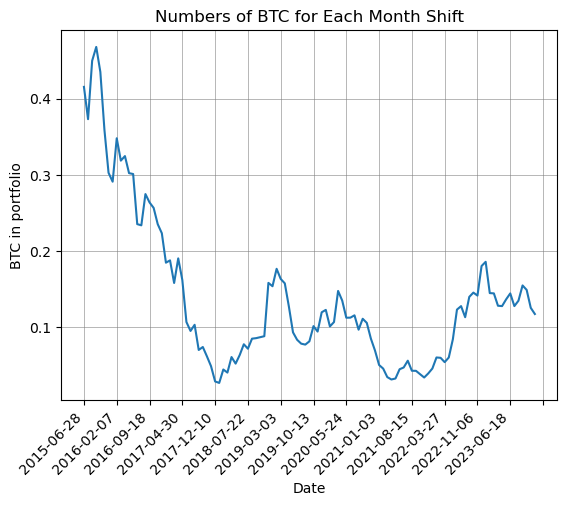

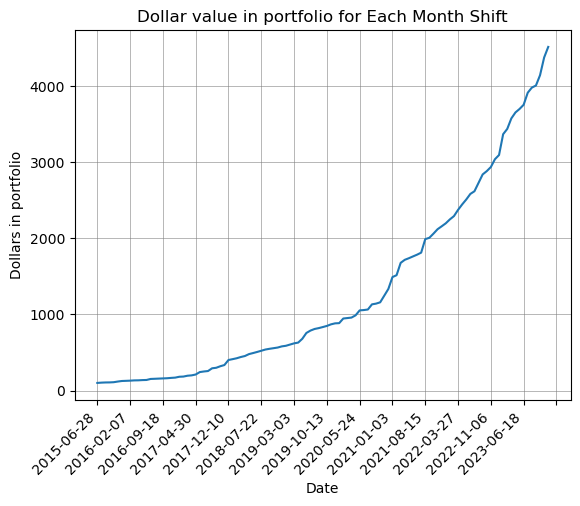

Annualized Returns: 0    0.427215
dtype: float64
Annualized Volatility: 0    0.11357
dtype: float64
Sharpe Ratio: 0    0.98118
dtype: float64
Maximum Drawdown: 0    0.0
Name: 110, dtype: float64


In [ ]:
# Plotting BTC holdings over time
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.grid(True, color='grey', linewidth='0.4', linestyle='-')  # Add gridlines to the plot
plt.plot(return_dates, btc_holdings_df)  # Plot BTC holdings
plt.xlabel('Date')  # Set x-axis label
plt.ylabel('BTC in portfolio')  # Set y-axis label
plt.title('Numbers of BTC for Each Month Shift')  # Set plot title
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=8))  # Set major locator for x-axis dates
plt.show()  # Display the plot

# Plotting portfolio value over time
plt.xticks(rotation=45, ha='right')  # Rotate x-axis labels for better readability
plt.grid(True, color='grey', linewidth='0.4', linestyle='-')  # Add gridlines to the plot
plt.plot(return_dates, portfolio_value_df)  # Plot portfolio value
plt.xlabel('Date')  # Set x-axis label
plt.ylabel('Dollars in portfolio')  # Set y-axis label
plt.title('Dollar value in portfolio for Each Month Shift')  # Set plot title
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=8))  # Set major locator for x-axis dates
plt.show()  # Display the plot



# Calculate daily returns from portfolio value
monthly_returns = portfolio_value_df.pct_change()
#print(monthly_returns.head(40))

# Compute annualized returns
average_monthly_return = monthly_returns.mean()
#print(average_monthly_return)

annualized_return = average_monthly_return * 12
#print(annualized_return)

# Compute annualized volatility
monthly_volatility = monthly_returns.std()
annualized_volatility = monthly_volatility * np.sqrt(12)

# Annualizing our monthly based risk-free rate
risk_free_rate = (1+float(US_GOV_BOND_10Y.mean()))**12 - 1
#print("Annualized risk free rate : ", risk_free_rate)

# Compute Sharpe ratio
sharpe_ratio = (annualized_return - risk_free_rate) / annualized_volatility

# Maximum Drawdown
max_drawdown = (portfolio_value_df/portfolio_value_df.cummax() - 1).cummin().iloc[-1]



print("Annualized Returns:", annualized_return)
print("Annualized Volatility:", annualized_volatility)
print("Sharpe Ratio:", sharpe_ratio)
print("Maximum Drawdown:", max_drawdown)

# Backtesting of an 'ALL-IN' Bitcoin investment and the performances measures of this strategy


 2015-06-28  |  38371 $/BTC
Portfolio value : $ 100 	 0  BTC
After investing $100 in BTC in 2015-06-28 : 

 2015-06-28  |  244 $/BTC
Portfolio value : $ 100 	 0.41  BTC

 2015-07-26  |  282 $/BTC
Portfolio value : $ 100.0 	 0.41  BTC

 2015-08-23  |  239 $/BTC
Portfolio value : $ 115.5 	 0.41  BTC

 2015-09-20  |  231 $/BTC
Portfolio value : $ 97.96 	 0.41  BTC

 2015-10-18  |  255 $/BTC
Portfolio value : $ 94.75 	 0.41  BTC

 2015-11-15  |  333 $/BTC
Portfolio value : $ 104.42 	 0.41  BTC

 2015-12-13  |  418 $/BTC
Portfolio value : $ 136.54 	 0.41  BTC

 2016-01-10  |  442 $/BTC
Portfolio value : $ 171.62 	 0.41  BTC

 2016-02-07  |  376 $/BTC
Portfolio value : $ 181.35 	 0.41  BTC

 2016-03-06  |  422 $/BTC
Portfolio value : $ 154.31 	 0.41  BTC

 2016-04-03  |  417 $/BTC
Portfolio value : $ 172.99 	 0.41  BTC

 2016-05-01  |  458 $/BTC
Portfolio value : $ 171.09 	 0.41  BTC

 2016-05-29  |  465 $/BTC
Portfolio value : $ 187.87 	 0.41  BTC

 2016-06-26  |  652 $/BTC
Portfolio value

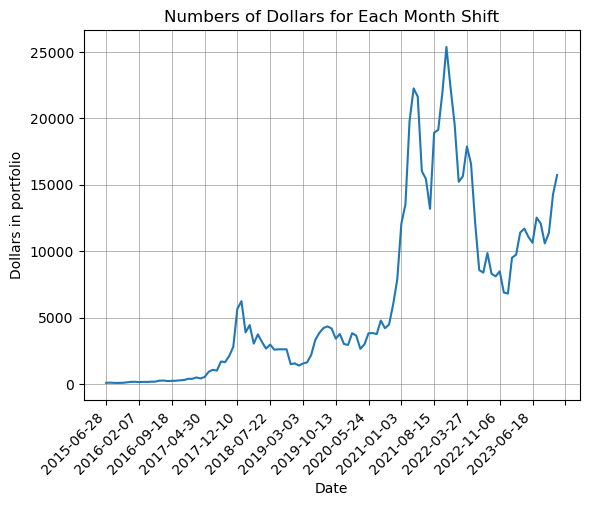

Annualized Returns: 0    0.835371
dtype: float64
Annualized Volatility: 0    0.787901
dtype: float64
Sharpe Ratio: 0    0.659459
dtype: float64
Maximum Drawdown: 0   -0.775469
Name: 110, dtype: float64


In [ ]:
portfolio_value_df=[]  # List to store portfolio values over time
btc_holdings_df=[]  # List to store BTC holdings over time
portfolio_value = 100  # Initial portfolio value
btc_holdings = 0  # Initial BTC holdings

# Iterate through return dates


print("\n", return_dates[0],  " | ", round(dataset_prices['btc_Dernier Prix'][199 + 4 * i]), "$/BTC")
print('Portfolio value : $', round(portfolio_value, 2), '\t', round(btc_holdings, 3), ' BTC')
    
print('After investing $100 in BTC in 2015-06-28 : ')

    
    
btc_holdings = 100 / dataset_prices['btc_Dernier Prix'][199 + 4 * 0] # Divide by the value of BTC at the end of the month (begining of the next month)
    

for i in range(len(return_dates)):
    print("\n", return_dates[i],  " | ", round(dataset_prices['btc_Dernier Prix'][199 + 4 * i]), "$/BTC")
    print('Portfolio value : $', round(portfolio_value, 2), '\t', round(btc_holdings, 3), ' BTC')
    
    portfolio_value = btc_holdings * dataset_prices['btc_Dernier Prix'][199 + 4 * i]

    portfolio_value_df.append(portfolio_value)

print("\nFinal portfolio value : $", round(portfolio_value, 2), '\t', round(btc_holdings, 3), 'BTC')


portfolio_value_df=pd.DataFrame(portfolio_value_df)
btc_holdings_df=pd.DataFrame(btc_holdings_df)



# Plotting FULL BTC invested Strategy


plt.grid(True, color = 'grey', linewidth = '0.4', linestyle = '-')
plt.xticks(rotation=45, ha='right')
plt.plot(return_dates, portfolio_value_df)
plt.gca().xaxis.set_major_locator(mdates.DayLocator(interval=8))
plt.xlabel('Date')
plt.ylabel('Dollars in portfolio')
plt.title('Numbers of Dollars for Each Month Shift')
plt.show()


#   MUST MAKE SURE THAT WE annualize vol/returns with Month?Week?Day?

# Same for the risk free rate ? 

# Calculate daily returns from portfolio value
monthly_returns = portfolio_value_df.pct_change()
#print(monthly_returns.head(40))

# Compute annualized returns
average_monthly_return = monthly_returns.mean()
#print(average_monthly_return)

annualized_return = average_monthly_return * 12
#print(annualized_return)

# Compute annualized volatility
monthly_volatility = monthly_returns.std()
annualized_volatility = monthly_volatility * np.sqrt(12)

# Assuming a risk-free rate of 0.04 (you can adjust this value accordingly)
risk_free_rate = (1+float(US_GOV_BOND_10Y.mean()))**12 - 1

# Compute Sharpe ratio
sharpe_ratio = (annualized_return - risk_free_rate) / annualized_volatility

# Maximum Drawdown
max_drawdown = (portfolio_value_df/portfolio_value_df.cummax() - 1).cummin().iloc[-1]



print("Annualized Returns:", annualized_return)
print("Annualized Volatility:", annualized_volatility)
print("Sharpe Ratio:", sharpe_ratio)
print("Maximum Drawdown:", max_drawdown)
